In [1]:
import re
import gensim
from gensim.models import Word2Vec
from gensim.utils import simple_preprocess
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download()
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

NLTK Downloader
---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> l
Packages:
  [ ] abc................. Australian Broadcasting Commission 2006
  [ ] alpino.............. Alpino Dutch Treebank
  [ ] averaged_perceptron_tagger Averaged Perceptron Tagger
  [ ] averaged_perceptron_tagger_eng Averaged Perceptron Tagger (JSON)
  [ ] averaged_perceptron_tagger_ru Averaged Perceptron Tagger (Russian)
  [ ] averaged_perceptron_tagger_rus Averaged Perceptron Tagger (Russian)
  [ ] basque_grammars..... Grammars for Basque
  [ ] bcp47............... BCP-47 Language Tags
  [ ] biocreative_ppi..... BioCreAtIvE (Critical Assessment of Information
                           Extraction Systems in Biology)
  [ ] bllip_wsj_no_aux.... BLLIP Parser: WSJ Model
  [ 

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [2]:

import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords


nltk.download('stopwords')

def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    words = word_tokenize(text)
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]

    return words


# Example corpus
corpus = [
    "In machine learning, models are trained using data to make predictions or decisions without being explicitly programmed to perform the task.",
    "Natural language processing (NLP) is a field that focuses on the interaction between computers and human language.",
    "Word embeddings map words or phrases in a vocabulary to vectors of real numbers, allowing the model to understand semantic relationships.",
    "The field of artificial intelligence (AI) seeks to create machines that can perform tasks that typically require human intelligence.",
    "Deep learning, a subset of machine learning, uses neural networks with many layers to learn from large amounts of data.",
    "In a convolutional neural network (CNN), layers are connected in such a way that they form a deep network capable of learning intricate patterns.",
    "Reinforcement learning involves an agent that learns to make decisions by taking actions in an environment to maximize cumulative rewards.",
    "Support vector machines (SVMs) are supervised learning models that analyze data and recognize patterns for classification and regression analysis.",
    "In unsupervised learning, the model learns from unlabeled data, trying to identify patterns or groupings in the data.",
    "Transfer learning is a technique where a model trained on one task is adapted to perform a related but different task."
]

# Apply detailed preprocessing to each document in the corpus
processed_corpus = [preprocess(doc) for doc in corpus]

print(processed_corpus)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


[['machine', 'learning', 'model', 'trained', 'using', 'data', 'make', 'prediction', 'decision', 'without', 'explicitly', 'programmed', 'perform', 'task'], ['natural', 'language', 'processing', 'nlp', 'field', 'focus', 'interaction', 'computer', 'human', 'language'], ['word', 'embeddings', 'map', 'word', 'phrase', 'vocabulary', 'vector', 'real', 'number', 'allowing', 'model', 'understand', 'semantic', 'relationship'], ['field', 'artificial', 'intelligence', 'ai', 'seek', 'create', 'machine', 'perform', 'task', 'typically', 'require', 'human', 'intelligence'], ['deep', 'learning', 'subset', 'machine', 'learning', 'us', 'neural', 'network', 'many', 'layer', 'learn', 'large', 'amount', 'data'], ['convolutional', 'neural', 'network', 'cnn', 'layer', 'connected', 'way', 'form', 'deep', 'network', 'capable', 'learning', 'intricate', 'pattern'], ['reinforcement', 'learning', 'involves', 'agent', 'learns', 'make', 'decision', 'taking', 'action', 'environment', 'maximize', 'cumulative', 'reward'

In [4]:
import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from gensim.models import Word2Vec

# Download necessary NLTK data files
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()

# Set of stopwords from NLTK
stop_words = set(stopwords.words('english'))

def preprocess(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove punctuation and non-word characters
    text = re.sub(r'[^\w\s]', '', text)
    # Tokenize the text into words
    words = word_tokenize(text)
    # Lemmatize and remove stopwords
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]

    return words

# Example corpus
corpus = [
    "In machine learning, models are trained using data to make predictions or decisions without being explicitly programmed to perform the task.",
    "Natural language processing (NLP) is a field that focuses on the interaction between computers and human language.",
    "Word embeddings map words or phrases in a vocabulary to vectors of real numbers, allowing the model to understand semantic relationships.",
    "The field of artificial intelligence (AI) seeks to create machines that can perform tasks that typically require human intelligence.",
    "Deep learning, a subset of machine learning, uses neural networks with many layers to learn from large amounts of data.",
    "In a convolutional neural network (CNN), layers are connected in such a way that they form a deep network capable of learning intricate patterns.",
    "Reinforcement learning involves an agent that learns to make decisions by taking actions in an environment to maximize cumulative rewards.",
    "Support vector machines (SVMs) are supervised learning models that analyze data and recognize patterns for classification and regression analysis.",
    "In unsupervised learning, the model learns from unlabeled data, trying to identify patterns or groupings in the data.",
    "Transfer learning is a technique where a model trained on one task is adapted to perform a related but different task."
]

# Apply preprocessing to each document in the corpus
processed_corpus = [preprocess(doc) for doc in corpus]

# Initialize the Word2Vec model
model = Word2Vec(
    sentences=processed_corpus,  # Use preprocessed corpus
    vector_size=100,             # Dimensionality of the word vectors
    window=5,                    # Context window size
    sg=1,                        # Training algorithm: 1 for skip-gram; 0 for CBOW
    min_count=1,                 # Minimum word frequency threshold
    workers=4                    # Number of worker threads
)

# Build the vocabulary from the processed corpus
model.build_vocab(processed_corpus)

# Train the Word2Vec model
model.train(
    processed_corpus,
    total_examples=model.corpus_count,
    epochs=10  # Number of training epochs
)

# Save the model for future use
model.save("word2vec_model.model")




[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Vector for 'analyze': [-6.8019720e-04  1.5490479e-03 -1.1310746e-03 -4.0184474e-03
  9.4194454e-04 -9.8618446e-03  1.4346213e-03 -3.8609263e-03
 -5.8592372e-03  3.6513687e-03  1.4459601e-03  3.5002241e-03
  9.0583734e-04 -9.4254538e-03  1.0049464e-02 -3.5511348e-03
 -2.1074244e-03  7.0059560e-03  6.4933061e-05  2.8319310e-03
  2.3557162e-03  2.4709639e-03  6.8134437e-03  9.3969572e-03
 -5.6023896e-04 -3.4402320e-03  4.3727304e-03 -8.2925567e-03
  8.3427522e-03  2.4078004e-03  6.0366620e-03  2.7150766e-03
 -1.2789905e-03  7.0090767e-04 -4.8826695e-03  9.2595574e-03
  5.1598656e-03  3.5392996e-03 -5.0598164e-03 -8.7784026e-03
  7.8695724e-03  2.9693423e-03 -4.3797470e-03 -8.6650895e-03
 -3.8639931e-03  1.3982647e-03 -9.2631374e-03  4.7869587e-05
  2.8966239e-03 -9.7869914e-03 -2.0105796e-04 -6.1661173e-03
 -3.6795081e-03 -1.6268435e-03 -9.8530250e-03 -3.5871996e-03
 -6.9274465e-03 -7.3985611e-03  1.5495226e-03  2.3419447e-03
  9.2176432e-03  8.8799149e-03 -6.4130207e-03 -9.2394287e-03
  

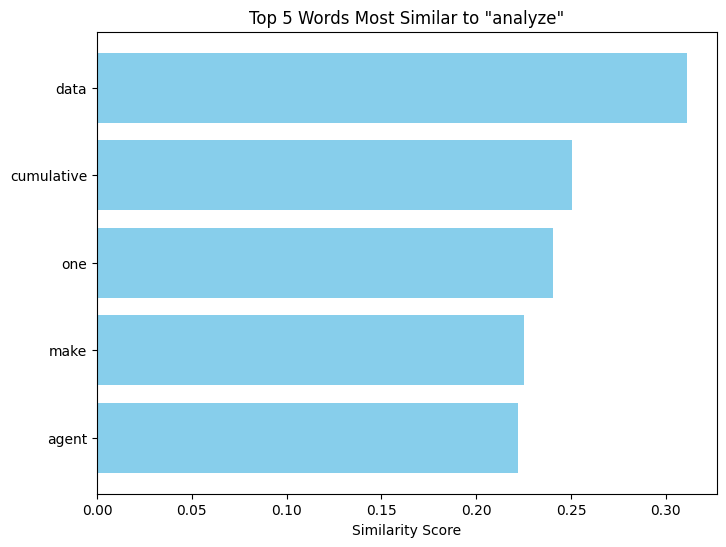

In [8]:
from gensim.models import Word2Vec

# [TODO-7] Load the trained model
model = Word2Vec.load("word2vec_model.model")

# [TODO-8] Set your targeted word and get the vector for that word
your_word = 'analyze'  # Example word; as a user i want to  choose any word in the vocabulary from above
word_vector = model.wv[your_word]
print(f"Vector for '{your_word}': {word_vector}")

# [TODO-9] Find most similar words
similar_words = model.wv.most_similar(your_word, topn=5)  # topn is the number of similar words to return
print(f"Most similar words to '{your_word}': {similar_words}")

# [TODO-10] Find similarity between two words
your_second_word = 'model'  # Example second word
similarity = model.wv.similarity(your_word, your_second_word)
print(f"Similarity between '{your_word}' and '{your_second_word}': {similarity}")
# Extract words and similarity scores
words, scores = zip(*similar_words)

# Plot the bar chart for similar words
plt.figure(figsize=(8, 6))
plt.barh(words, scores, color='skyblue')
plt.xlabel('Similarity Score')
plt.title(f'Top 5 Words Most Similar to "{your_word}"')
plt.gca().invert_yaxis()  # Invert the y-axis for better readability
plt.show()




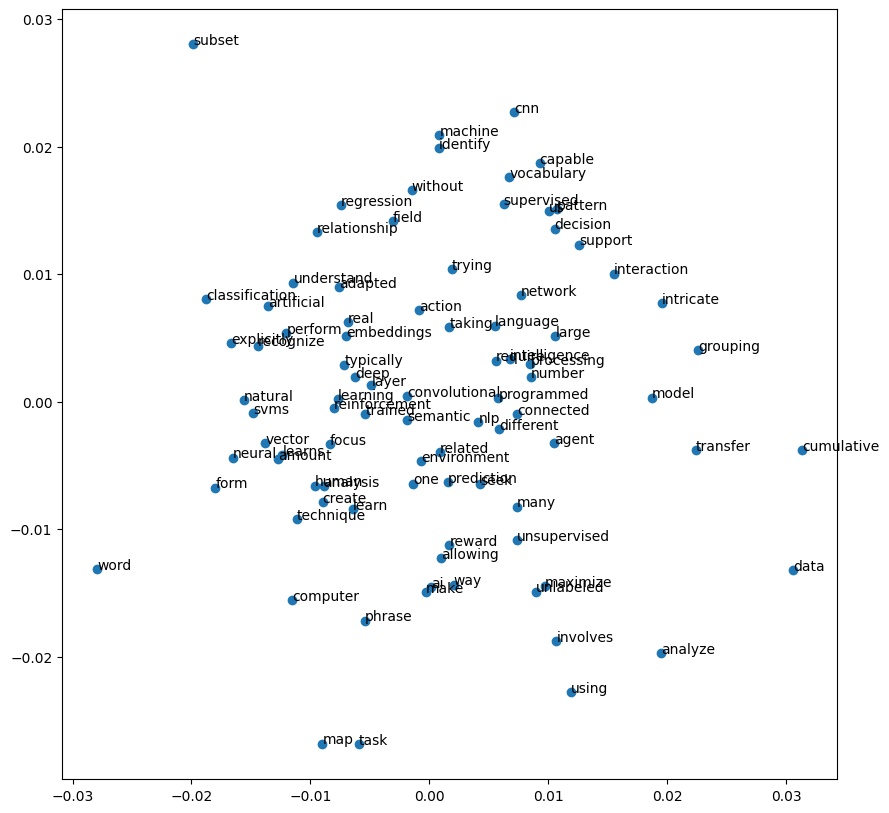

In [9]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Get the word vectors
word_vectors = model.wv

# Get a list of words in the model
words = list(word_vectors.index_to_key)

# Get the word vectors for all words in the vocabulary
vectors = [word_vectors[word] for word in words]

# Reduce dimensions with PCA
pca = PCA(n_components=2)
result = pca.fit_transform(vectors)

# Plot the words on a 2D plane
plt.figure(figsize=(10, 10))
plt.scatter(result[:, 0], result[:, 1])

# Annotate the points with words
for i, word in enumerate(words):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))

plt.show()


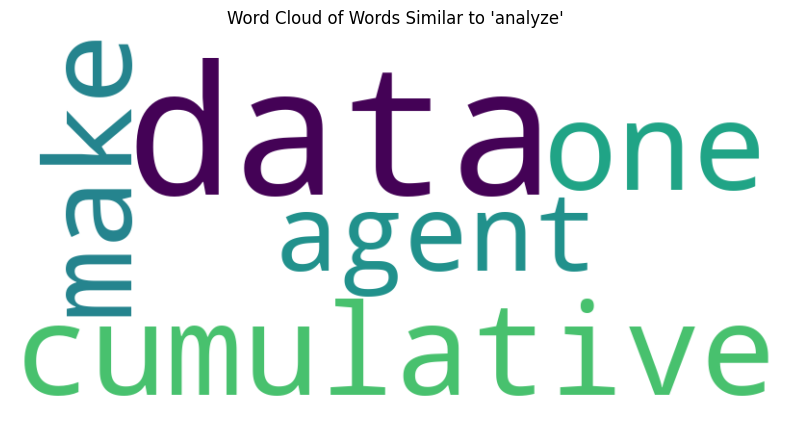

In [11]:
from wordcloud import WordCloud

# Prepare data for the word cloud
word_freq = {word: score for word, score in similar_words}

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title(f"Word Cloud of Words Similar to '{your_word}'")
plt.show()


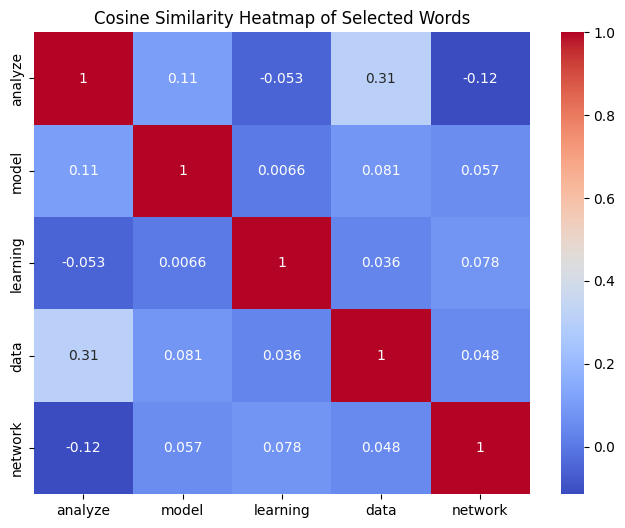

In [12]:
import seaborn as sns

# Choose a set of words from your vocabulary
selected_words = ['analyze', 'model', 'learning', 'data', 'network']  # Example subset
similarity_matrix = []

# Calculate cosine similarities between each pair of selected words
for word1 in selected_words:
    row = []
    for word2 in selected_words:
        row.append(model.wv.similarity(word1, word2))
    similarity_matrix.append(row)

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(similarity_matrix, annot=True, xticklabels=selected_words, yticklabels=selected_words, cmap='coolwarm')
plt.title('Cosine Similarity Heatmap of Selected Words')
plt.show()


In [24]:
import os
from gensim.models import Word2Vec
import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Function for preprocessing text
def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    words = word_tokenize(text)  # Tokenize words
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]  # Remove stopwords and lemmatize
    return words

# Sample corpus
corpus = [
    "In machine learning, models are trained using data to make predictions or decisions without being explicitly programmed to perform the task.",
    "Natural language processing (NLP) is a field that focuses on the interaction between computers and human language.",
    "Word embeddings map words or phrases in a vocabulary to vectors of real numbers, allowing the model to understand semantic relationships.",
    "The field of artificial intelligence (AI) seeks to create machines that can perform tasks that typically require human intelligence.",
    "Deep learning, a subset of machine learning, uses neural networks with many layers to learn from large amounts of data.",
    "In a convolutional neural network (CNN), layers are connected in such a way that they form a deep network capable of learning intricate patterns.",
    "Reinforcement learning involves an agent that learns to make decisions by taking actions in an environment to maximize cumulative rewards.",
    "Support vector machines (SVMs) are supervised learning models that analyze data and recognize patterns for classification and regression analysis.",
    "In unsupervised learning, the model learns from unlabeled data, trying to identify patterns or groupings in the data.",
    "Transfer learning is a technique where a model trained on one task is adapted to perform a related but different task."
]

# Apply preprocessing to each document in the corpus
processed_corpus = [preprocess(doc) for doc in corpus]

# Hyperparameters to tune
dims = [10, 50, 100]     # Vector dimensions
windows = [3, 5, 10]     # Context window sizes
epochs = [1, 10, 100]    # Number of training epochs

# Directory to save models
models_dir = '/content/word2vec_models1'
os.makedirs(models_dir, exist_ok=True)

# Train and save Word2Vec models with different hyperparameters
for dim in dims:
    for window in windows:
        for epoch in epochs:
            print(f"Training model with dim={dim}, window={window}, epochs={epoch}")
            model = Word2Vec(sentences=processed_corpus, vector_size=dim, window=window, min_count=1, workers=4, epochs=epoch)

            # Define the model file name
            model_filename = f"word2vec_model_dim{dim}_window{window}_epochs{epoch}.model"
            model_path = os.path.join(models_dir, model_filename)

            # Save the model
            model.save(model_path)
            print(f"Model saved: {model_path}")



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Training model with dim=10, window=3, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs1.model
Training model with dim=10, window=3, epochs=10
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs10.model
Training model with dim=10, window=3, epochs=100
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs100.model
Training model with dim=10, window=5, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs1.model
Training model with dim=10, window=5, epochs=10
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs10.model
Training model with dim=10, window=5, epochs=100
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs100.model
Training model with dim=10, window=10, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window10_epochs1.model
Training model with dim=10, window=10, epochs=10
Model saved: /content/word2vec_mod

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Training model with dim=10, window=3, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs1.model
Training model with dim=10, window=3, epochs=10
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs10.model
Training model with dim=10, window=3, epochs=100
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs100.model
Training model with dim=10, window=5, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs1.model
Training model with dim=10, window=5, epochs=10
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs10.model
Training model with dim=10, window=5, epochs=100
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs100.model
Training model with dim=10, window=10, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window10_epochs1.model
Training model with dim=10, window=10, epochs=10
Model saved: /content/word2vec_mod

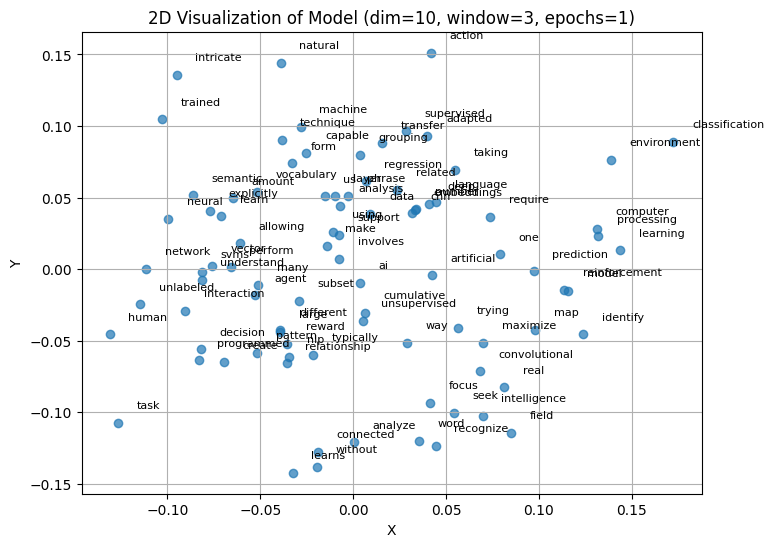

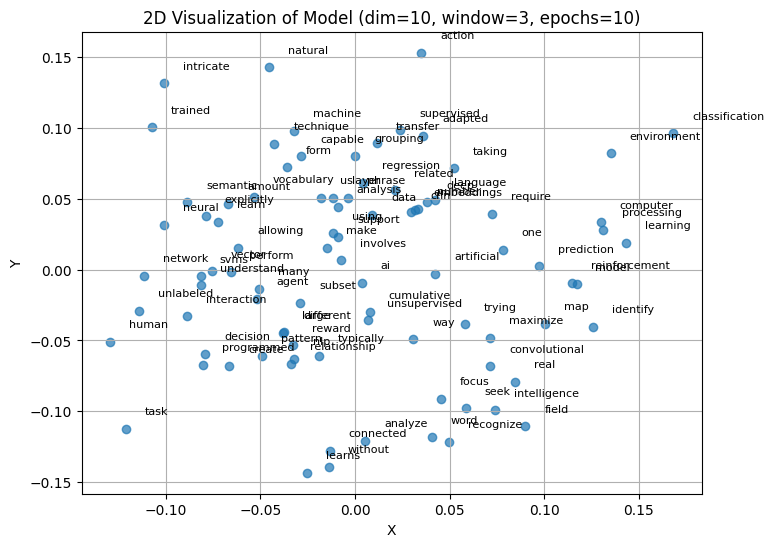

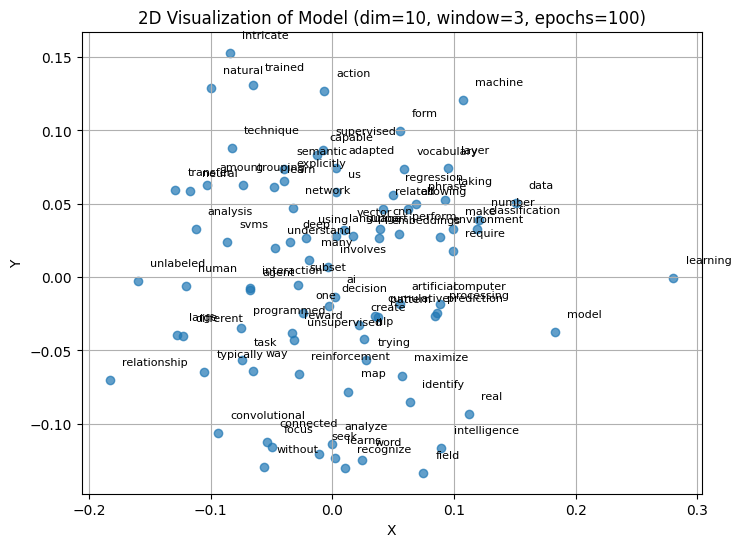

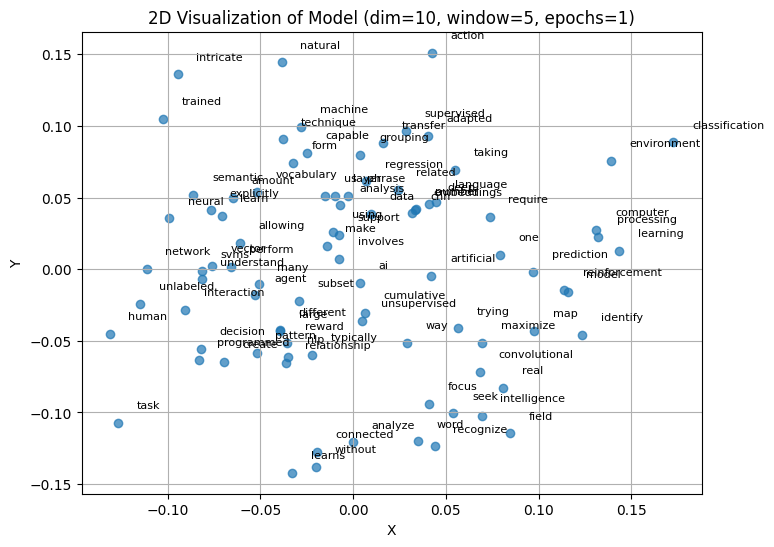

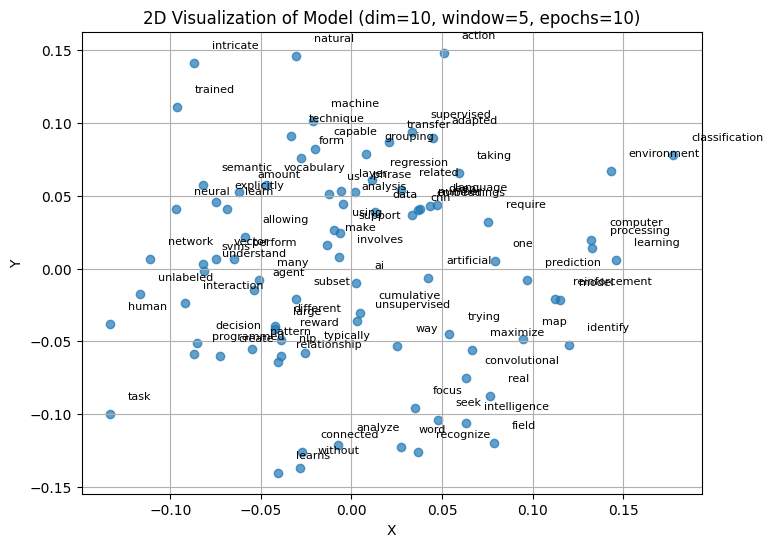

...

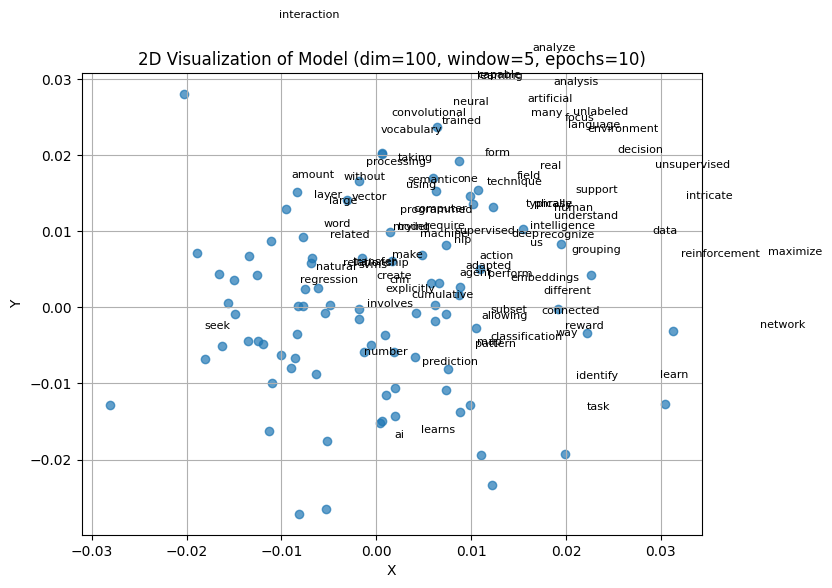

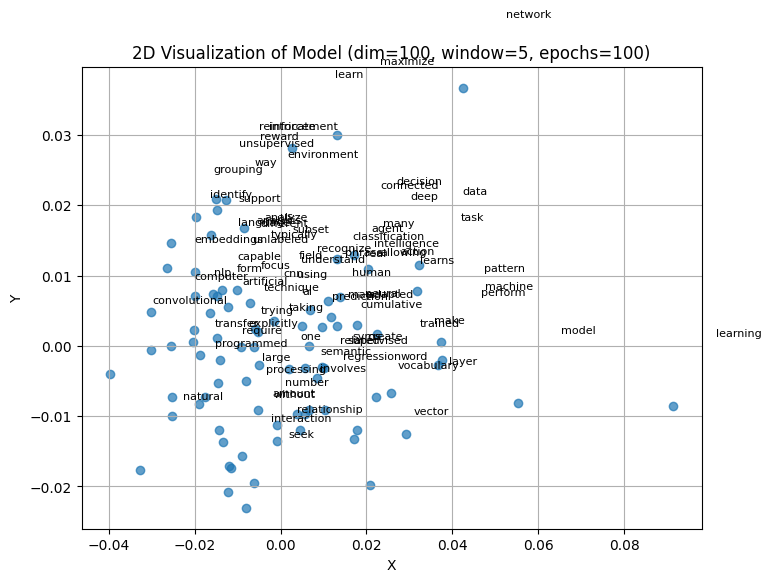

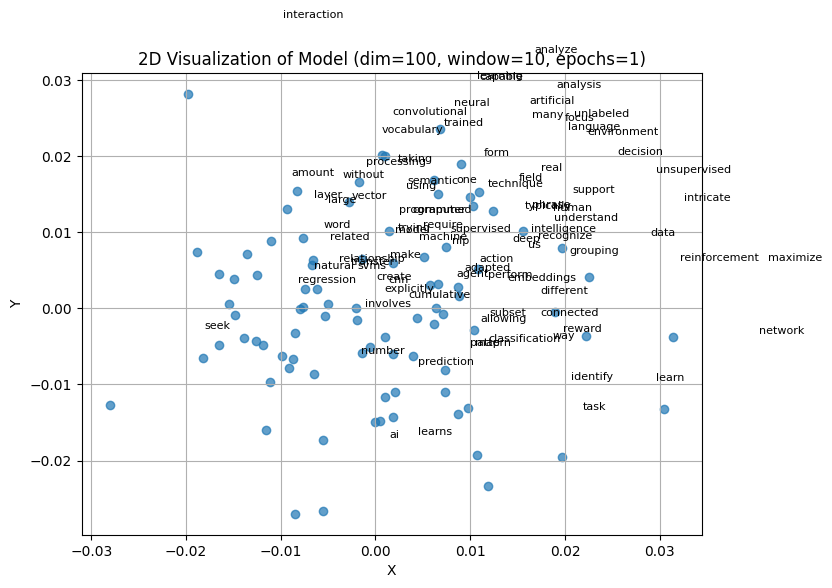

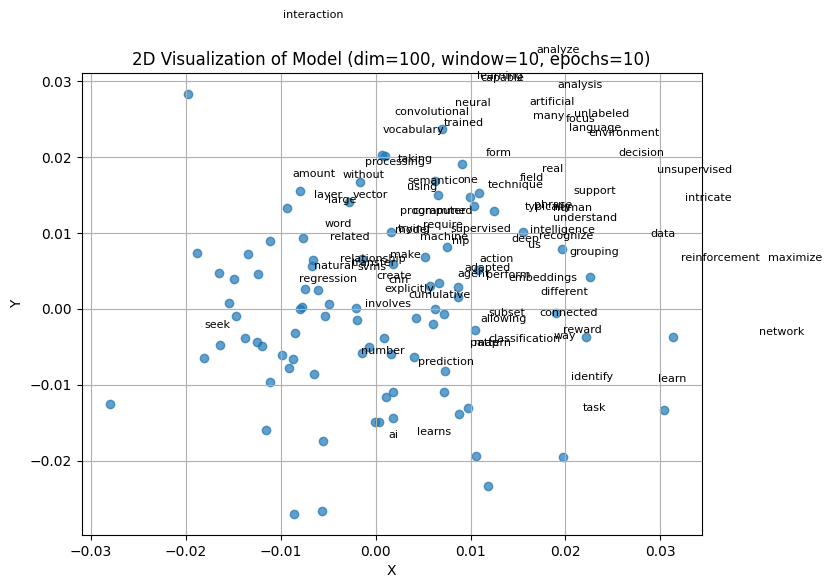

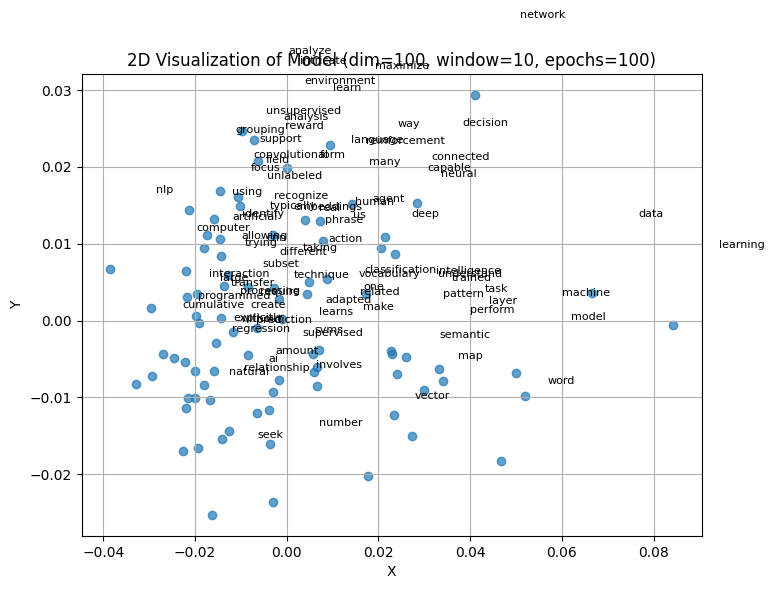

In [29]:
 import os
from gensim.models import Word2Vec
import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Function for preprocessing text
def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    words = word_tokenize(text)  # Tokenize words
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]  # Remove stopwords and lemmatize
    return words

# Sample corpus
corpus = [
    "In machine learning, models are trained using data to make predictions or decisions without being explicitly programmed to perform the task.",
    "Natural language processing (NLP) is a field that focuses on the interaction between computers and human language.",
    "Word embeddings map words or phrases in a vocabulary to vectors of real numbers, allowing the model to understand semantic relationships.",
    "The field of artificial intelligence (AI) seeks to create machines that can perform tasks that typically require human intelligence.",
    "Deep learning, a subset of machine learning, uses neural networks with many layers to learn from large amounts of data.",
    "In a convolutional neural network (CNN), layers are connected in such a way that they form a deep network capable of learning intricate patterns.",
    "Reinforcement learning involves an agent that learns to make decisions by taking actions in an environment to maximize cumulative rewards.",
    "Support vector machines (SVMs) are supervised learning models that analyze data and recognize patterns for classification and regression analysis.",
    "In unsupervised learning, the model learns from unlabeled data, trying to identify patterns or groupings in the data.",
    "Transfer learning is a technique where a model trained on one task is adapted to perform a related but different task."
]

# Apply preprocessing to each document in the corpus
processed_corpus = [preprocess(doc) for doc in corpus]

# Hyperparameters to tune
dims = [10, 50, 100]     # Vector dimensions
windows = [3, 5, 10]     # Context window sizes
epochs = [1, 10, 100]    # Number of training epochs

# Directory to save models
models_dir = '/content/word2vec_models1'
os.makedirs(models_dir, exist_ok=True)

# Train and save Word2Vec models with different hyperparameters
for dim in dims:
    for window in windows:
        for epoch in epochs:
            print(f"Training model with dim={dim}, window={window}, epochs={epoch}")
            model = Word2Vec(sentences=processed_corpus, vector_size=dim, window=window, min_count=1, workers=4, epochs=epoch)

            # Define the model file name
            model_filename = f"word2vec_model_dim{dim}_window{window}_epochs{epoch}.model"
            model_path = os.path.join(models_dir, model_filename)

            # Save the model
            model.save(model_path)
            print(f"Model saved: {model_path}")

# Function to plot the entire vocabulary embeddings in 2D
def plot_model_embeddings_2d(model, method='pca', title='2D Model Embeddings'):
    # Extract all word vectors from the model
    words = list(model.wv.index_to_key)
    word_vectors = np.array([model.wv[word] for word in words])

    # Choose dimensionality reduction method
    if method == 'pca':
        reducer = PCA(n_components=2)
    else:
        reducer = TSNE(n_components=2, random_state=42)

    # Reduce the word vectors to 2D
    embeddings_2d = reducer.fit_transform(word_vectors)

    plt.figure(figsize=(8, 6))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], marker='o', alpha=0.7)

    # Optionally annotate some words if needed
    for i, word in enumerate(words):
        plt.text(embeddings_2d[i, 0] + 0.01, embeddings_2d[i, 1] + 0.01, word, fontsize=8)

    plt.title(title)
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

# Plot 2D visualizations for each trained model
for dim in dims:
    for window in windows:
        for epoch in epochs:
            # Load the saved model
            model_filename = f"word2vec_model_dim{dim}_window{window}_epochs{epoch}.model"
            model_path = os.path.join(models_dir, model_filename)
            model = Word2Vec.load(model_path)

            # Plot 2D visualization of the entire model embeddings
            plot_model_embeddings_2d(model, method='pca', title=f'2D Visualization of Model (dim={dim}, window={window}, epochs={epoch})')



Similarity results for 'machine' and 'learning':
By Dimension: [(10, 0.105022), (10, 0.111441106), (10, 0.7752046), (10, 0.105005145), (10, 0.12279411), (10, 0.9028474), (10, 0.10551754), (10, 0.115033716), (10, 0.90649474), (50, -0.014797315), (50, -0.013857554), (50, 0.47913226), (50, -0.014513197), (50, -0.0076232357), (50, 0.747536), (50, -0.014157558), (50, -0.00989416), (50, 0.79314876), (100, -0.11161034), (100, -0.10944446), (100, 0.5356482), (100, -0.11129948), (100, -0.10445191), (100, 0.7857341), (100, -0.11082211), (100, -0.10604029), (100, 0.8291635)]
By Window Size: [(3, 0.105022), (3, 0.111441106), (3, 0.7752046), (5, 0.105005145), (5, 0.12279411), (5, 0.9028474), (10, 0.10551754), (10, 0.115033716), (10, 0.90649474), (3, -0.014797315), (3, -0.013857554), (3, 0.47913226), (5, -0.014513197), (5, -0.0076232357), (5, 0.747536), (10, -0.014157558), (10, -0.00989416), (10, 0.79314876), (3, -0.11161034), (3, -0.10944446), (3, 0.5356482), (5, -0.11129948), (5, -0.10445191), (5

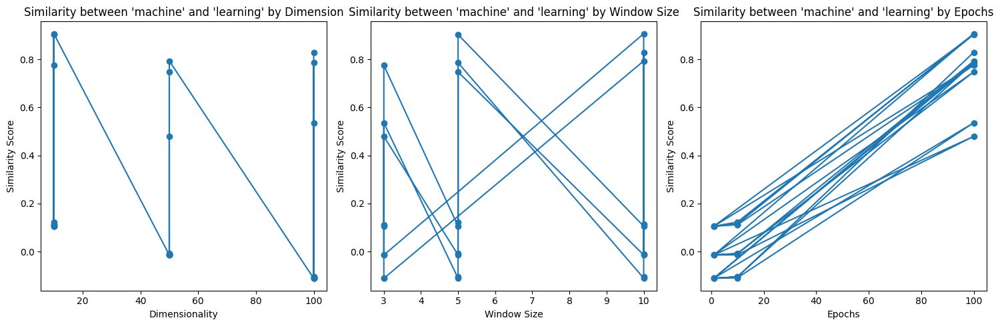


Similarity results for 'neural' and 'network':
By Dimension: [(10, 0.29131857), (10, 0.2912925), (10, 0.46265262), (10, 0.2913991), (10, 0.2883843), (10, 0.80148584), (10, 0.29121026), (10, 0.28998625), (10, 0.83368564), (50, 0.2244735), (50, 0.22533354), (50, 0.46966085), (50, 0.22444528), (50, 0.22552423), (50, 0.7175349), (50, 0.22447668), (50, 0.22665577), (50, 0.7718832), (100, -0.105154626), (100, -0.103265986), (100, 0.27582964), (100, -0.104966864), (100, -0.1029789), (100, 0.6488991), (100, -0.1051593), (100, -0.102917224), (100, 0.7232454)]
By Window Size: [(3, 0.29131857), (3, 0.2912925), (3, 0.46265262), (5, 0.2913991), (5, 0.2883843), (5, 0.80148584), (10, 0.29121026), (10, 0.28998625), (10, 0.83368564), (3, 0.2244735), (3, 0.22533354), (3, 0.46966085), (5, 0.22444528), (5, 0.22552423), (5, 0.7175349), (10, 0.22447668), (10, 0.22665577), (10, 0.7718832), (3, -0.105154626), (3, -0.103265986), (3, 0.27582964), (5, -0.104966864), (5, -0.1029789), (5, 0.6488991), (10, -0.1051

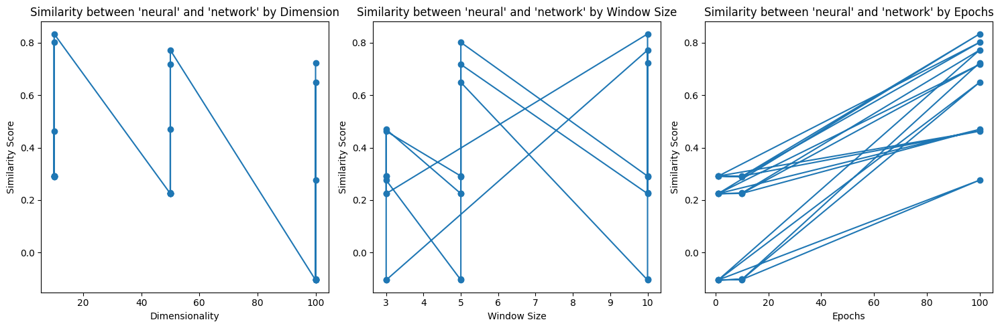


Similarity results for 'artificial' and 'intelligence':
By Dimension: [(10, 0.33815676), (10, 0.34109277), (10, 0.74240124), (10, 0.3379422), (10, 0.34312686), (10, 0.81985223), (10, 0.33811334), (10, 0.34279332), (10, 0.81858706), (50, 0.0071481937), (50, 0.007981236), (50, 0.2784629), (50, 0.007119069), (50, 0.009845263), (50, 0.41265798), (50, 0.0072174426), (50, 0.008830012), (50, 0.4616895), (100, -0.008151174), (100, -0.0070857364), (100, 0.33888286), (100, -0.008174255), (100, -0.004426928), (100, 0.5059673), (100, -0.008163044), (100, -0.005822121), (100, 0.5603908)]
By Window Size: [(3, 0.33815676), (3, 0.34109277), (3, 0.74240124), (5, 0.3379422), (5, 0.34312686), (5, 0.81985223), (10, 0.33811334), (10, 0.34279332), (10, 0.81858706), (3, 0.0071481937), (3, 0.007981236), (3, 0.2784629), (5, 0.007119069), (5, 0.009845263), (5, 0.41265798), (10, 0.0072174426), (10, 0.008830012), (10, 0.4616895), (3, -0.008151174), (3, -0.0070857364), (3, 0.33888286), (5, -0.008174255), (5, -0.0

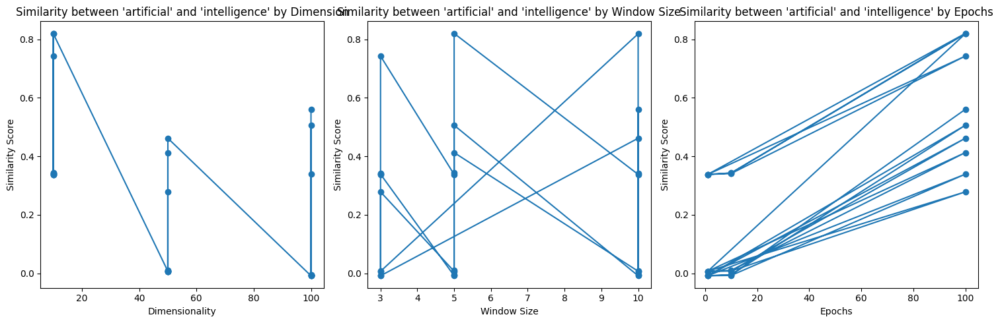

In [14]:
import os
import matplotlib.pyplot as plt
from gensim.models import Word2Vec

# Function to compute word similarity for different models
def compute_similarity(word1, word2, models_dir, dims, windows, epochs):
    similarities = {'dims': [], 'windows': [], 'epochs': []}

    for dim in dims:
        for window in windows:
            for epoch in epochs:
                model_filename = f"word2vec_model_dim{dim}_window{window}_epochs{epoch}.model"
                model_path = os.path.join(models_dir, model_filename)

                # Load the model
                model = Word2Vec.load(model_path)

                # Compute similarity and handle KeyError if words are not in vocabulary
                try:
                    similarity = model.wv.similarity(word1, word2)
                except KeyError as e:
                    similarity = None
                    print(f"KeyError for {word1}-{word2} in model {model_filename}: {e}")

                # Append similarity to the respective hyperparameter category
                similarities['dims'].append((dim, similarity))
                similarities['windows'].append((window, similarity))
                similarities['epochs'].append((epoch, similarity))

    return similarities

# Define the word pairs
word_pairs = [("machine", "learning"), ("neural", "network"), ("artificial", "intelligence")]

# Directory where models are saved
models_dir = '/content/word2vec_models1'

# Hyperparameters used in training
dims = [10, 50, 100]
windows = [3, 5, 10]
epochs = [1, 10, 100]

# Plot the similarities for each pair of words
for word1, word2 in word_pairs:
    similarities = compute_similarity(word1, word2, models_dir, dims, windows, epochs)

    # Print similarities
    print(f"\nSimilarity results for '{word1}' and '{word2}':")
    print(f"By Dimension: {similarities['dims']}")
    print(f"By Window Size: {similarities['windows']}")
    print(f"By Epochs: {similarities['epochs']}")

    # Plot similarities by dimension
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.plot([dim for dim, _ in similarities['dims']], [sim if sim is not None else 0 for _, sim in similarities['dims']], marker='o')
    plt.title(f"Similarity between '{word1}' and '{word2}' by Dimension")
    plt.xlabel('Dimensionality')
    plt.ylabel('Similarity Score')

    # Plot similarities by window size
    plt.subplot(1, 3, 2)
    plt.plot([window for window, _ in similarities['windows']], [sim if sim is not None else 0 for _, sim in similarities['windows']], marker='o')
    plt.title(f"Similarity between '{word1}' and '{word2}' by Window Size")
    plt.xlabel('Window Size')
    plt.ylabel('Similarity Score')

    # Plot similarities by number of epochs
    plt.subplot(1, 3, 3)
    plt.plot([epoch for epoch, _ in similarities['epochs']], [sim if sim is not None else 0 for _, sim in similarities['epochs']], marker='o')
    plt.title(f"Similarity between '{word1}' and '{word2}' by Epochs")
    plt.xlabel('Epochs')
    plt.ylabel('Similarity Score')

    plt.tight_layout()
    plt.show()


In [42]:
def get_valid_word_vectors(model, words):
    valid_words = [word for word in words if word in model.wv]
    if not valid_words:
        print("No valid words found in the model's vocabulary.")
        return np.array([]), []

    word_vectors = [model.wv[word] for word in valid_words]
    return np.array(word_vectors), valid_words

# Example usage
word_vectors_array, labels = get_valid_word_vectors(model, words_to_plot)

if word_vectors_array.size > 0:
    plot_model_embeddings_2d(model, labels, method='pca')
else:
    print("No word vectors to plot.")


No valid words found in the model's vocabulary.
No word vectors to plot.


In [45]:
import os
from gensim.models import Word2Vec
import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Function for preprocessing text
def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    words = word_tokenize(text)  # Tokenize words
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]  # Remove stopwords and lemmatize
    return words

# New corpus
new_corpus = [
    "History of React includes tracing back to 2010 when Jordan Walke, a software engineer at Facebook, created an internal prototype called FaxJS.",
    "In 2011, Facebook started using React internally and later released it as an open-source project in 2013 at JSConf US.",
    "React gained popularity quickly, with many developers using it for building user interfaces. One key feature that set React apart was its ability to render changes in real-time.",
    "In 2015, Facebook released React Native, a framework for building native mobile applications using React.",
    "Today, React is widely used by companies and developers around the world, including Facebook, Instagram, Airbnb, and Netflix."
]

# Apply preprocessing to the new corpus
processed_corpus = [preprocess(doc) for doc in new_corpus]
flat_words = [word for doc in processed_corpus for word in doc]

# Directory where your models are saved
models_dir = '/content/word2vec_models1'

# Load your trained Word2Vec model (choose one based on your saved models)
# For example, loading a model with dim=100, window=5, epochs=10
model_filename = "word2vec_model_dim100_window5_epochs10.model"
model_path = os.path.join(models_dir, model_filename)
model = Word2Vec.load(model_path)

# Print similarities for words in the new corpus
def print_word_similarities(model, words):
    for word in words:
        if word in model.wv:
            similar_words = model.wv.most_similar(word)
            print(f"Word: {word}")
            print("Similar Words:", similar_words)
        else:
            print(f"Word: {word} not found in the vocabulary")

# Print similarities for words in the new corpus
print_word_similarities(model, flat_words)


Word: history not found in the vocabulary
Word: react not found in the vocabulary
Word: includes not found in the vocabulary
Word: tracing not found in the vocabulary
Word: back not found in the vocabulary
Word: 2010 not found in the vocabulary
Word: jordan not found in the vocabulary
Word: walke not found in the vocabulary
Word: software not found in the vocabulary
Word: engineer not found in the vocabulary
Word: facebook not found in the vocabulary
Word: created not found in the vocabulary
Word: internal not found in the vocabulary
Word: prototype not found in the vocabulary
Word: called not found in the vocabulary
Word: faxjs not found in the vocabulary
Word: 2011 not found in the vocabulary
Word: facebook not found in the vocabulary
Word: started not found in the vocabulary
Word: using
Similar Words: [('typically', 0.1930893063545227), ('many', 0.18416576087474823), ('cnn', 0.17923332750797272), ('connected', 0.16953380405902863), ('amount', 0.16443948447704315), ('support', 0.1578

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


New model saved: /content/word2vec_models1/word2vec_combined_corpus.model
Word: framework
Vector: [-0.10108463  0.09898899  0.06929307  0.0754149  -0.00622022 -0.11434358
  0.09131636  0.24267748 -0.1317405  -0.17647417  0.04700641 -0.12416922
 -0.04241331  0.02996615  0.05046039 -0.02815765  0.14357767  0.030452
 -0.09427183 -0.23134173  0.05463872  0.01507244  0.17557712  0.01267225
 -0.04464862  0.06971021 -0.08314659  0.09946921 -0.04634117  0.05610442
  0.09644195 -0.09057195  0.03220177 -0.14788446 -0.02946963  0.0673688
  0.12620096  0.01816528 -0.06180068  0.02512955  0.11913538 -0.04402654
 -0.11703277  0.08943928  0.04706946 -0.05476147 -0.06677894 -0.03120924
  0.05926077  0.04212437  0.04642221 -0.0911195  -0.0175756  -0.05397278
 -0.06501141  0.00235617  0.06681971 -0.02669721  0.05066976  0.04885661
 -0.03922607 -0.02781184  0.18987598 -0.0043588  -0.05727891  0.14329141
  0.04608134  0.15498507 -0.12147298  0.00171538  0.04115999  0.12244014
  0.08011032  0.06335823  0.0

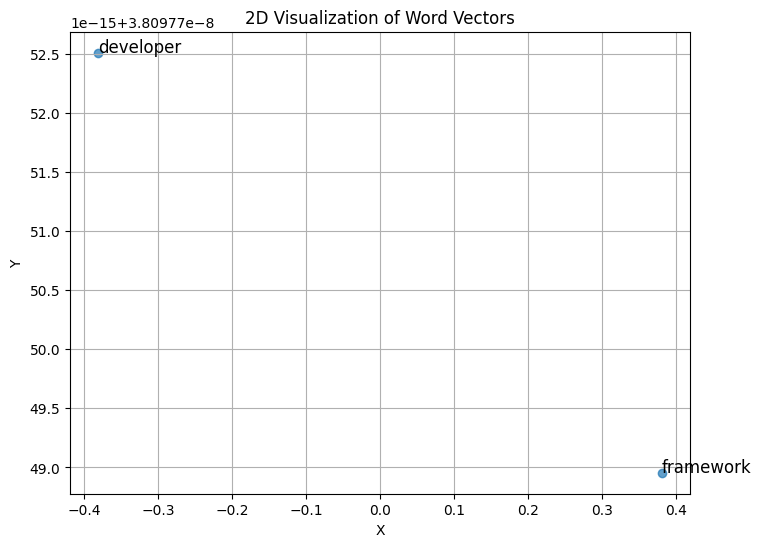

In [49]:
import os
from gensim.models import Word2Vec
import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Function for preprocessing text
def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    words = word_tokenize(text)  # Tokenize words
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]  # Remove stopwords and lemmatize
    return words

# im Loading my saved  existing models
models_dir = '/content/word2vec_models1'
model_files = [f for f in os.listdir(models_dir) if f.endswith('.model')]

models = [Word2Vec.load(os.path.join(models_dir, file)) for file in model_files]

# Define new React corpus
react_corpus = [
    "React is a popular framework for building user interfaces.",
    "React was developed by Facebook and is widely used in web development.",
    "React allows developers to build single-page applications with a component-based architecture.",
    "Companies use React for its efficient update and rendering of user interfaces.",
    "React is maintained by Facebook and a community of individual developers and companies.",
]

# Preprocess new corpus
processed_react_corpus = [preprocess(sentence) for sentence in react_corpus]

# Combine with existing corpus
combined_corpus = [sent for model in models for sent in model.wv.index_to_key] + processed_react_corpus

# Train a new Word2Vec model with the combined corpus
dim = 100
window = 5
epochs = 10

# Train the new model
new_model = Word2Vec(sentences=combined_corpus, vector_size=dim, window=window, min_count=1, workers=4, epochs=epochs)

# Save the new model
new_model_filename = "word2vec_combined_corpus.model"
new_model_path = os.path.join(models_dir, new_model_filename)
new_model.save(new_model_path)
print(f"New model saved: {new_model_path}")

# Function to print vector values and similarity
def print_vector_and_similarity(model, words):
    for word in words:
        if word in model.wv:
            print(f"Word: {word}")
            print(f"Vector: {model.wv[word]}")
            print()
        else:
            print(f"Word: {word} is NOT in the vocabulary.")
            print()

# Words to check
words_to_check = ['framework', 'developer', 'internally', 'companies']

print_vector_and_similarity(new_model, words_to_check)

# Find similarity between pairs
def find_similarity(model, pairs):
    for w1, w2 in pairs:
        if w1 in model.wv and w2 in model.wv:
            similarity = model.wv.similarity(w1, w2)
            print(f"Similarity between '{w1}' and '{w2}': {similarity}")
        else:
            print(f"One or both words in the pair '{w1}', '{w2}' are not in the vocabulary.")

# Pairs to check
word_pairs = [('framework', 'developer'), ('internally', 'companies')]

find_similarity(new_model, word_pairs)

# Plotting function for 2D visualization
def plot_word_vectors_2d(model, words):
    word_vectors = np.array([model.wv[word] for word in words if word in model.wv])
    if word_vectors.size == 0:
        print("No vectors to plot.")
        return

    # Reduce the dimensions
    reducer = PCA(n_components=2)
    embeddings_2d = reducer.fit_transform(word_vectors)

    plt.figure(figsize=(8, 6))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], marker='o', alpha=0.7)

    # Annotate words
    for i, word in enumerate(words):
        if word in model.wv:
            plt.text(embeddings_2d[i, 0], embeddings_2d[i, 1], word, fontsize=12)

    plt.title('2D Visualization of Word Vectors')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

# Words to visualize
words_to_visualize = ['framework', 'developer', 'internally', 'companies']
plot_word_vectors_2d(new_model, words_to_visualize)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Training model with dim=10, window=3, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs1.model
Training model with dim=10, window=3, epochs=10
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs10.model
Training model with dim=10, window=3, epochs=100
Model saved: /content/word2vec_models1/word2vec_model_dim10_window3_epochs100.model
Training model with dim=10, window=5, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs1.model
Training model with dim=10, window=5, epochs=10
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs10.model
Training model with dim=10, window=5, epochs=100
Model saved: /content/word2vec_models1/word2vec_model_dim10_window5_epochs100.model
Training model with dim=10, window=10, epochs=1
Model saved: /content/word2vec_models1/word2vec_model_dim10_window10_epochs1.model
Training model with dim=10, window=10, epochs=10
Model saved: /content/word2vec_mod

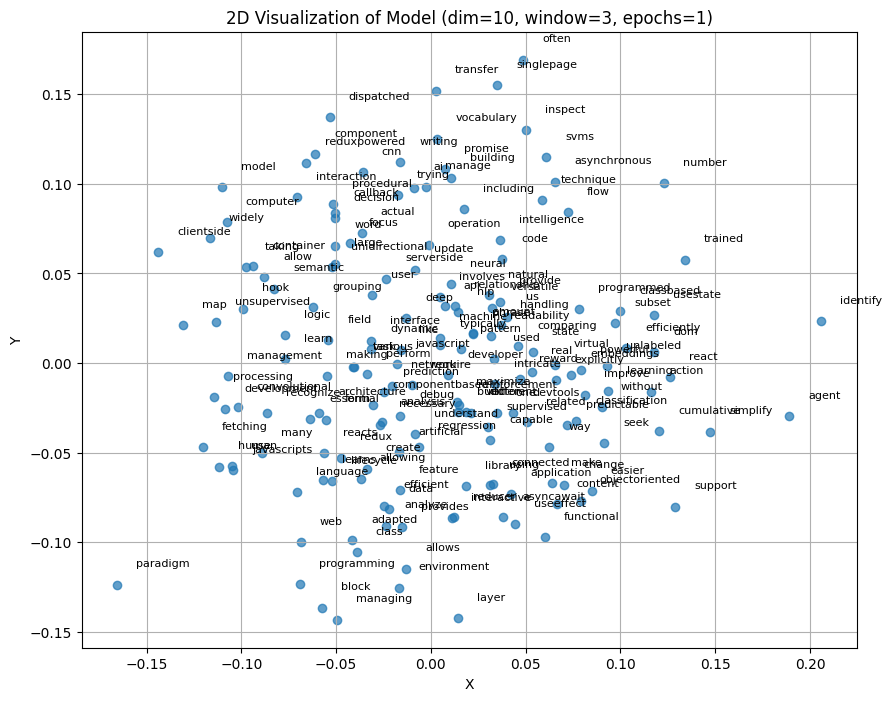

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.00828338  0.02795438  0.05474539  0.07095454 -0.05712561  0.0188494
  0.0617611  -0.04758941 -0.03188542  0.06733948]

Word: redux
Vector: [ 0.02375945 -0.04540325  0.08442769 -0.09834421  0.06767824  0.02941226
 -0.0488448   0.04427553 -0.01786597  0.06688369]

Word: javascript
Vector: [-0.0933995   0.03793473  0.04946962 -0.0642207   0.01215825 -0.02059712
  0.00069321 -0.09887763  0.02633824 -0.0481382 ]

Word 'framework' not found in the vocabulary.
Word: developer
Vector: [ 0.07976101 -0.00811269  0.06697027  0.03821197  0.05066957  0.07271162
 -0.04648691 -0.02154963  0.00813845  0.04161783]

Word: component
Vector: [ 0.01235603 -0.08486788 -0.08114783 -0.00206714  0.01247627 -0.05750381
 -0.04620121 -0.07309473  0.08236698  0.00027868]

Word: state
Vector: [ 0.07404099 -0.01577348 -0.04326435  0.06589641 -0.04879717 -0.01782298
  0.03075846  0.01034961 -0.08506627 -0.09606833]

Word 'props' not 

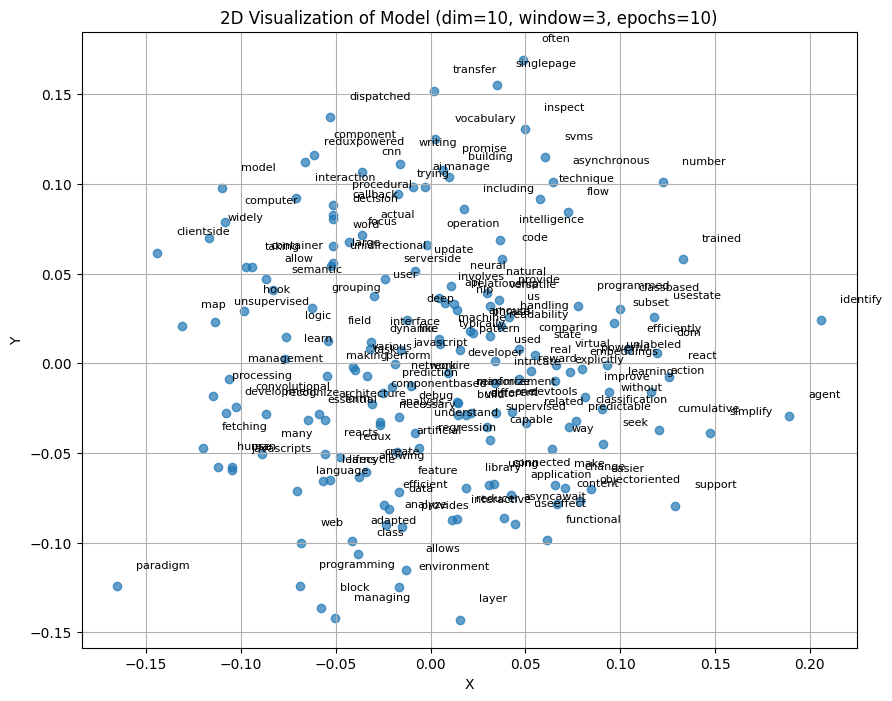

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [ 0.07884988 -0.11005338  0.42075983  0.2718632   0.03936496  0.10569372
  0.41232535  0.14964955 -0.384602   -0.21299158]

Word: redux
Vector: [ 0.08348771 -0.14091767  0.32422903  0.03981635  0.12208968  0.09542299
  0.17681     0.17374569 -0.24731965 -0.11040926]

Word: javascript
Vector: [-0.03947141 -0.04297009  0.26307005  0.04421483  0.06881124  0.02680489
  0.20157465  0.01757932 -0.17451209 -0.20844412]

Word 'framework' not found in the vocabulary.
Word: developer
Vector: [ 0.15253569 -0.12267432  0.37741566  0.199827    0.11915714  0.14528275
  0.23949297  0.14275391 -0.2768803  -0.17533909]

Word: component
Vector: [ 0.08986191 -0.21527362  0.27356198  0.18265222  0.09760845  0.00774568
  0.27830297  0.10389638 -0.2446733  -0.2525386 ]

Word: state
Vector: [ 0.20574157 -0.22995955  0.4857841   0.35968325  0.07920175  0.11415943
  0.5421136   0.28297055 -0.616677   -0.5110386 ]

Word 'props' not

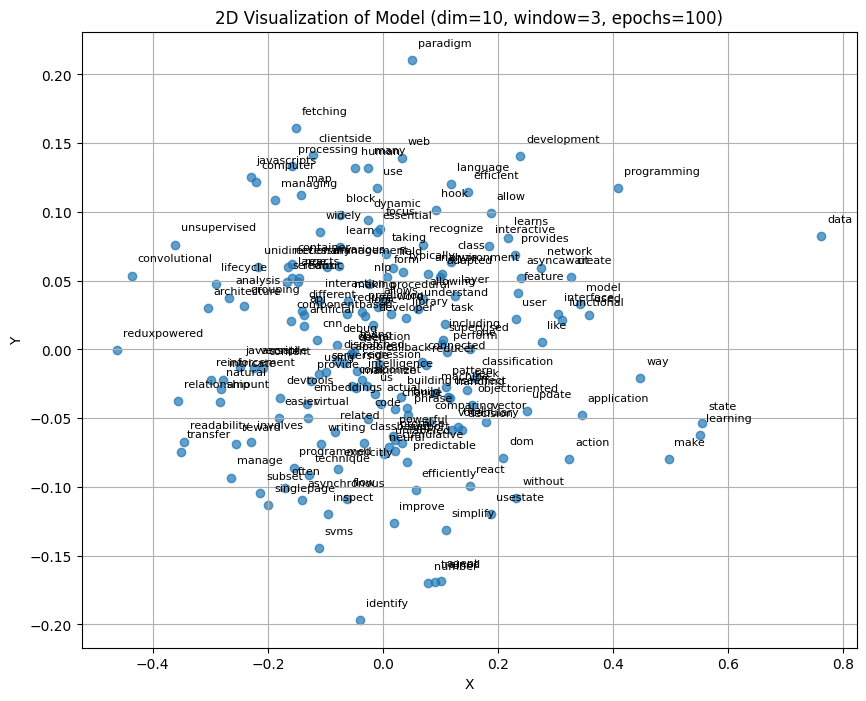

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.00850364  0.02821995  0.05407735  0.07046407 -0.05702531  0.01856245
  0.06096558 -0.04800189 -0.03114909  0.06797595]

Word: redux
Vector: [ 0.02348376 -0.04519032  0.08388732 -0.09858163  0.06764641  0.02914417
 -0.04932832  0.04398187 -0.01739575  0.06711384]

Word: javascript
Vector: [-0.0937006   0.0382674   0.04884479 -0.06428564  0.01208558 -0.02074877
  0.00024403 -0.09883509  0.02692004 -0.04750106]

Word 'framework' not found in the vocabulary.
Word: developer
Vector: [ 0.07950789 -0.00783573  0.06612091  0.03767524  0.05076842  0.07252991
 -0.0473939  -0.02185533  0.00873123  0.04236206]

Word: component
Vector: [ 0.01218818 -0.08458325 -0.08223945 -0.00231016  0.01237288 -0.05743381
 -0.04725274 -0.07346074  0.08328615  0.00121298]

Word: state
Vector: [ 0.07381605 -0.01537168 -0.04536078  0.06552681 -0.04858191 -0.01816417
  0.02882178  0.00989989 -0.08289484 -0.0944696 ]

Word 'props' not

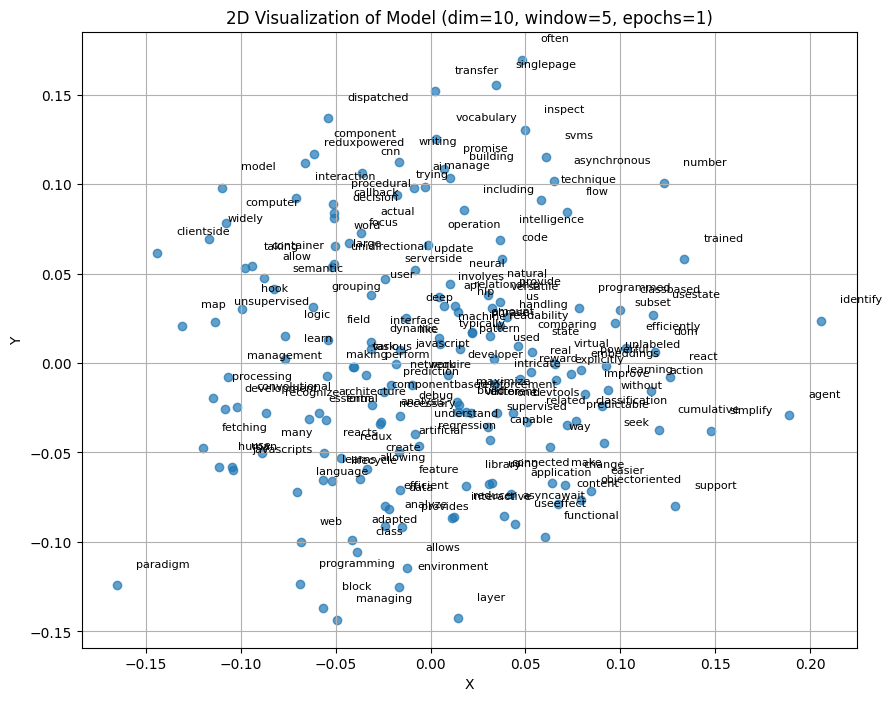

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.0072133   0.02650876  0.0563155   0.07089984 -0.05608243  0.01865522
  0.06410822 -0.04671939 -0.03449288  0.06643437]

Word: redux
Vector: [ 0.02371184 -0.04570736  0.08409344 -0.09833755  0.067909    0.02942112
 -0.04836905  0.04433563 -0.01835084  0.06684613]

Word: javascript
Vector: [-0.09255151  0.03754308  0.0508794  -0.06398807  0.01269092 -0.0207074
  0.00254553 -0.09778664  0.0250281  -0.04858514]

Word 'framework' not found in the vocabulary.
Word: developer
Vector: [ 0.080458   -0.00872075  0.06767402  0.03800378  0.05123898  0.07264711
 -0.04528741 -0.021153    0.00710168  0.04142772]

Word: component
Vector: [ 0.01283004 -0.08604273 -0.08039123 -0.00203457  0.01271884 -0.05729548
 -0.04470233 -0.07251168  0.08068774 -0.00016079]

Word: state
Vector: [ 0.07471936 -0.0166644  -0.04322269  0.06603675 -0.04779361 -0.01752175
  0.0321316   0.01118575 -0.08560383 -0.0956357 ]

Word 'props' not 

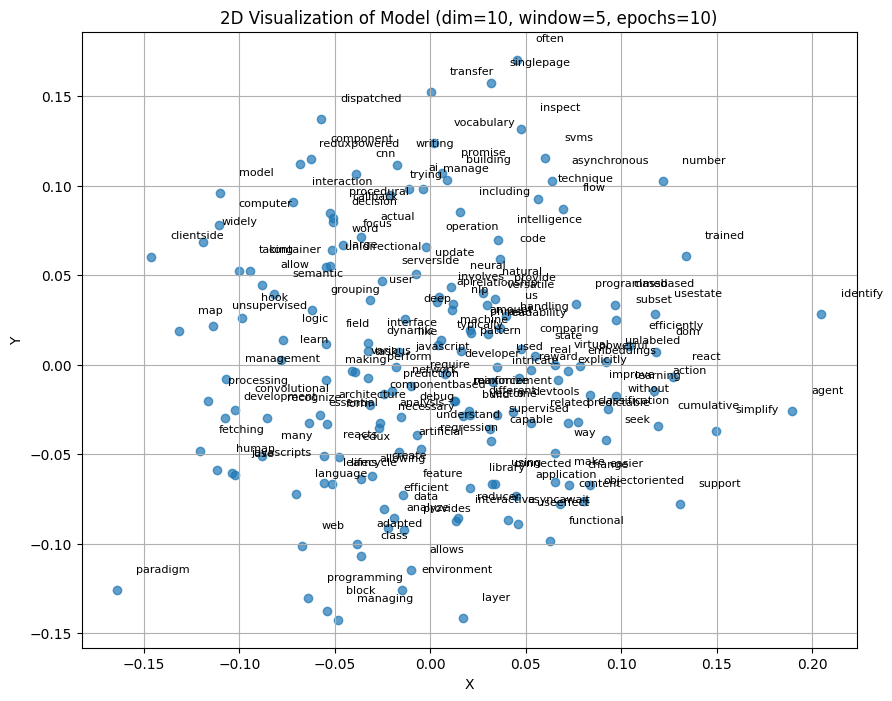

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [ 0.22369467 -0.27335703  0.67578036  0.26878223  0.14087656  0.12015768
  0.8587831   0.33844435 -0.7189435  -0.38897148]

Word: redux
Vector: [ 0.18519497 -0.24590775  0.49993375  0.0513606   0.1891067   0.10937612
  0.4810849   0.29569784 -0.47984093 -0.23429607]

Word: javascript
Vector: [ 0.0927547  -0.1874062   0.52972364  0.08538868  0.16829354  0.04543373
  0.6105435   0.21831836 -0.4897995  -0.40350816]

Word 'framework' not found in the vocabulary.
Word: developer
Vector: [ 0.27030325 -0.24614485  0.5741208   0.19679548  0.19767427  0.14996819
  0.5959802   0.3040936  -0.5311246  -0.3123252 ]

Word: component
Vector: [ 0.25672793 -0.4042944   0.5842088   0.21416314  0.20206505  0.02818231
  0.79194295  0.3287321  -0.6531922  -0.4768793 ]

Word: state
Vector: [ 0.43640435 -0.4722306   0.8932344   0.38907677  0.24136813  0.15544577
  1.241098    0.5795031  -1.1434015  -0.79359967]

Word 'props' not

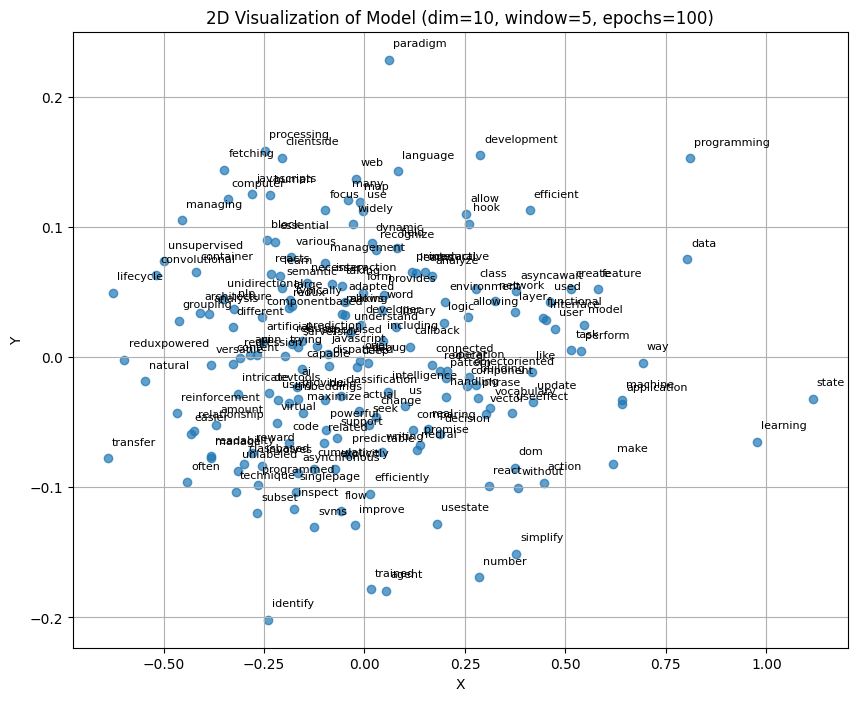

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.0084919   0.0281769   0.05404272  0.07044696 -0.0570327   0.01857504
  0.06093044 -0.0479909  -0.03111854  0.06792837]

Word: redux
Vector: [ 0.02348376 -0.04519032  0.08388732 -0.09858163  0.06764641  0.02914417
 -0.04932832  0.04398187 -0.01739575  0.06711384]

Word: javascript
Vector: [-0.0937006   0.0382674   0.04884479 -0.06428564  0.01208558 -0.02074877
  0.00024403 -0.09883509  0.02692004 -0.04750106]

Word 'framework' not found in the vocabulary.
Word: developer
Vector: [ 0.07950789 -0.00783573  0.06612091  0.03767524  0.05076842  0.07252991
 -0.0473939  -0.02185533  0.00873123  0.04236206]

Word: component
Vector: [ 0.01218818 -0.08458325 -0.08223945 -0.00231016  0.01237288 -0.05743381
 -0.04725274 -0.07346074  0.08328615  0.00121298]

Word: state
Vector: [ 0.07384064 -0.01539134 -0.04537112  0.06554899 -0.04857985 -0.01818292
  0.02875289  0.00992045 -0.08287863 -0.09452613]

Word 'props' not

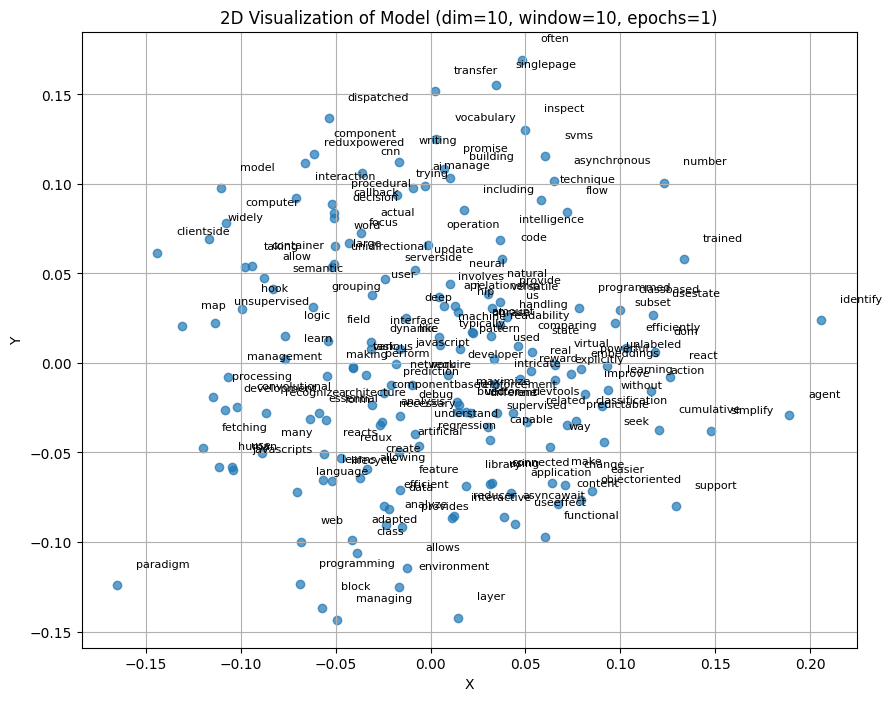

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.00769782  0.02711463  0.05585678  0.07139614 -0.0567162   0.0193515
  0.06343657 -0.04680095 -0.0336658   0.06603736]

Word: redux
Vector: [ 0.02448525 -0.04617088  0.08590839 -0.09751046  0.06807657  0.02959383
 -0.04713069  0.04484975 -0.01997541  0.06530409]

Word: javascript
Vector: [-0.09310062  0.03762028  0.05022931 -0.06361346  0.0125084  -0.02060984
  0.00163321 -0.0976629   0.02552539 -0.04900409]

Word 'framework' not found in the vocabulary.
Word: developer
Vector: [ 0.08017195 -0.00861714  0.06783379  0.03826559  0.05088438  0.07274264
 -0.04554491 -0.02106006  0.00675356  0.04107475]

Word: component
Vector: [ 0.01297554 -0.08528253 -0.08088003 -0.00169235  0.01237373 -0.05721474
 -0.04569592 -0.07286604  0.08145272  0.00026131]

Word: state
Vector: [ 0.07678261 -0.01851903 -0.04052171  0.0676165  -0.04823244 -0.01707158
  0.03418845  0.01257924 -0.08892677 -0.09890258]

Word 'props' not 

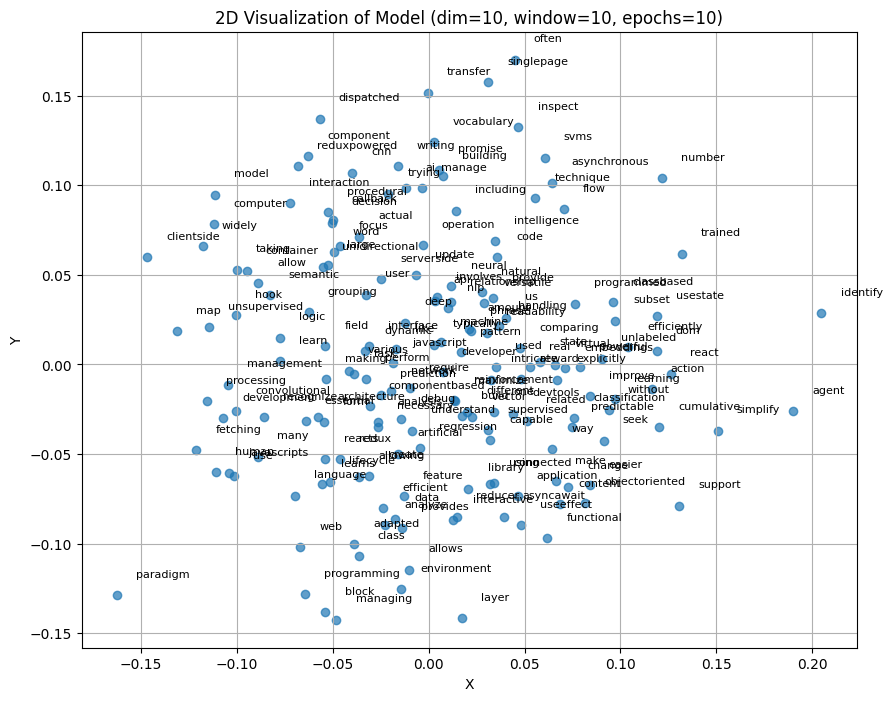

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [ 0.3851516  -0.315282    1.0809546   0.4504993   0.29784927  0.06669452
  1.3732125   0.6600198  -1.1924326  -0.89111245]

Word: redux
Vector: [ 0.25963503 -0.25728264  0.6690543   0.1406536   0.2779877   0.07604335
  0.71317816  0.44901985 -0.70036757 -0.4993346 ]

Word: javascript
Vector: [ 0.17224889 -0.17978168  0.7411365   0.1784588   0.2753728   0.0038281
  0.879054    0.39385402 -0.72673476 -0.70513695]

Word 'framework' not found in the vocabulary.
Word: developer
Vector: [ 0.317977   -0.20550379  0.68447423  0.26067835  0.25216085  0.10903483
  0.72972876  0.4078854  -0.6619104  -0.5136116 ]

Word: component
Vector: [ 0.30494127 -0.35375017  0.7027251   0.28677166  0.2766817  -0.03722045
  0.95016634  0.45537272 -0.8125637  -0.72955877]

Word: state
Vector: [ 0.55018675 -0.44268686  1.123329    0.53579444  0.3698953   0.07143525
  1.5581933   0.81867903 -1.454606   -1.2281224 ]

Word 'props' not 

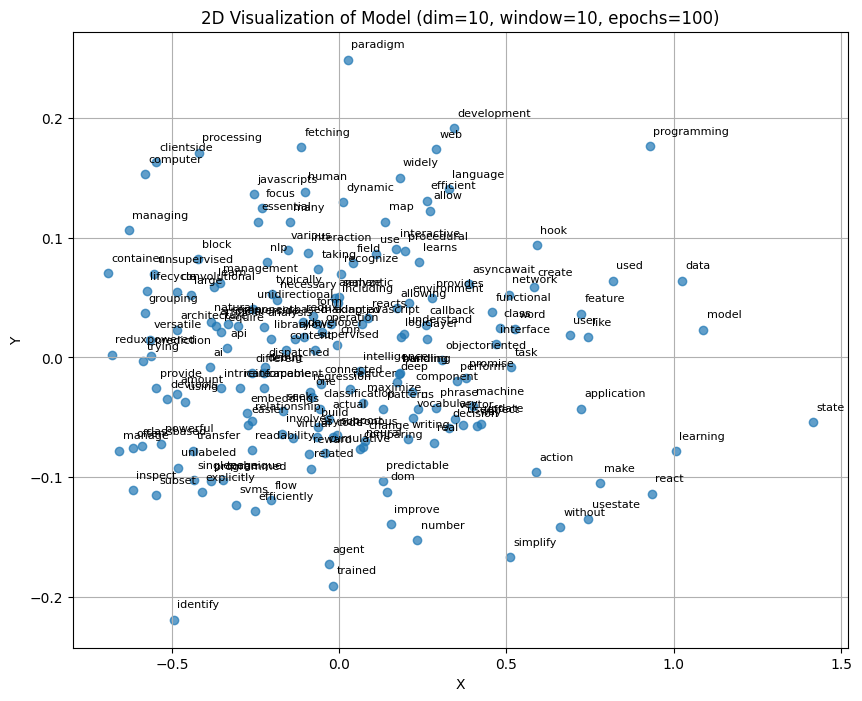

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.01426887  0.00246369 -0.01435262 -0.00448676  0.00743086  0.0116624
  0.00240323  0.00420064 -0.00822238  0.01444686 -0.01260317  0.00928276
 -0.01642848  0.00407753 -0.00995193 -0.00850215 -0.00620507  0.01131132
  0.01158073 -0.00994809  0.00154836 -0.01699218  0.01562414  0.01850697
 -0.00548229  0.00160534  0.00147111  0.01095753 -0.01720987  0.00115876
  0.01373878  0.004459    0.00225448 -0.0186639   0.01696007 -0.01253704
 -0.00599173  0.00698366 -0.0015522   0.00283858  0.00355399 -0.01365865
 -0.01945298  0.01807565  0.01240379 -0.0138306   0.00680343  0.00042491
  0.00950129 -0.0142283 ]

Word: redux
Vector: [ 1.62645429e-02 -8.91466811e-03 -2.13671452e-03  2.01272964e-03
 -3.82227910e-04  2.29635485e-03  1.22277215e-02 -4.05430801e-05
 -6.49193069e-03 -3.02145723e-03  1.17945978e-02  3.02820443e-03
 -1.44852395e-03  1.86664946e-02 -9.84256715e-03 -1.67681929e-03
  1.83508229e-02  1.34988548e

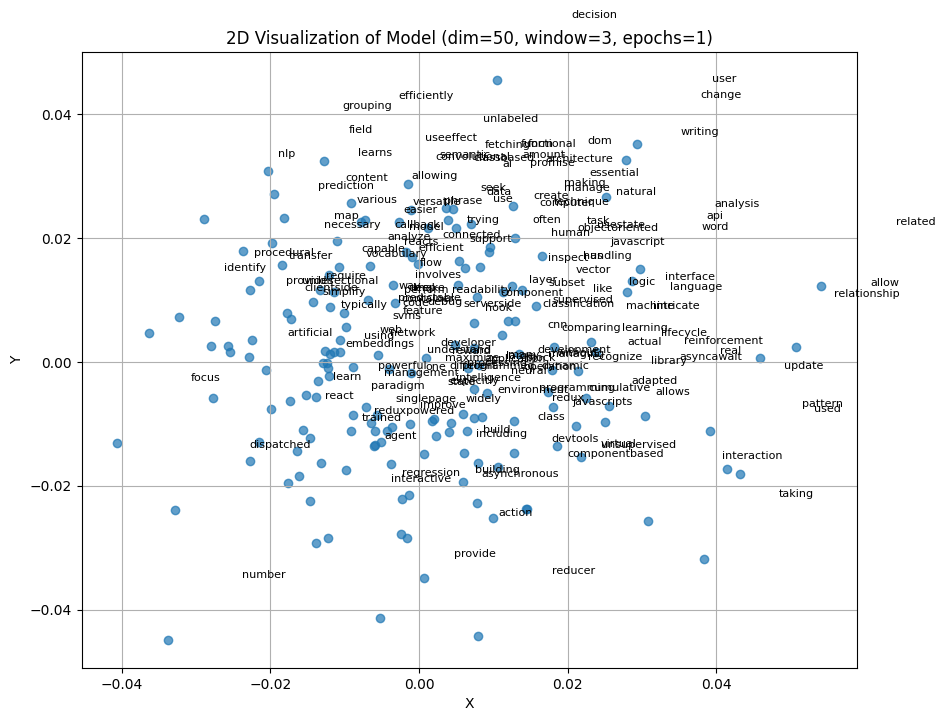

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.0142892   0.00251549 -0.01433275 -0.00451454  0.00750142  0.01152162
  0.00260381  0.00434034 -0.00826976  0.01443634 -0.01267251  0.00917919
 -0.01634826  0.00405663 -0.00993974 -0.0084502  -0.00616699  0.01134378
  0.01134485 -0.0099743   0.0015329  -0.01686875  0.01572487  0.01846742
 -0.00542776  0.00162861  0.00142934  0.0109769  -0.01728458  0.00111698
  0.01371892  0.00440935  0.00210305 -0.01870216  0.01690188 -0.01240523
 -0.00581253  0.00694116 -0.00145511  0.00286437  0.0037059  -0.01363716
 -0.01941787  0.01805961  0.01265457 -0.01379673  0.00668675  0.00037875
  0.00959783 -0.01423867]

Word: redux
Vector: [ 1.62715260e-02 -8.87180027e-03 -2.11176998e-03  1.96089339e-03
 -3.47591122e-04  2.19137128e-03  1.23459836e-02  2.58040636e-05
 -6.52505318e-03 -3.07592121e-03  1.17395045e-02  2.92579411e-03
 -1.40584109e-03  1.86574310e-02 -9.82939918e-03 -1.65325985e-03
  1.83451157e-02  1.35226417

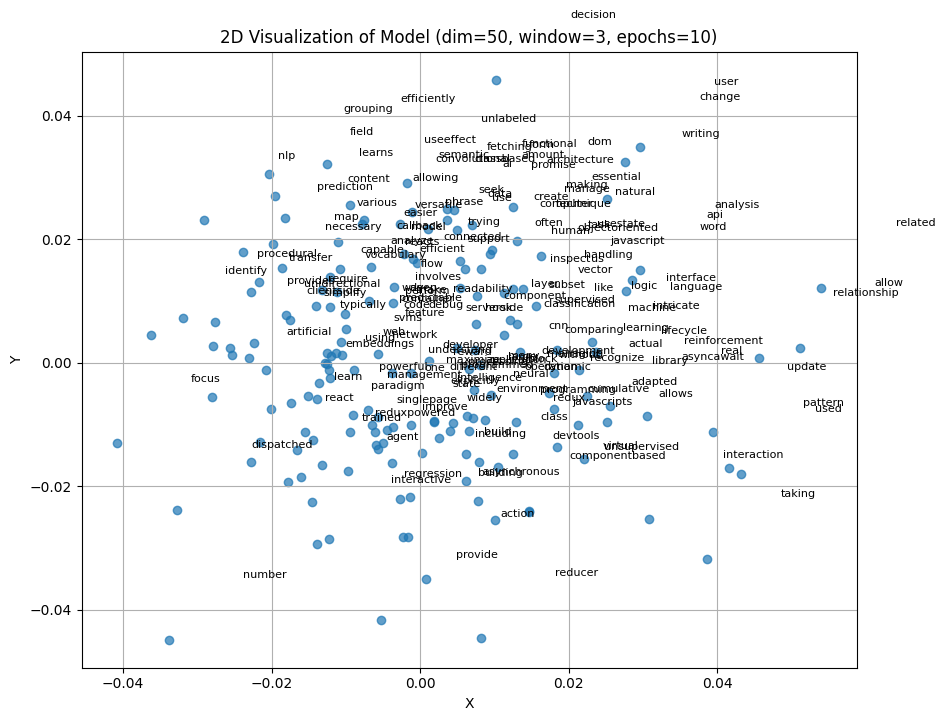

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.00984326  0.02102254 -0.00787436 -0.03169503  0.06358122 -0.07289352
  0.08388183  0.07904568 -0.05699905 -0.00178739 -0.02366537 -0.07360996
  0.01842824  0.01654133 -0.00639743  0.02621513  0.00638658  0.03792372
 -0.08802571 -0.03540357  0.00867619  0.03437987  0.06886043 -0.00886544
  0.0285808  -0.00694333 -0.03525676  0.0197904  -0.05745038 -0.02171687
  0.01233061 -0.01303626 -0.0500714  -0.0498652  -0.02141446  0.02914519
  0.07730177  0.01672338  0.05278874 -0.02951321  0.09631243 -0.01790461
 -0.00769628  0.03917028  0.13647795 -0.01113617 -0.0573268  -0.05277249
  0.066874   -0.02386171]

Word: redux
Vector: [ 0.01846379  0.00165017  0.00284207 -0.01419301  0.03606079 -0.05119135
  0.06553498  0.04805991 -0.03679376 -0.01259009  0.00317036 -0.04982026
  0.01933871  0.02663821 -0.00813263  0.01960148  0.02577572  0.03243077
 -0.06212503 -0.0343539   0.00869731  0.03005744  0.05409506 -0.01576

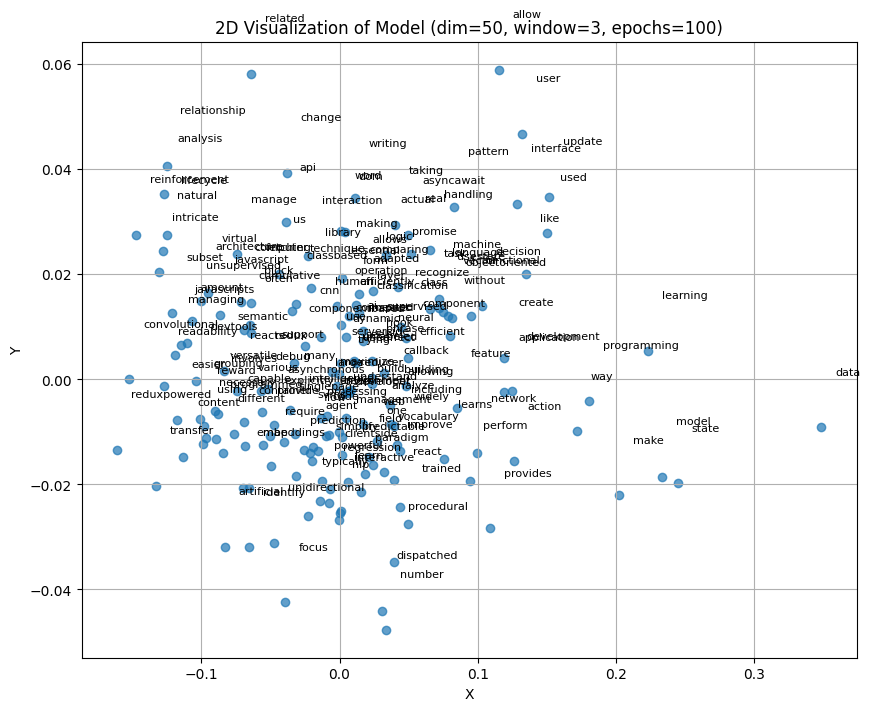

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.01427939  0.00247252 -0.01435321 -0.00449214  0.0074359   0.01166421
  0.00239088  0.00420819 -0.00822263  0.01445647 -0.01261437  0.00928595
 -0.01642978  0.00408022 -0.00994681 -0.00849927 -0.00621478  0.01131231
  0.01159258 -0.00995598  0.00155209 -0.01698544  0.01563421  0.01851053
 -0.00547763  0.00160239  0.0014837   0.01095369 -0.01720896  0.00116007
  0.01373207  0.00445462  0.00224494 -0.01864851  0.01695914 -0.0125298
 -0.00598586  0.00697675 -0.00154238  0.0028416   0.00354789 -0.01365232
 -0.01944831  0.0180826   0.01240852 -0.01382056  0.00680642  0.00042612
  0.0095046  -0.01424043]

Word: redux
Vector: [ 1.62645429e-02 -8.91466811e-03 -2.13671452e-03  2.01272964e-03
 -3.82227910e-04  2.29635485e-03  1.22277215e-02 -4.05430801e-05
 -6.49193069e-03 -3.02145723e-03  1.17945978e-02  3.02820443e-03
 -1.44852395e-03  1.86664946e-02 -9.84256715e-03 -1.67681929e-03
  1.83508229e-02  1.34988548e

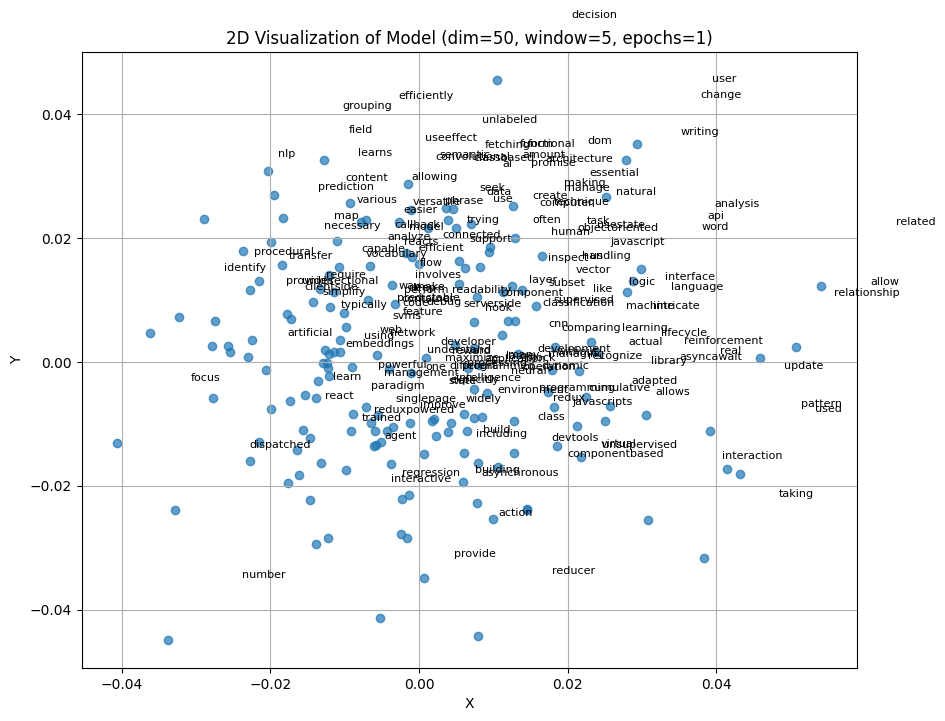

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.01428228  0.00238972 -0.01419819 -0.00467602  0.00772592  0.01132102
  0.00270153  0.0047701  -0.00868485  0.01451653 -0.01266034  0.00900798
 -0.01602847  0.00409553 -0.0097641  -0.00847646 -0.00604125  0.01152765
  0.01101873 -0.0103233   0.00166752 -0.01659633  0.01614715  0.01850947
 -0.00536714  0.00147535  0.0010139   0.01113218 -0.01755899  0.00097683
  0.01373944  0.0043143   0.00179786 -0.01879414  0.01684153 -0.01236523
 -0.00557822  0.00695152 -0.00127812  0.00261205  0.00393966 -0.01364834
 -0.0195473   0.01830046  0.01310416 -0.01381061  0.00641598  0.00016691
  0.00971785 -0.01422332]

Word: redux
Vector: [ 1.6276451e-02 -8.9347828e-03 -2.0965366e-03  2.0223390e-03
 -2.7178164e-04  2.2505263e-03  1.2322427e-02  4.9567985e-05
 -6.6623567e-03 -3.0360820e-03  1.1786901e-02  2.9054505e-03
 -1.3051548e-03  1.8706411e-02 -9.8143118e-03 -1.6469311e-03
  1.8400682e-02  1.3600225e-02  2.8090032e-0

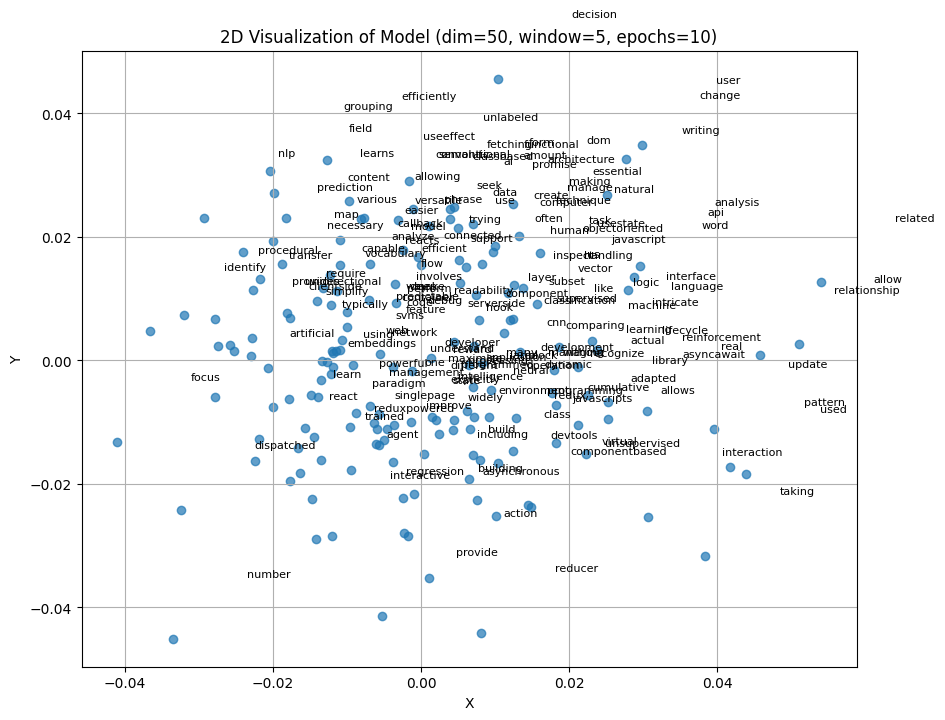

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.02896484  0.01944852  0.03773069 -0.06035063  0.13779362 -0.16450904
  0.16509861  0.24125703 -0.14596048 -0.03638823 -0.01062968 -0.19154812
  0.10899028  0.07513674  0.04094917  0.08029696  0.03724989  0.11891808
 -0.23611814 -0.13998835  0.05958956  0.1290684   0.15996608 -0.02761087
  0.08230032 -0.03563419 -0.14649451  0.06272111 -0.15004699 -0.0756386
  0.02697201 -0.03021866 -0.1256994  -0.08099286 -0.06496987  0.0772168
  0.2276759   0.04955783  0.10976533 -0.09730377  0.20399944 -0.03443669
 -0.04076956  0.07428482  0.30611756  0.00082562 -0.13346587 -0.1378493
  0.14143941 -0.02806413]

Word: redux
Vector: [ 0.00643193 -0.00256992  0.03185975 -0.03275068  0.08277205 -0.10829577
  0.118391    0.15271439 -0.09278981 -0.03513497  0.01043133 -0.12662362
  0.07770539  0.06513662  0.02177484  0.05638368  0.04409816  0.08525578
 -0.15757263 -0.10017204  0.04277306  0.09152227  0.1145023  -0.02885946

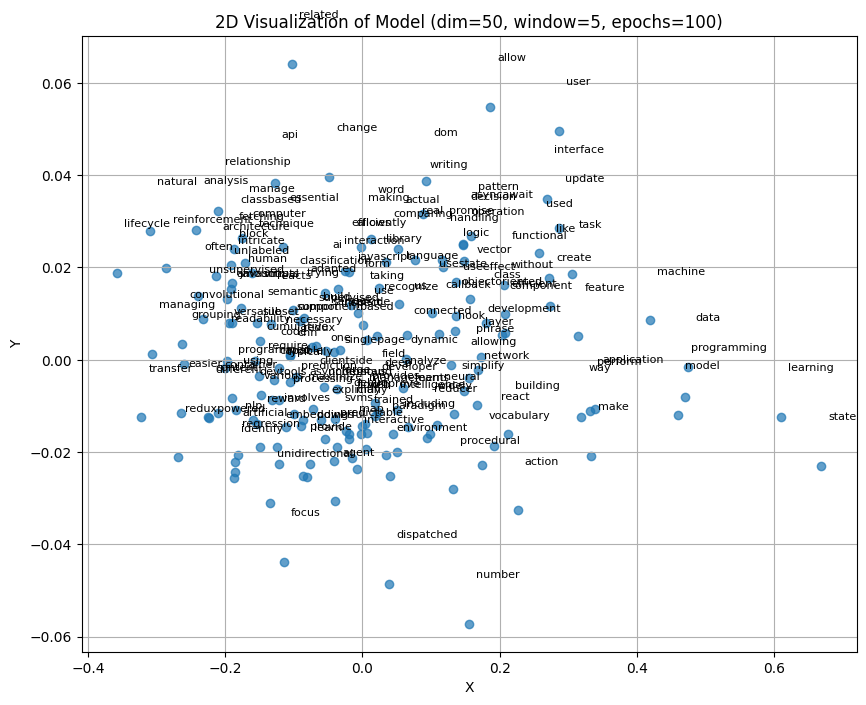

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.01427221  0.00245954 -0.01434654 -0.00448546  0.00743363  0.01166293
  0.00238849  0.00420235 -0.00821864  0.01445341 -0.01260305  0.00927996
 -0.01643807  0.00409222 -0.00995025 -0.00849222 -0.00621392  0.01131096
  0.01158249 -0.00994645  0.0015516  -0.01698324  0.0156401   0.01850191
 -0.00547406  0.00160132  0.00147619  0.01094978 -0.01721083  0.00116493
  0.0137332   0.00446749  0.00225662 -0.01866498  0.01695595 -0.01252483
 -0.00597899  0.00698385 -0.0015573   0.00283088  0.00355339 -0.01366114
 -0.01944552  0.01808234  0.01241587 -0.01382658  0.00679145  0.00042545
  0.0095133  -0.01423091]

Word: redux
Vector: [ 1.62645429e-02 -8.91466811e-03 -2.13671452e-03  2.01272964e-03
 -3.82227910e-04  2.29635485e-03  1.22277215e-02 -4.05430801e-05
 -6.49193069e-03 -3.02145723e-03  1.17945978e-02  3.02820443e-03
 -1.44852395e-03  1.86664946e-02 -9.84256715e-03 -1.67681929e-03
  1.83508229e-02  1.34988548

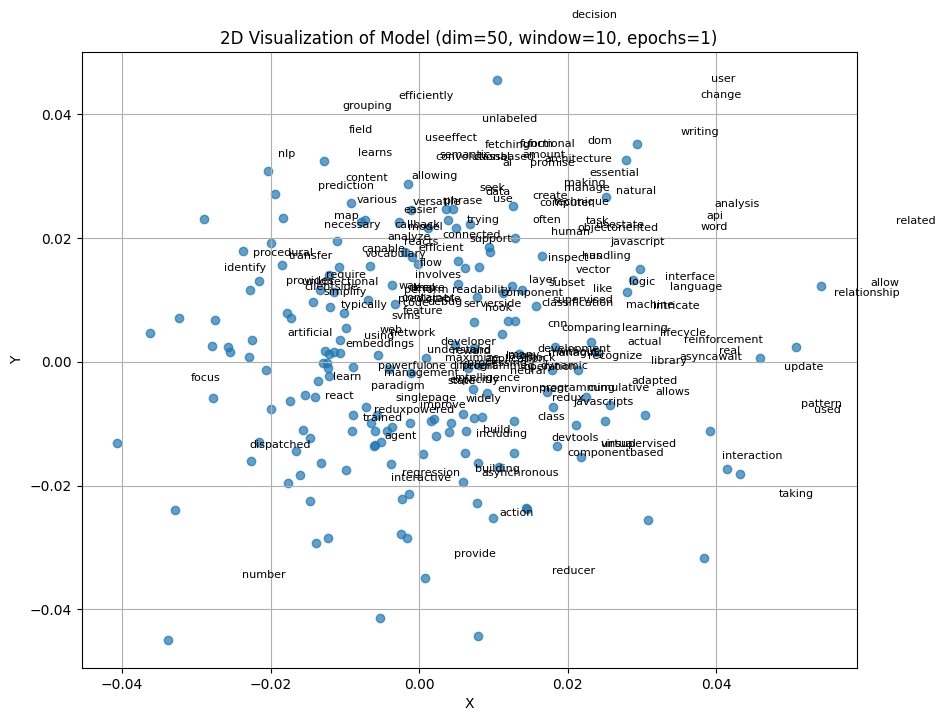

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-1.43470485e-02  2.38736463e-03 -1.41731314e-02 -4.46157157e-03
  7.68555468e-03  1.12714125e-02  2.81690131e-03  4.44926834e-03
 -8.58904980e-03  1.42266667e-02 -1.25413071e-02  8.89480952e-03
 -1.63045041e-02  4.15101415e-03 -9.93596017e-03 -8.24566372e-03
 -6.03661779e-03  1.16046909e-02  1.10112512e-02 -1.00268321e-02
  1.58568588e-03 -1.67503934e-02  1.59864966e-02  1.84085704e-02
 -5.26960474e-03  1.59462413e-03  1.25805393e-03  1.09848743e-02
 -1.75012946e-02  1.03925448e-03  1.37944780e-02  4.37432574e-03
  2.06423318e-03 -1.88692249e-02  1.67422350e-02 -1.23682702e-02
 -5.67055261e-03  6.87564677e-03 -1.36661925e-03  2.53671897e-03
  4.08822205e-03 -1.37842130e-02 -1.95039157e-02  1.83086116e-02
  1.30263390e-02 -1.37296375e-02  6.38763374e-03  3.55181473e-05
  9.61006992e-03 -1.41057326e-02]

Word: redux
Vector: [ 1.61518008e-02 -8.92392639e-03 -2.07750988e-03  2.09893729e-03
 -6.86612475e-05  1

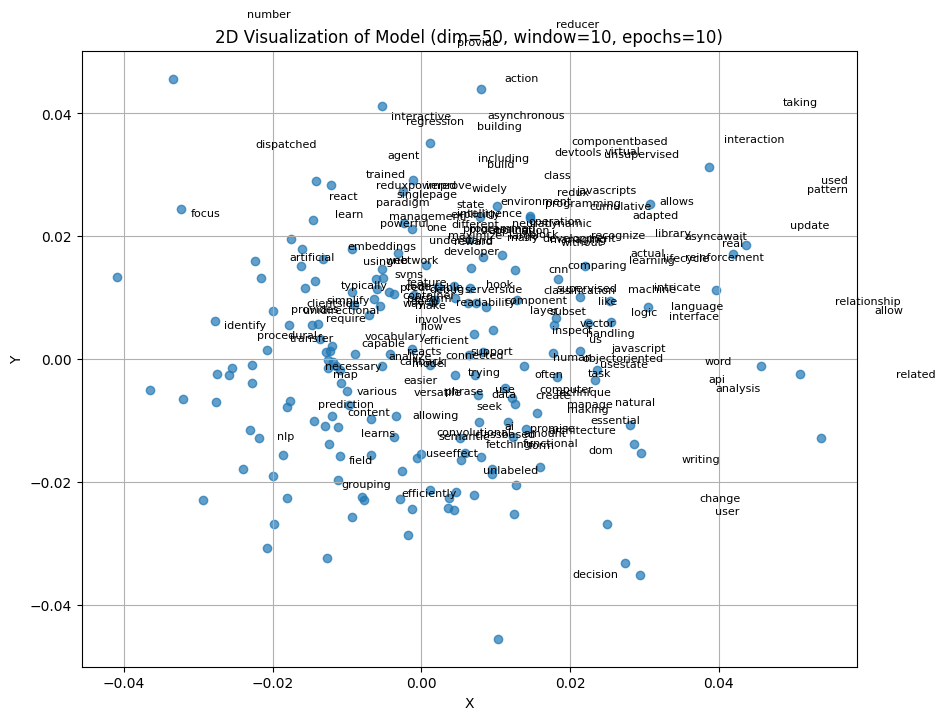

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.03630393  0.02015769  0.06524405 -0.02078078  0.2875276  -0.5116927
  0.46707103  0.47996396 -0.3568717  -0.18766958  0.00528914 -0.4636456
  0.11289015  0.15707813  0.02982035  0.26606792  0.09588185  0.27755705
 -0.5705282  -0.18113719  0.12722704  0.33744785  0.4324633  -0.03509386
  0.28434226 -0.05273083 -0.229702    0.06179134 -0.3691269  -0.12389238
  0.04973503 -0.08664487 -0.17833297 -0.25354522 -0.18017459  0.2510466
  0.50150365 -0.02739553  0.26932427 -0.24676667  0.53981507 -0.09476174
 -0.05651622  0.1235408   0.6643394   0.07656202 -0.4231761  -0.2846311
  0.2576507   0.02972444]

Word: redux
Vector: [ 0.00130244 -0.00349835  0.04093102 -0.00610913  0.15228882 -0.27761933
  0.2643512   0.2568305  -0.19088203 -0.1086694   0.01799968 -0.25088602
  0.0657413   0.10175004  0.01048911  0.14554809  0.06946002  0.15929776
 -0.31073394 -0.10836707  0.0755484   0.18925689  0.24597533 -0.02783598


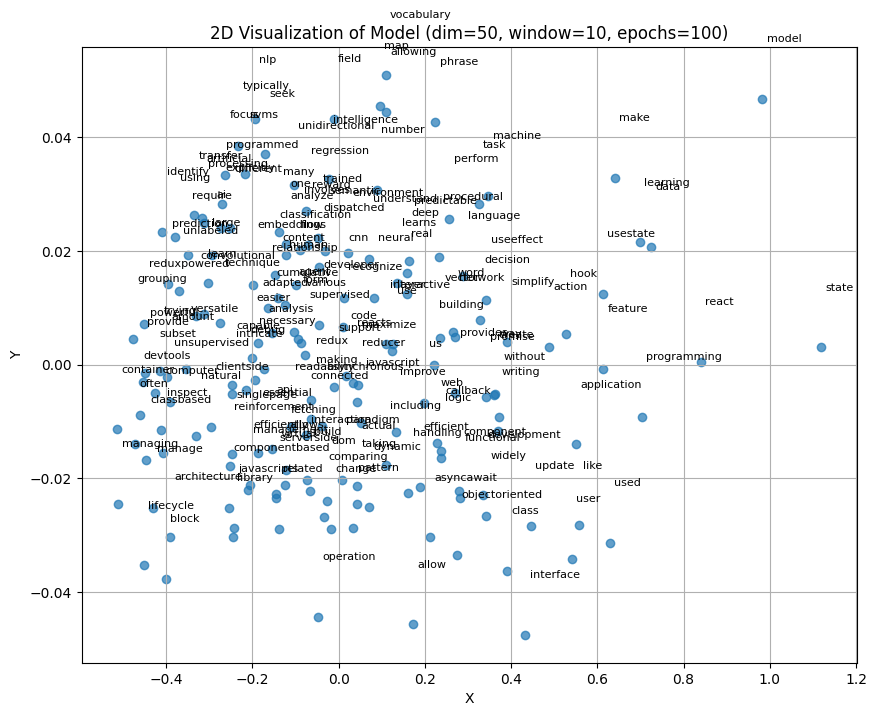

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-9.5712086e-03  8.9480123e-03  4.1637691e-03  9.2353309e-03
  6.6442685e-03  2.9159395e-03  9.8050050e-03 -4.4165570e-03
 -6.8000210e-03  4.2228750e-03  3.7280316e-03 -5.6647914e-03
  9.7083775e-03 -3.5602115e-03  9.5532844e-03  8.3352829e-04
 -6.3427482e-03 -1.9799101e-03 -7.3765921e-03 -2.9788744e-03
  1.0412029e-03  9.4811134e-03  9.3566654e-03 -6.5999082e-03
  3.4733291e-03  2.2785272e-03 -2.4930076e-03 -9.2344787e-03
  1.0280127e-03 -8.1594922e-03  6.3150660e-03 -5.7952488e-03
  5.5397805e-03  9.8338434e-03 -1.6617135e-04  4.5264540e-03
 -1.8085096e-03  7.3597799e-03  3.9376542e-03 -9.0154810e-03
 -2.3942087e-03  3.6282563e-03 -9.5092750e-05 -1.2081267e-03
 -1.0500465e-03 -1.6736999e-03  6.0347817e-04  4.1587981e-03
 -4.2499513e-03 -3.8385990e-03 -5.2089381e-05  2.6791368e-04
 -1.7163735e-04 -4.7887284e-03  4.3142280e-03 -2.1747393e-03
  2.1068540e-03  6.6080393e-04  5.9663383e-03 -6.8378616e-03
 -6.

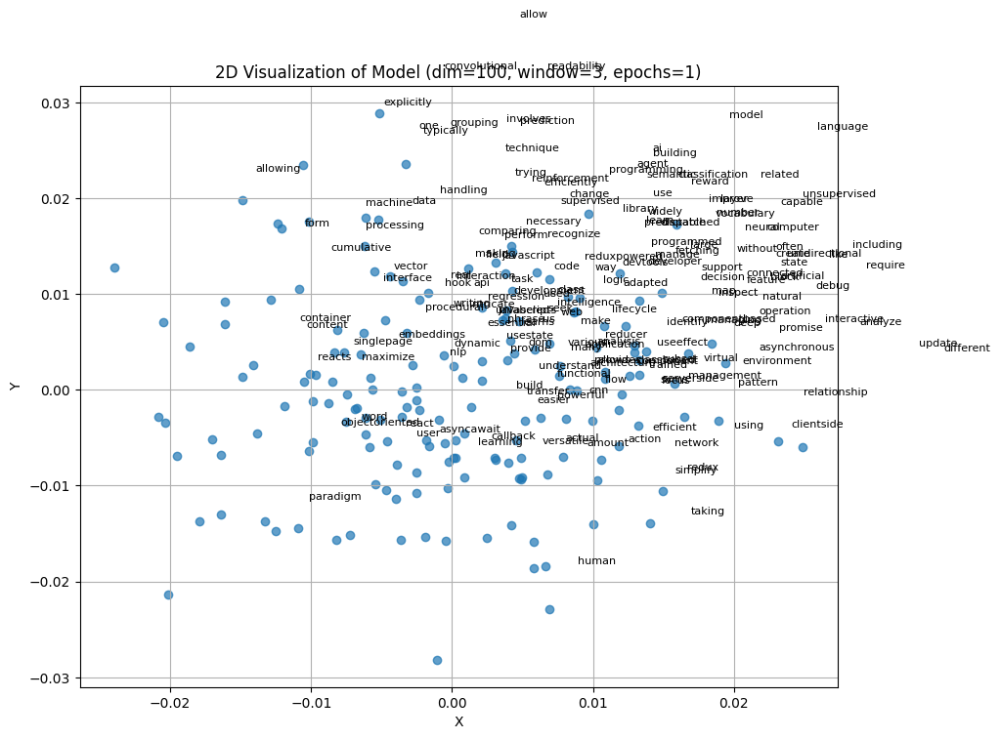

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-9.5813731e-03  9.0032676e-03  4.1613169e-03  9.2098685e-03
  6.6493400e-03  2.8256974e-03  9.8280450e-03 -4.3136715e-03
 -6.8525374e-03  4.2353091e-03  3.7402906e-03 -5.7329517e-03
  9.7281253e-03 -3.5136067e-03  9.5491093e-03  8.1795128e-04
 -6.2969811e-03 -2.1041383e-03 -7.4188826e-03 -3.1034164e-03
  1.0432807e-03  9.4960332e-03  9.3502039e-03 -6.6875564e-03
  3.4352653e-03  2.2733146e-03 -2.5048049e-03 -9.3315858e-03
  1.0083448e-03 -8.1563601e-03  6.4024562e-03 -5.7573495e-03
  5.5427863e-03  9.7762924e-03 -1.8076351e-04  4.6404498e-03
 -1.7854309e-03  7.3274421e-03  3.9332863e-03 -9.1279028e-03
 -2.4173646e-03  3.5036437e-03 -1.2014745e-04 -1.2017412e-03
 -1.0361404e-03 -1.6741148e-03  5.5125210e-04  4.1336063e-03
 -4.2430749e-03 -3.8531495e-03  1.3806153e-05  2.1337646e-04
 -1.2970094e-04 -4.7825188e-03  4.3106545e-03 -2.1512187e-03
  2.1140485e-03  6.8675313e-04  5.8874339e-03 -6.7916545e-03
 -6.

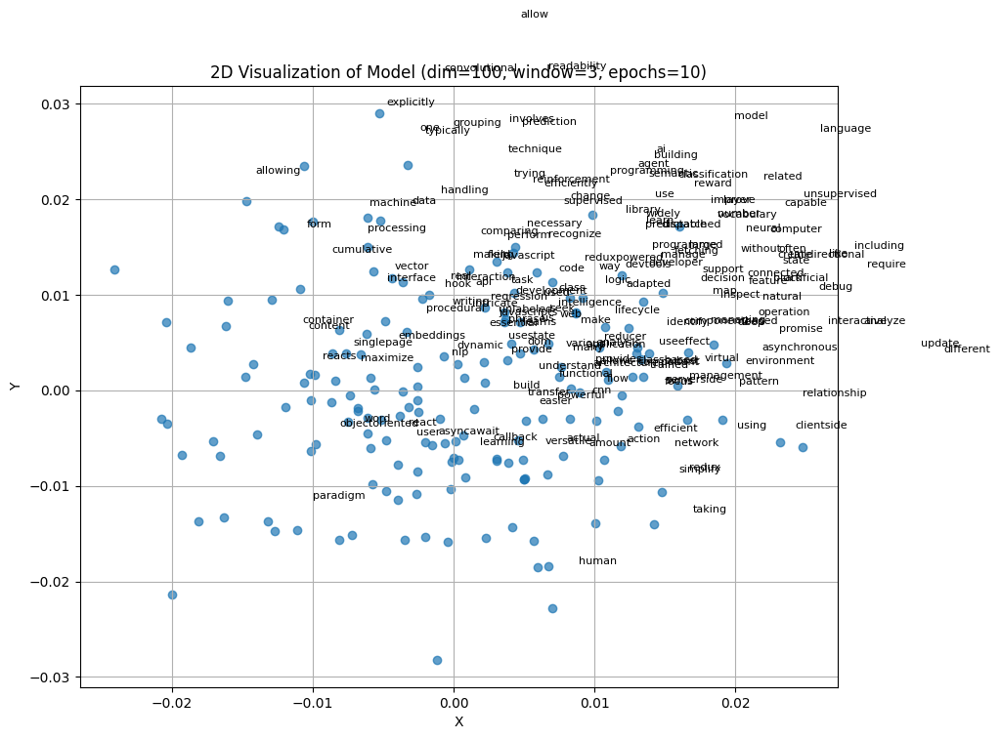

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.02223385  0.03479368  0.00205451  0.00548987  0.00382727 -0.04670777
  0.02936494  0.05597119 -0.04307706  0.00378609  0.00776062 -0.04815405
  0.01117295  0.01418034  0.0197282   0.00042227  0.00292837 -0.06548579
 -0.03296505 -0.06632372  0.01511122  0.01824867  0.00104209 -0.03076821
 -0.01990771  0.00930723 -0.00098187 -0.04582171 -0.01152187 -0.00776577
  0.04731652  0.00335033  0.01283997 -0.01761949 -0.02067994  0.06102902
  0.01883673 -0.00559162 -0.00765324 -0.05508737 -0.00601951 -0.04645469
 -0.02132769  0.00510618  0.02181789 -0.00704545 -0.02043504 -0.00157541
  0.01764691  0.00245674  0.02565677 -0.02443139  0.02008486 -0.00228051
  0.00645994  0.01195301  0.01284668  0.01262521 -0.02494129  0.01984049
 -0.01201563  0.00278299  0.02122709 -0.01443206 -0.04252073  0.0236327
  0.00582853  0.05764767 -0.03687629  0.05820894 -0.03625454  0.02302904
  0.01754399 -0.00844208  0.02703895  0.0163

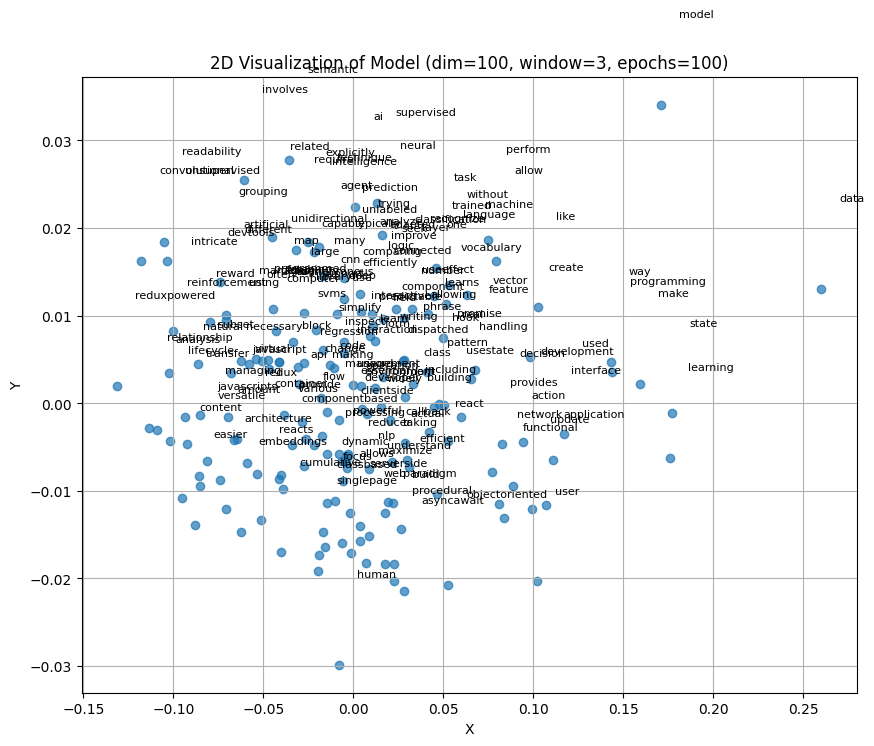

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-9.5726736e-03  8.9456998e-03  4.1633947e-03  9.2386054e-03
  6.6445787e-03  2.9140157e-03  9.8062614e-03 -4.4195242e-03
 -6.8053450e-03  4.2232969e-03  3.7320824e-03 -5.6689023e-03
  9.7067291e-03 -3.5575968e-03  9.5525952e-03  8.3163934e-04
 -6.3410616e-03 -1.9798845e-03 -7.3774308e-03 -2.9829368e-03
  1.0396631e-03  9.4824294e-03  9.3574990e-03 -6.5988298e-03
  3.4724982e-03  2.2801091e-03 -2.4958961e-03 -9.2310617e-03
  1.0289242e-03 -8.1594335e-03  6.3168369e-03 -5.8002579e-03
  5.5417237e-03  9.8355636e-03 -1.6589492e-04  4.5329649e-03
 -1.8070989e-03  7.3563824e-03  3.9360835e-03 -9.0171620e-03
 -2.3957235e-03  3.6250916e-03 -9.7030934e-05 -1.1991499e-03
 -1.0513166e-03 -1.6671770e-03  5.9617386e-04  4.1604280e-03
 -4.2510661e-03 -3.8372306e-03 -5.4050663e-05  2.6772768e-04
 -1.6671780e-04 -4.7886069e-03  4.3132748e-03 -2.1681543e-03
  2.1056647e-03  6.6679856e-04  5.9684268e-03 -6.8353442e-03
 -6.

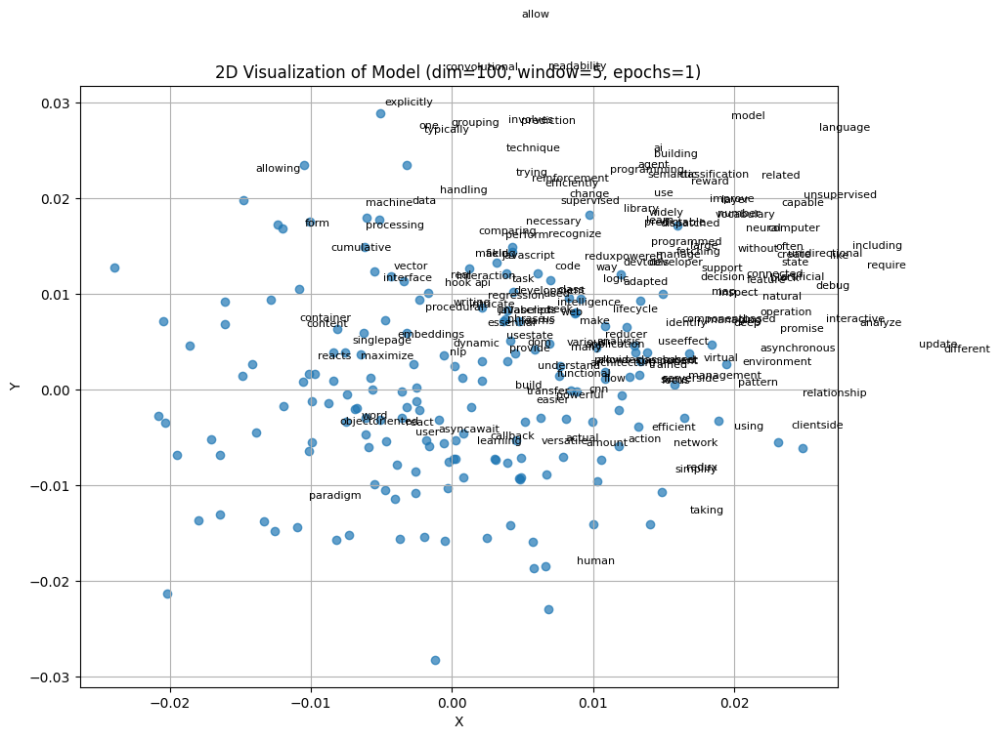

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-9.6044950e-03  9.0100113e-03  4.2144754e-03  9.2545506e-03
  6.6368030e-03  2.5956249e-03  9.8705031e-03 -4.1134870e-03
 -7.0043346e-03  4.1999118e-03  3.7957367e-03 -5.9188846e-03
  9.8328451e-03 -3.4409359e-03  9.6562095e-03  8.3476253e-04
 -6.2959590e-03 -2.3103561e-03 -7.6168394e-03 -3.3628868e-03
  1.0419611e-03  9.6246302e-03  9.3574040e-03 -6.7795403e-03
  3.3175244e-03  2.4210929e-03 -2.5074340e-03 -9.4188359e-03
  9.8321075e-04 -8.1419135e-03  6.3912030e-03 -5.8713290e-03
  5.6485427e-03  9.6922331e-03 -3.3560360e-04  4.8667998e-03
 -1.7248986e-03  7.2647198e-03  3.8756540e-03 -9.3483478e-03
 -2.3547267e-03  3.3872796e-03 -1.9690454e-04 -1.1127077e-03
 -8.0912589e-04 -1.7300006e-03  3.9187589e-04  4.1192351e-03
 -4.1793771e-03 -3.7999460e-03 -1.7370685e-06  1.2637107e-04
 -2.6883416e-05 -4.8187017e-03  4.2990223e-03 -2.0499849e-03
  2.0699727e-03  7.1590347e-04  5.7755746e-03 -6.6183759e-03
 -6.

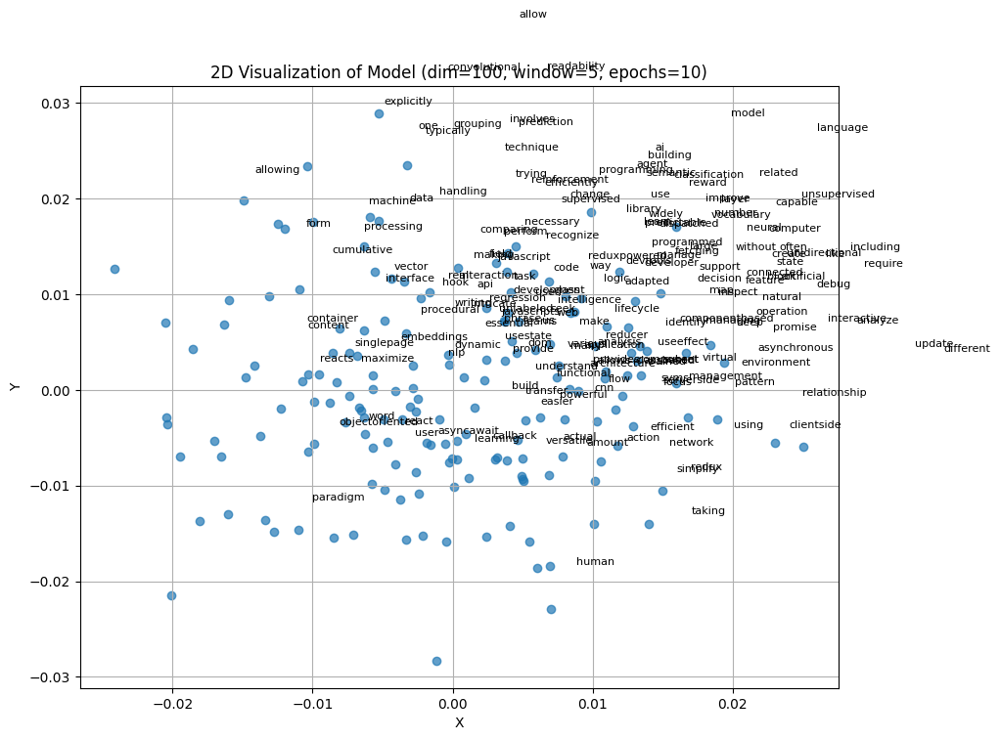

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.03845055  0.06490839  0.00582369  0.0231411   0.01134196 -0.13646239
  0.05920523  0.15568084 -0.10999797  0.00249698  0.01572075 -0.13086182
  0.02876922  0.05347475  0.04430864  0.00366356  0.01613617 -0.14666094
 -0.07965434 -0.18473001  0.03392686  0.04524792 -0.00412773 -0.07130826
 -0.05042347  0.03607276 -0.01173366 -0.08218795 -0.02970122 -0.00810887
  0.07480448 -0.01461198  0.01945257 -0.05617268 -0.06519945  0.15464553
  0.0466307  -0.00973561 -0.03000378 -0.13505925  0.00577962 -0.11569657
 -0.06549404  0.02429616  0.09007169 -0.0040497  -0.07749596 -0.01220149
  0.05330868  0.03030588  0.02755919 -0.05479361  0.07200799 -0.01285349
  0.00316529  0.03979803  0.02346611  0.0415872  -0.0734029   0.08014572
 -0.01075594 -0.00710835  0.0441975  -0.02228739 -0.08905978  0.07939318
  0.02874912  0.17065634 -0.07729874  0.15569325 -0.08022638  0.05946438
  0.06766952 -0.05617741  0.09571293  0.061

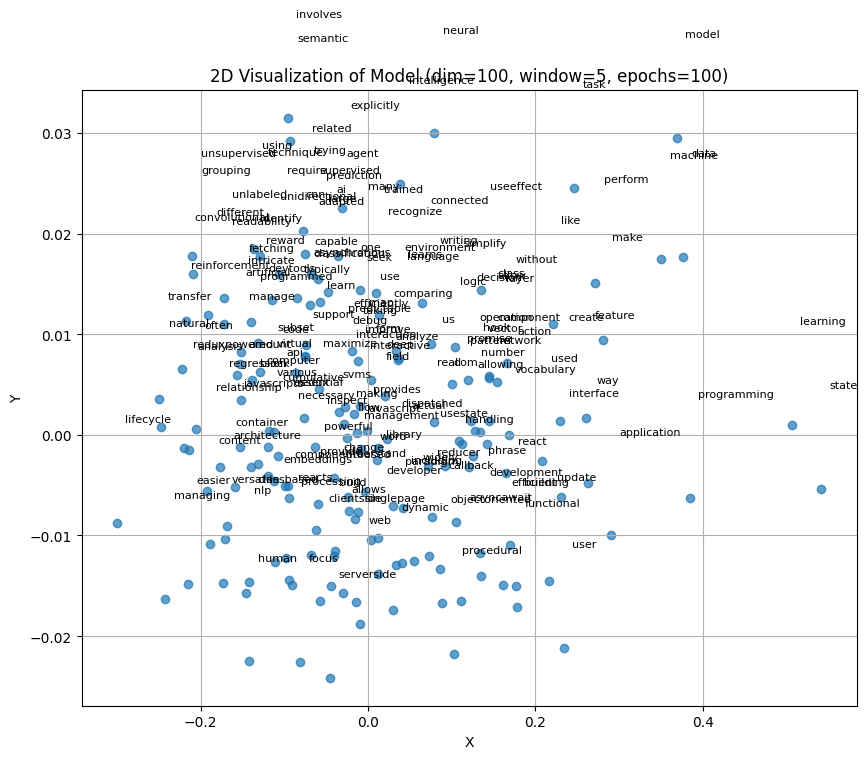

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-9.5714703e-03  8.9422129e-03  4.1640294e-03  9.2322081e-03
  6.6462252e-03  2.9128084e-03  9.8015061e-03 -4.4107880e-03
 -6.7941737e-03  4.2219921e-03  3.7238919e-03 -5.6659160e-03
  9.7035700e-03 -3.5551272e-03  9.5459744e-03  8.3301228e-04
 -6.3430159e-03 -1.9837604e-03 -7.3743844e-03 -2.9850558e-03
  1.0427419e-03  9.4869230e-03  9.3569411e-03 -6.6007501e-03
  3.4741892e-03  2.2840325e-03 -2.4946455e-03 -9.2331944e-03
  1.0314856e-03 -8.1611359e-03  6.3160476e-03 -5.8004800e-03
  5.5447333e-03  9.8358989e-03 -1.6405166e-04  4.5290287e-03
 -1.8054290e-03  7.3588216e-03  3.9384719e-03 -9.0134377e-03
 -2.3951798e-03  3.6239303e-03 -9.8256074e-05 -1.2020589e-03
 -1.0485776e-03 -1.6702395e-03  6.0357805e-04  4.1604866e-03
 -4.2511774e-03 -3.8341195e-03 -5.5480748e-05  2.6899585e-04
 -1.7137371e-04 -4.7890521e-03  4.3133134e-03 -2.1711630e-03
  2.1129914e-03  6.6074543e-04  5.9658471e-03 -6.8396721e-03
 -6.

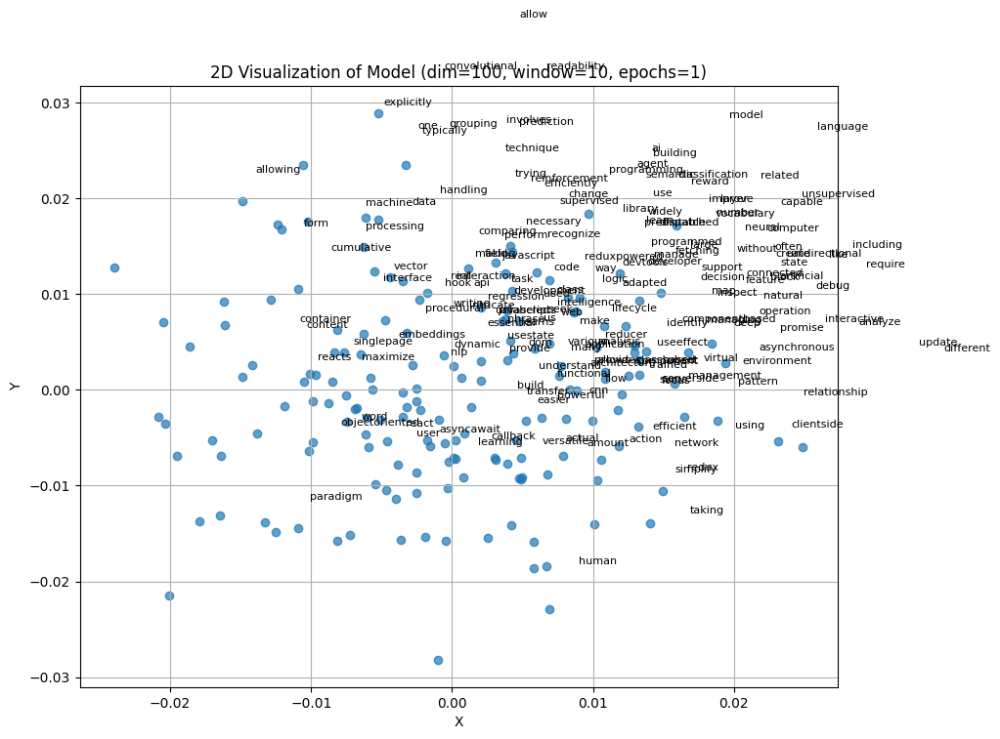

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-9.7101890e-03  8.9735845e-03  4.1424604e-03  9.1646118e-03
  6.7266985e-03  2.6175685e-03  9.8326840e-03 -4.0320372e-03
 -6.9114417e-03  4.1620107e-03  3.7580407e-03 -5.8291806e-03
  9.6303755e-03 -3.4450514e-03  9.5485905e-03  9.3009655e-04
 -6.3204966e-03 -2.2774932e-03 -7.4991980e-03 -3.2528318e-03
  1.0784793e-03  9.5669376e-03  9.3702404e-03 -6.7362972e-03
  3.3652668e-03  2.3313854e-03 -2.4190582e-03 -9.3720462e-03
  9.3332247e-04 -8.1373993e-03  6.5432391e-03 -5.8014868e-03
  5.5463528e-03  9.7446702e-03 -2.5954406e-04  4.8446953e-03
 -1.6847044e-03  7.3237200e-03  3.8566373e-03 -9.1577787e-03
 -2.3825390e-03  3.3777410e-03 -1.7136024e-04 -1.2306024e-03
 -8.5806631e-04 -1.7433360e-03  5.5269594e-04  4.1437075e-03
 -4.2359736e-03 -3.8097692e-03  4.3987133e-05  1.5721071e-04
 -8.2199840e-05 -4.8040859e-03  4.2555248e-03 -2.1412771e-03
  2.1717849e-03  7.5843034e-04  5.8454452e-03 -6.6677304e-03
 -6.

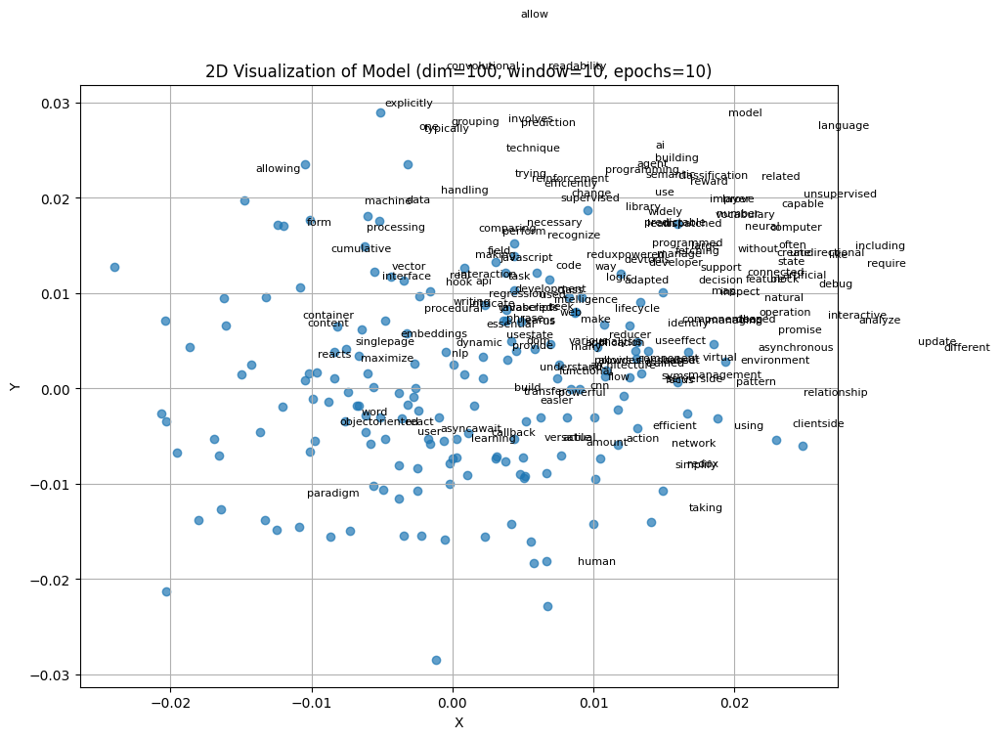

"Key 'framework' not present"
"Key 'internally' not present"
Word: react
Vector: [-0.12847874  0.10935401  0.00795862 -0.04132073  0.03452414 -0.3988148
  0.1309076   0.46010974 -0.21214794 -0.07408434  0.02951079 -0.28595528
  0.01220522  0.11073319  0.01769897  0.02894924  0.06793605 -0.38581774
 -0.19231649 -0.4543459   0.08286322  0.0746958  -0.03322639 -0.16532412
 -0.1328199   0.06796004  0.02418844 -0.1911163  -0.13723813 -0.00052276
  0.23723553  0.00610934  0.04019293 -0.1689131  -0.12485355  0.38347
  0.1466925  -0.05823711 -0.06920984 -0.2701747  -0.02173622 -0.30725574
 -0.16516723 -0.01614986  0.24679059 -0.0538811  -0.13561843 -0.02027654
  0.09645273  0.08423587  0.09045456 -0.14246754  0.11337093 -0.02775475
 -0.02012814  0.07940771  0.0788748   0.07026672 -0.16833587  0.22394365
 -0.02865285 -0.01168789  0.12670165 -0.06683213 -0.23485777  0.2168293
  0.11677424  0.3619301  -0.15484443  0.4075208  -0.09897714  0.15529364
  0.12893078 -0.05147159  0.2501871   0.10052599

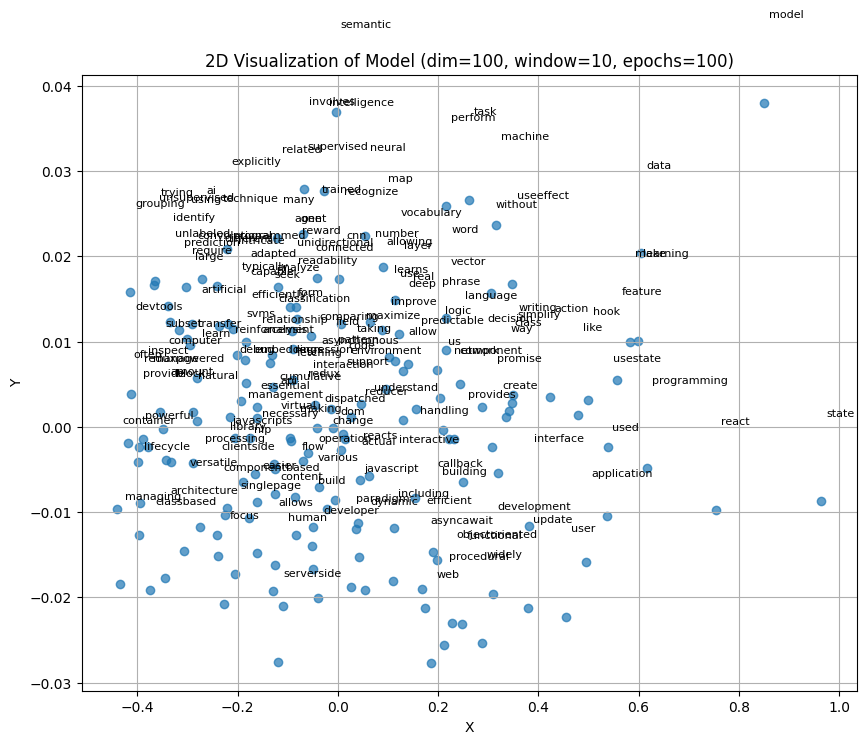

In [50]:
import os
from gensim.models import Word2Vec
import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize lemmatizer and stop words
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Function for preprocessing text
def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    words = word_tokenize(text)  # Tokenize words
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]  # Remove stopwords and lemmatize
    return words

# Updated corpus
corpus = [
    "In machine learning, models are trained using data to make predictions or decisions without being explicitly programmed to perform the task.",
    "Natural language processing (NLP) is a field that focuses on the interaction between computers and human language.",
    "Word embeddings map words or phrases in a vocabulary to vectors of real numbers, allowing the model to understand semantic relationships.",
    "The field of artificial intelligence (AI) seeks to create machines that can perform tasks that typically require human intelligence.",
    "Deep learning, a subset of machine learning, uses neural networks with many layers to learn from large amounts of data.",
    "In a convolutional neural network (CNN), layers are connected in such a way that they form a deep network capable of learning intricate patterns.",
    "Reinforcement learning involves an agent that learns to make decisions by taking actions in an environment to maximize cumulative rewards.",
    "Support vector machines (SVMs) are supervised learning models that analyze data and recognize patterns for classification and regression analysis.",
    "In unsupervised learning, the model learns from unlabeled data, trying to identify patterns or groupings in the data.",
    "Transfer learning is a technique where a model trained on one task is adapted to perform a related but different task.",
    "React is a JavaScript library for building user interfaces. It allows developers to build single-page applications with a component-based architecture.",
    "Redux is a state management library often used with React. It provides a predictable state container for managing application state.",
    "JavaScript is a versatile programming language used for client-side and server-side development. It is essential for building interactive web applications.",
    "In React, components are the building blocks of the user interface. They can be functional or class-based and manage their own state and lifecycle.",
    "Redux uses a unidirectional data flow, where actions are dispatched to reducers that update the application state. This makes the state management predictable and easier to debug.",
    "JavaScript supports various programming paradigms, including object-oriented, functional, and procedural programming. It is widely used in web development to create dynamic and interactive content.",
    "React's virtual DOM efficiently updates the user interface by comparing it with the actual DOM and only making necessary changes.",
    "Redux DevTools provide a powerful way to inspect and debug application state changes in a Redux-powered application.",
    "JavaScript's asynchronous programming features, such as callbacks, promises, and async/await, allow for efficient handling of operations like data fetching and user interactions.",
    "React's Hooks API provides a way to use state and other React features without writing a class. Hooks like useState and useEffect simplify component logic and improve code readability."
]

# Apply preprocessing to each document in the corpus
processed_corpus = [preprocess(doc) for doc in corpus]

# Hyperparameters to tune
dims = [10, 50, 100]     # Vector dimensions
windows = [3, 5, 10]     # Context window sizes
epochs = [1, 10, 100]    # Number of training epochs

# Directory to save models
models_dir = '/content/word2vec_models1'
os.makedirs(models_dir, exist_ok=True)

# Train and save Word2Vec models with different hyperparameters
for dim in dims:
    for window in windows:
        for epoch in epochs:
            print(f"Training model with dim={dim}, window={window}, epochs={epoch}")
            model = Word2Vec(sentences=processed_corpus, vector_size=dim, window=window, min_count=1, workers=4, epochs=epoch)

            # Define the model file name
            model_filename = f"word2vec_model_dim{dim}_window{window}_epochs{epoch}.model"
            model_path = os.path.join(models_dir, model_filename)

            # Save the model
            model.save(model_path)
            print(f"Model saved: {model_path}")

# Function to find word similarities
def find_word_similarity(model, word1, word2):
    try:
        similarity = model.wv.similarity(word1, word2)
        print(f"Similarity between '{word1}' and '{word2}': {similarity:.4f}")
    except KeyError as e:
        print(e)

# Function to print vectors for words
def print_word_vectors(model, words):
    for word in words:
        try:
            vector = model.wv[word]
            print(f"Word: {word}")
            print(f"Vector: {vector}\n")
        except KeyError:
            print(f"Word '{word}' not found in the vocabulary.")

# Function to plot the entire vocabulary embeddings in 2D
def plot_model_embeddings_2d(model, method='pca', title='2D Model Embeddings'):
    # Extract all word vectors from the model
    words = list(model.wv.index_to_key)
    word_vectors = np.array([model.wv[word] for word in words])

    # Choose dimensionality reduction method
    if method == 'pca':
        reducer = PCA(n_components=2)
    else:
        reducer = TSNE(n_components=2, random_state=42)

    # Reduce the word vectors to 2D
    embeddings_2d = reducer.fit_transform(word_vectors)

    plt.figure(figsize=(10, 8))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], marker='o', alpha=0.7)

    # Optionally annotate some words if needed
    for i, word in enumerate(words):
        plt.text(embeddings_2d[i, 0] + 0.01, embeddings_2d[i, 1] + 0.01, word, fontsize=8)

    plt.title(title)
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

# Choose words to analyze
words_to_analyze = ['react', 'redux', 'javascript', 'framework', 'developer', 'component', 'state', 'props', 'hook', 'virtual', 'DOM']

# Analyze each trained model
for dim in dims:
    for window in windows:
        for epoch in epochs:
            # Load the saved model
            model_filename = f"word2vec_model_dim{dim}_window{window}_epochs{epoch}.model"
            model_path = os.path.join(models_dir, model_filename)
            model = Word2Vec.load(model_path)

            # Print word similarities
            find_word_similarity(model, 'framework', 'developer')
            find_word_similarity(model, 'internally', 'companies')

            # Print word vectors
            print_word_vectors(model, words_to_analyze)

            # Plot 2D visualization of the entire model embeddings
            plot_model_embeddings_2d(model, method='pca', title=f'2D Visualization of Model (dim={dim}, window={window}, epochs={epoch})')



Loading model: /content/word2vec_models1/word2vec_model_dim10_window3_epochs1.model
Similarity between 'react' and 'component': -0.3869
Similarity between 'redux' and 'state': -0.5364
"Key 'framework' not present"
Word: react
Vector: [-0.00849689  0.02815957  0.05401263  0.07048451 -0.0570524   0.01858103
  0.06095566 -0.04799857 -0.03111822  0.06793318]

Word: component
Vector: [ 0.01218818 -0.08458325 -0.08223945 -0.00231016  0.01237288 -0.05743381
 -0.04725274 -0.07346074  0.08328615  0.00121298]

Word: redux
Vector: [ 0.02348376 -0.04519032  0.08388732 -0.09858163  0.06764641  0.02914417
 -0.04932832  0.04398187 -0.01739575  0.06711384]

Word: state
Vector: [ 0.07387752 -0.01539835 -0.04532586  0.06551814 -0.04861463 -0.01817925
  0.0287926   0.00989795 -0.08294751 -0.0945489 ]

Word: javascript
Vector: [-0.0937006   0.0382674   0.04884479 -0.06428564  0.01208558 -0.02074877
  0.00024403 -0.09883509  0.02692004 -0.04750106]

Word 'framework' not found in the vocabulary.


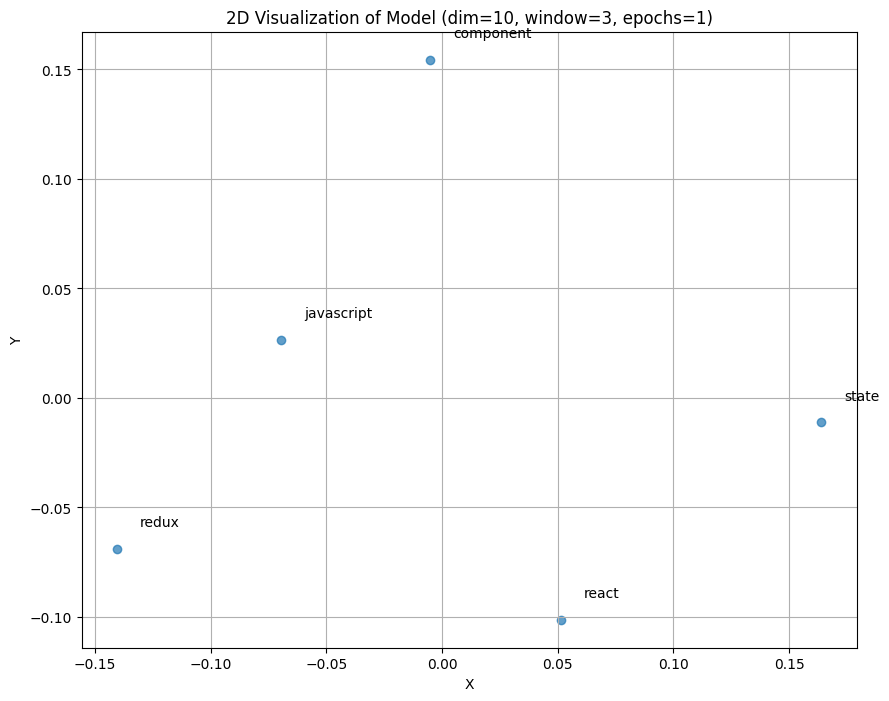


Loading model: /content/word2vec_models1/word2vec_model_dim10_window3_epochs10.model
Similarity between 'react' and 'component': -0.3922
Similarity between 'redux' and 'state': -0.5271
"Key 'framework' not present"
Word: react
Vector: [-0.00828338  0.02795438  0.05474539  0.07095454 -0.05712561  0.0188494
  0.0617611  -0.04758941 -0.03188542  0.06733948]

Word: component
Vector: [ 0.01235603 -0.08486788 -0.08114783 -0.00206714  0.01247627 -0.05750381
 -0.04620121 -0.07309473  0.08236698  0.00027868]

Word: redux
Vector: [ 0.02375945 -0.04540325  0.08442769 -0.09834421  0.06767824  0.02941226
 -0.0488448   0.04427553 -0.01786597  0.06688369]

Word: state
Vector: [ 0.07404099 -0.01577348 -0.04326435  0.06589641 -0.04879717 -0.01782298
  0.03075846  0.01034961 -0.08506627 -0.09606833]

Word: javascript
Vector: [-0.0933995   0.03793473  0.04946962 -0.0642207   0.01215825 -0.02059712
  0.00069321 -0.09887763  0.02633824 -0.0481382 ]

Word 'framework' not found in the vocabulary.


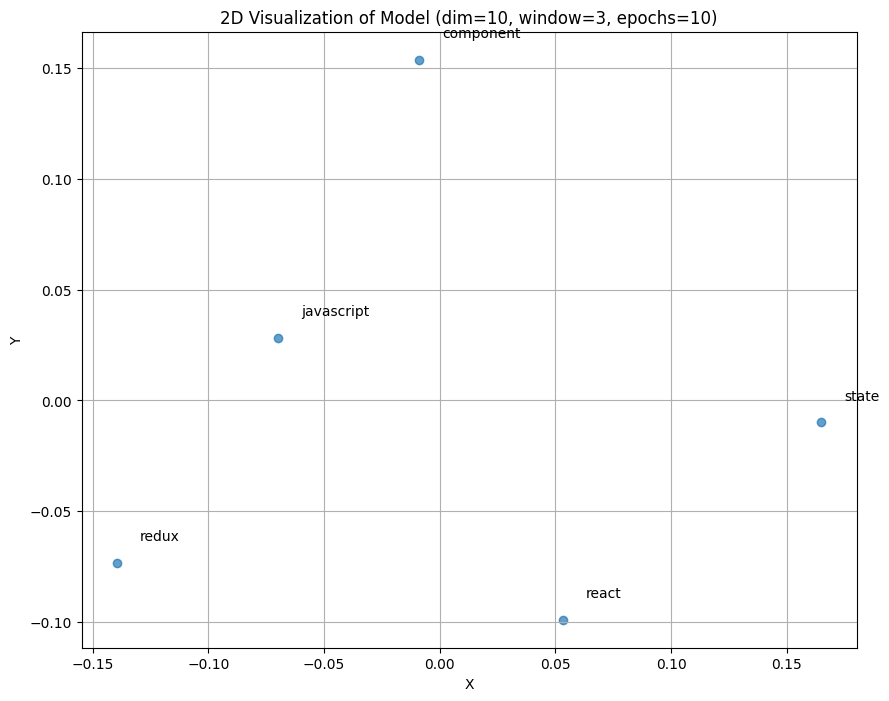


Loading model: /content/word2vec_models1/word2vec_model_dim10_window3_epochs100.model
Similarity between 'react' and 'component': 0.9447
Similarity between 'redux' and 'state': 0.9013
"Key 'framework' not present"
Word: react
Vector: [ 0.07884988 -0.11005338  0.42075983  0.2718632   0.03936496  0.10569372
  0.41232535  0.14964955 -0.384602   -0.21299158]

Word: component
Vector: [ 0.08986191 -0.21527362  0.27356198  0.18265222  0.09760845  0.00774568
  0.27830297  0.10389638 -0.2446733  -0.2525386 ]

Word: redux
Vector: [ 0.08348771 -0.14091767  0.32422903  0.03981635  0.12208968  0.09542299
  0.17681     0.17374569 -0.24731965 -0.11040926]

Word: state
Vector: [ 0.20574157 -0.22995955  0.4857841   0.35968325  0.07920175  0.11415943
  0.5421136   0.28297055 -0.616677   -0.5110386 ]

Word: javascript
Vector: [-0.03947141 -0.04297009  0.26307005  0.04421483  0.06881124  0.02680489
  0.20157465  0.01757932 -0.17451209 -0.20844412]

Word 'framework' not found in the vocabulary.


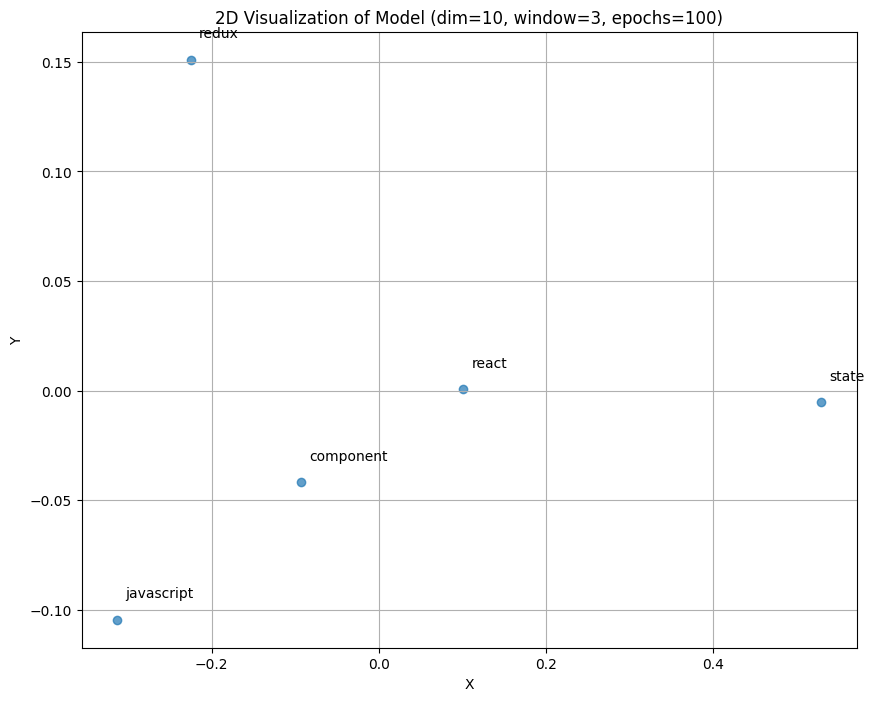


Loading model: /content/word2vec_models1/word2vec_model_dim10_window5_epochs1.model
Similarity between 'react' and 'component': -0.3872
Similarity between 'redux' and 'state': -0.5367
"Key 'framework' not present"
Word: react
Vector: [-0.00850364  0.02821995  0.05407735  0.07046407 -0.05702531  0.01856245
  0.06096558 -0.04800189 -0.03114909  0.06797595]

Word: component
Vector: [ 0.01218818 -0.08458325 -0.08223945 -0.00231016  0.01237288 -0.05743381
 -0.04725274 -0.07346074  0.08328615  0.00121298]

Word: redux
Vector: [ 0.02348376 -0.04519032  0.08388732 -0.09858163  0.06764641  0.02914417
 -0.04932832  0.04398187 -0.01739575  0.06711384]

Word: state
Vector: [ 0.07381605 -0.01537168 -0.04536078  0.06552681 -0.04858191 -0.01816417
  0.02882178  0.00989989 -0.08289484 -0.0944696 ]

Word: javascript
Vector: [-0.0937006   0.0382674   0.04884479 -0.06428564  0.01208558 -0.02074877
  0.00024403 -0.09883509  0.02692004 -0.04750106]

Word 'framework' not found in the vocabulary.


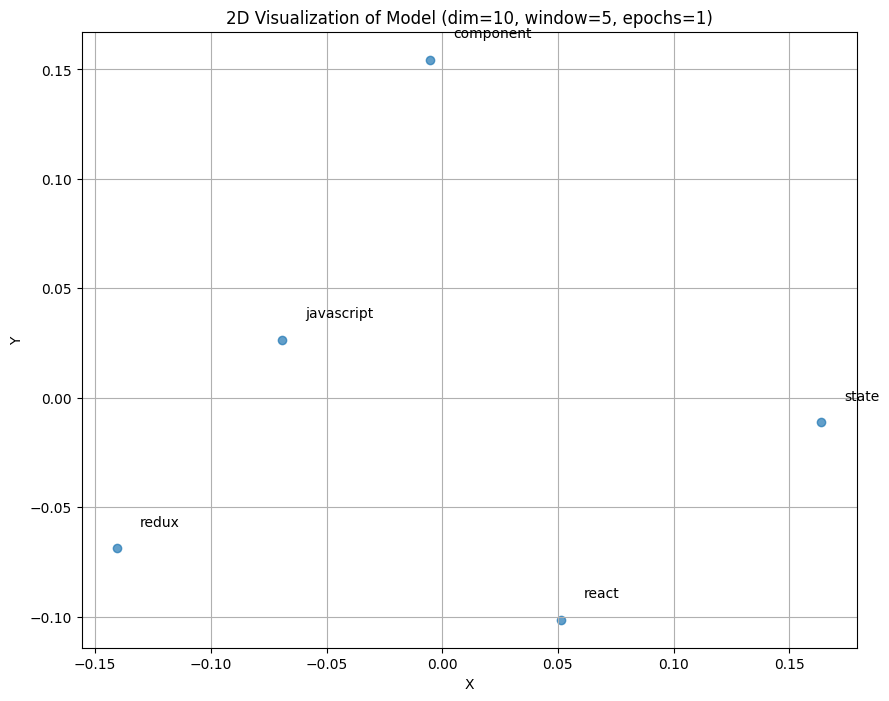


Loading model: /content/word2vec_models1/word2vec_model_dim10_window5_epochs10.model
Similarity between 'react' and 'component': -0.4024
Similarity between 'redux' and 'state': -0.5202
"Key 'framework' not present"
Word: react
Vector: [-0.0072133   0.02650876  0.0563155   0.07089984 -0.05608243  0.01865522
  0.06410822 -0.04671939 -0.03449288  0.06643437]

Word: component
Vector: [ 0.01283004 -0.08604273 -0.08039123 -0.00203457  0.01271884 -0.05729548
 -0.04470233 -0.07251168  0.08068774 -0.00016079]

Word: redux
Vector: [ 0.02371184 -0.04570736  0.08409344 -0.09833755  0.067909    0.02942112
 -0.04836905  0.04433563 -0.01835084  0.06684613]

Word: state
Vector: [ 0.07471936 -0.0166644  -0.04322269  0.06603675 -0.04779361 -0.01752175
  0.0321316   0.01118575 -0.08560383 -0.0956357 ]

Word: javascript
Vector: [-0.09255151  0.03754308  0.0508794  -0.06398807  0.01269092 -0.0207074
  0.00254553 -0.09778664  0.0250281  -0.04858514]

Word 'framework' not found in the vocabulary.


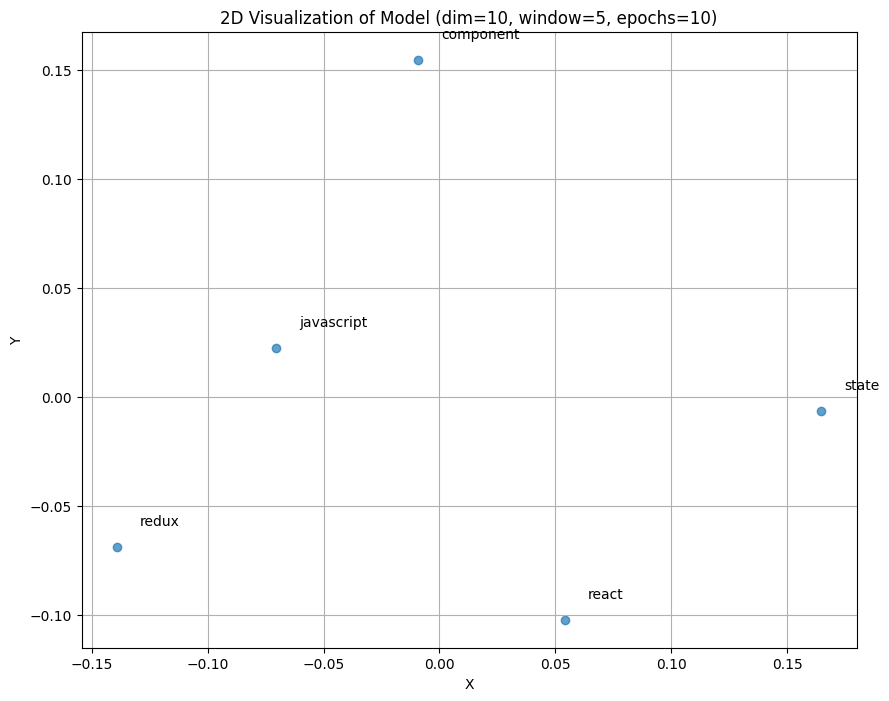


Loading model: /content/word2vec_models1/word2vec_model_dim10_window5_epochs100.model
Similarity between 'react' and 'component': 0.9870
Similarity between 'redux' and 'state': 0.9725
"Key 'framework' not present"
Word: react
Vector: [ 0.22369467 -0.27335703  0.67578036  0.26878223  0.14087656  0.12015768
  0.8587831   0.33844435 -0.7189435  -0.38897148]

Word: component
Vector: [ 0.25672793 -0.4042944   0.5842088   0.21416314  0.20206505  0.02818231
  0.79194295  0.3287321  -0.6531922  -0.4768793 ]

Word: redux
Vector: [ 0.18519497 -0.24590775  0.49993375  0.0513606   0.1891067   0.10937612
  0.4810849   0.29569784 -0.47984093 -0.23429607]

Word: state
Vector: [ 0.43640435 -0.4722306   0.8932344   0.38907677  0.24136813  0.15544577
  1.241098    0.5795031  -1.1434015  -0.79359967]

Word: javascript
Vector: [ 0.0927547  -0.1874062   0.52972364  0.08538868  0.16829354  0.04543373
  0.6105435   0.21831836 -0.4897995  -0.40350816]

Word 'framework' not found in the vocabulary.


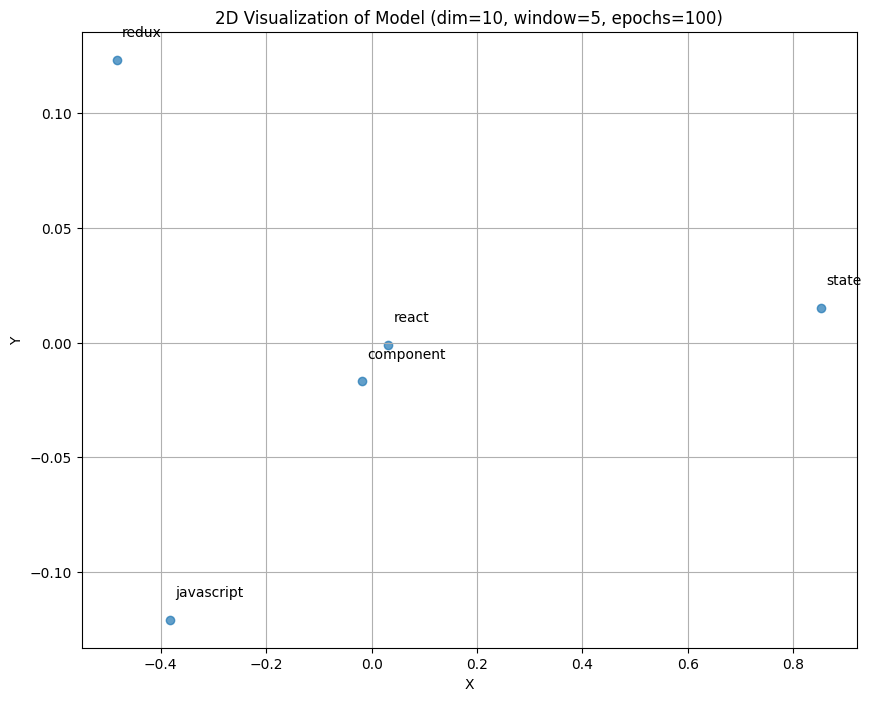


Loading model: /content/word2vec_models1/word2vec_model_dim10_window10_epochs1.model
Similarity between 'react' and 'component': -0.3871
Similarity between 'redux' and 'state': -0.5366
"Key 'framework' not present"
Word: react
Vector: [-0.0084919   0.0281769   0.05404272  0.07044696 -0.0570327   0.01857504
  0.06093044 -0.0479909  -0.03111854  0.06792837]

Word: component
Vector: [ 0.01218818 -0.08458325 -0.08223945 -0.00231016  0.01237288 -0.05743381
 -0.04725274 -0.07346074  0.08328615  0.00121298]

Word: redux
Vector: [ 0.02348376 -0.04519032  0.08388732 -0.09858163  0.06764641  0.02914417
 -0.04932832  0.04398187 -0.01739575  0.06711384]

Word: state
Vector: [ 0.07384064 -0.01539134 -0.04537112  0.06554899 -0.04857985 -0.01818292
  0.02875289  0.00992045 -0.08287863 -0.09452613]

Word: javascript
Vector: [-0.0937006   0.0382674   0.04884479 -0.06428564  0.01208558 -0.02074877
  0.00024403 -0.09883509  0.02692004 -0.04750106]

Word 'framework' not found in the vocabulary.


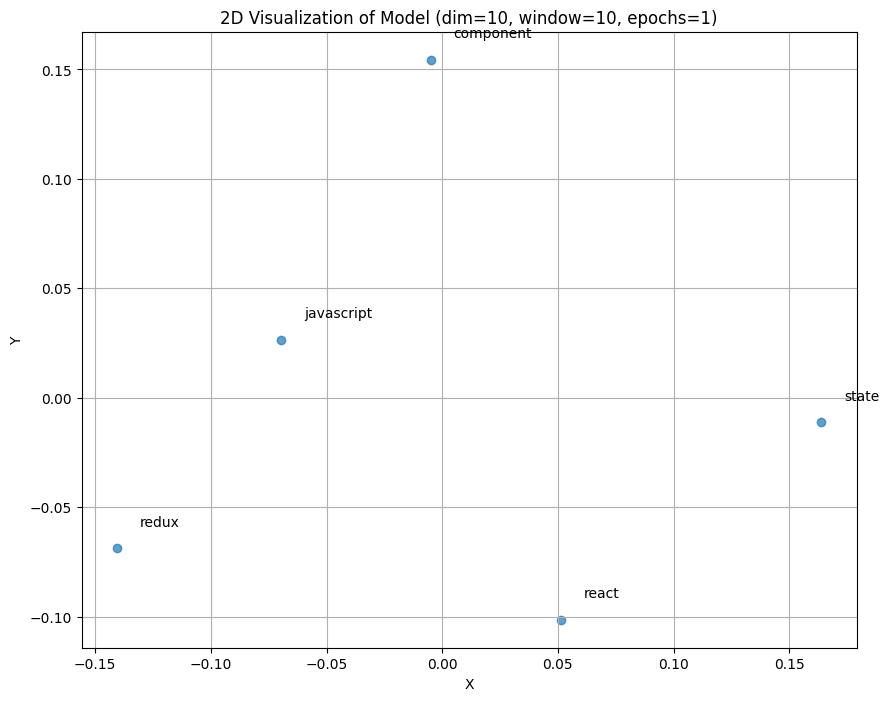


Loading model: /content/word2vec_models1/word2vec_model_dim10_window10_epochs10.model
Similarity between 'react' and 'component': -0.4005
Similarity between 'redux' and 'state': -0.4950
"Key 'framework' not present"
Word: react
Vector: [-0.00769782  0.02711463  0.05585678  0.07139614 -0.0567162   0.0193515
  0.06343657 -0.04680095 -0.0336658   0.06603736]

Word: component
Vector: [ 0.01297554 -0.08528253 -0.08088003 -0.00169235  0.01237373 -0.05721474
 -0.04569592 -0.07286604  0.08145272  0.00026131]

Word: redux
Vector: [ 0.02448525 -0.04617088  0.08590839 -0.09751046  0.06807657  0.02959383
 -0.04713069  0.04484975 -0.01997541  0.06530409]

Word: state
Vector: [ 0.07678261 -0.01851903 -0.04052171  0.0676165  -0.04823244 -0.01707158
  0.03418845  0.01257924 -0.08892677 -0.09890258]

Word: javascript
Vector: [-0.09310062  0.03762028  0.05022931 -0.06361346  0.0125084  -0.02060984
  0.00163321 -0.0976629   0.02552539 -0.04900409]

Word 'framework' not found in the vocabulary.


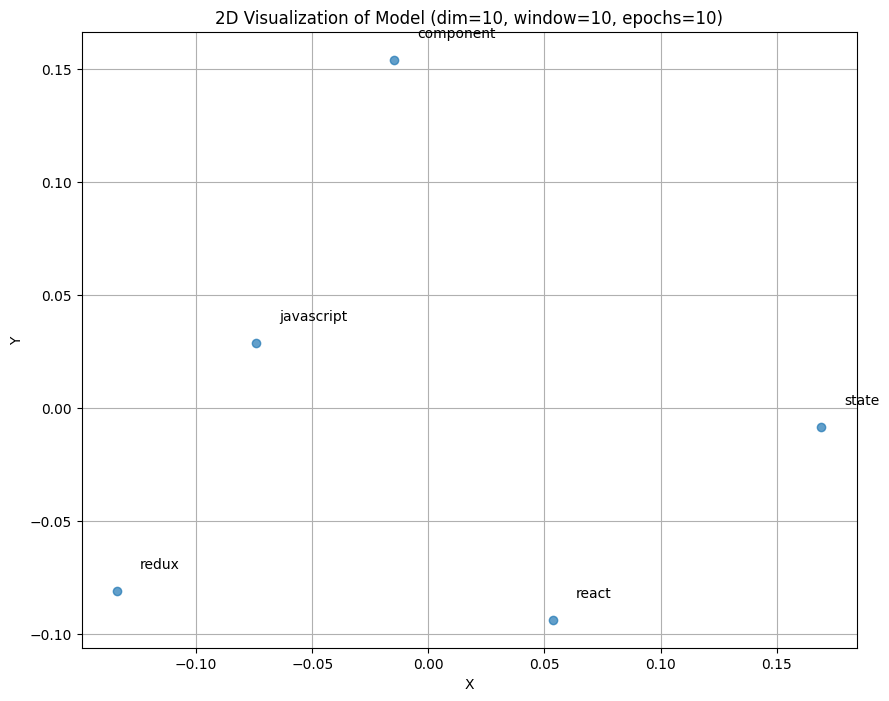


Loading model: /content/word2vec_models1/word2vec_model_dim10_window10_epochs100.model
Similarity between 'react' and 'component': 0.9928
Similarity between 'redux' and 'state': 0.9866
"Key 'framework' not present"
Word: react
Vector: [ 0.3851516  -0.315282    1.0809546   0.4504993   0.29784927  0.06669452
  1.3732125   0.6600198  -1.1924326  -0.89111245]

Word: component
Vector: [ 0.30494127 -0.35375017  0.7027251   0.28677166  0.2766817  -0.03722045
  0.95016634  0.45537272 -0.8125637  -0.72955877]

Word: redux
Vector: [ 0.25963503 -0.25728264  0.6690543   0.1406536   0.2779877   0.07604335
  0.71317816  0.44901985 -0.70036757 -0.4993346 ]

Word: state
Vector: [ 0.55018675 -0.44268686  1.123329    0.53579444  0.3698953   0.07143525
  1.5581933   0.81867903 -1.454606   -1.2281224 ]

Word: javascript
Vector: [ 0.17224889 -0.17978168  0.7411365   0.1784588   0.2753728   0.0038281
  0.879054    0.39385402 -0.72673476 -0.70513695]

Word 'framework' not found in the vocabulary.


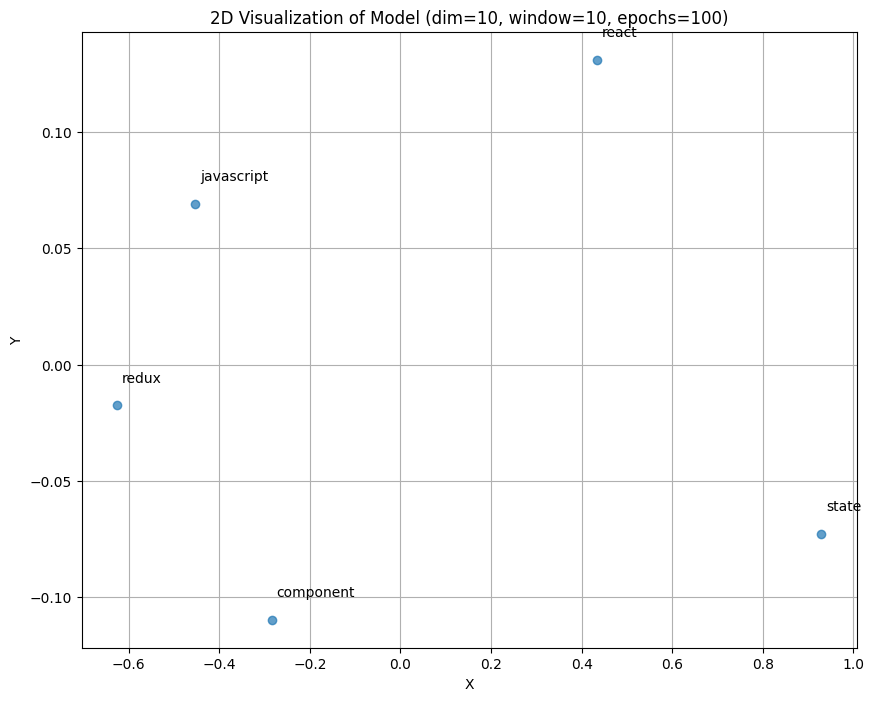


Loading model: /content/word2vec_models1/word2vec_model_dim50_window3_epochs1.model
Similarity between 'react' and 'component': -0.2235
Similarity between 'redux' and 'state': 0.0806
"Key 'framework' not present"
Word: react
Vector: [-0.01426887  0.00246369 -0.01435262 -0.00448676  0.00743086  0.0116624
  0.00240323  0.00420064 -0.00822238  0.01444686 -0.01260317  0.00928276
 -0.01642848  0.00407753 -0.00995193 -0.00850215 -0.00620507  0.01131132
  0.01158073 -0.00994809  0.00154836 -0.01699218  0.01562414  0.01850697
 -0.00548229  0.00160534  0.00147111  0.01095753 -0.01720987  0.00115876
  0.01373878  0.004459    0.00225448 -0.0186639   0.01696007 -0.01253704
 -0.00599173  0.00698366 -0.0015522   0.00283858  0.00355399 -0.01365865
 -0.01945298  0.01807565  0.01240379 -0.0138306   0.00680343  0.00042491
  0.00950129 -0.0142283 ]

Word: component
Vector: [ 1.53932925e-02  1.82412844e-02  2.27100379e-03 -1.66501589e-02
  1.68500319e-02 -7.39246141e-03  1.14843464e-02  8.78315885e-03
  

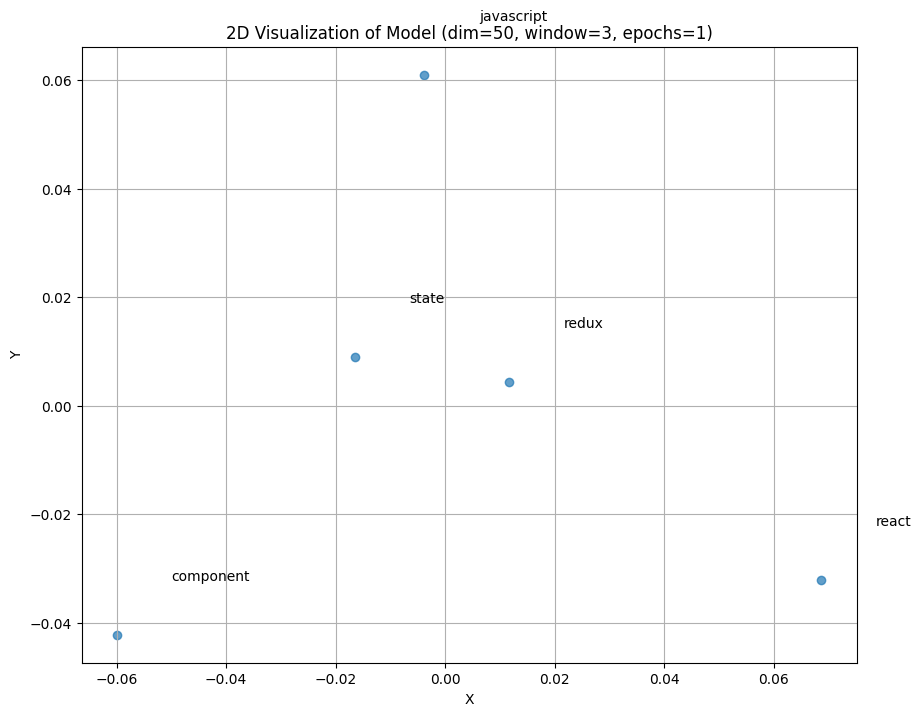


Loading model: /content/word2vec_models1/word2vec_model_dim50_window3_epochs10.model
Similarity between 'react' and 'component': -0.2211
Similarity between 'redux' and 'state': 0.0832
"Key 'framework' not present"
Word: react
Vector: [-0.0142892   0.00251549 -0.01433275 -0.00451454  0.00750142  0.01152162
  0.00260381  0.00434034 -0.00826976  0.01443634 -0.01267251  0.00917919
 -0.01634826  0.00405663 -0.00993974 -0.0084502  -0.00616699  0.01134378
  0.01134485 -0.0099743   0.0015329  -0.01686875  0.01572487  0.01846742
 -0.00542776  0.00162861  0.00142934  0.0109769  -0.01728458  0.00111698
  0.01371892  0.00440935  0.00210305 -0.01870216  0.01690188 -0.01240523
 -0.00581253  0.00694116 -0.00145511  0.00286437  0.0037059  -0.01363716
 -0.01941787  0.01805961  0.01265457 -0.01379673  0.00668675  0.00037875
  0.00959783 -0.01423867]

Word: component
Vector: [ 0.01539201  0.01823593  0.0022934  -0.01671609  0.01691993 -0.00755776
  0.01168868  0.00892263  0.01920397 -0.01867007  0.01836

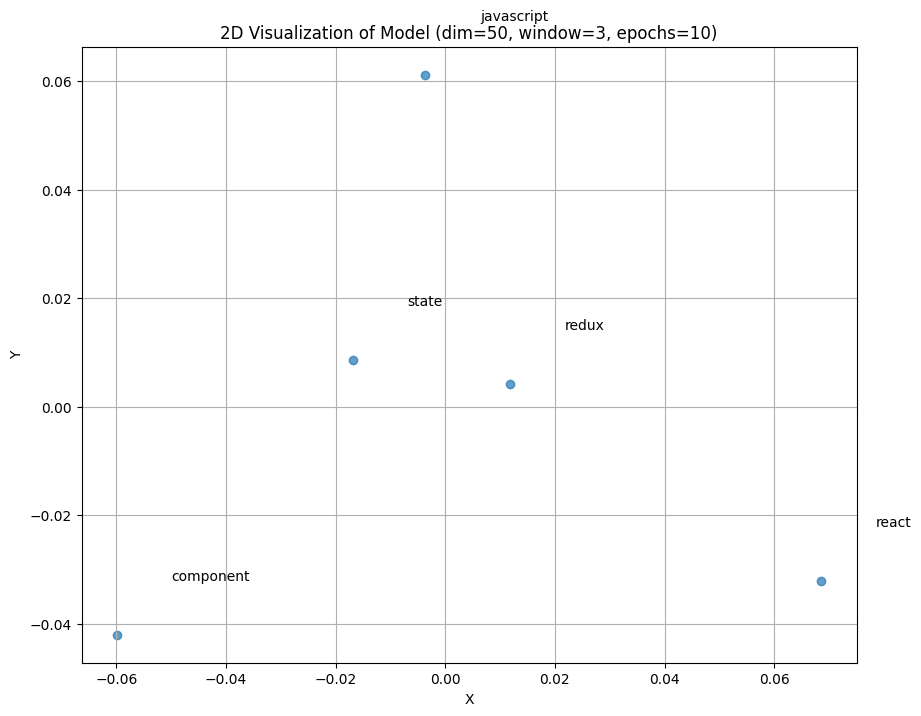


Loading model: /content/word2vec_models1/word2vec_model_dim50_window3_epochs100.model
Similarity between 'react' and 'component': 0.9265
Similarity between 'redux' and 'state': 0.9386
"Key 'framework' not present"
Word: react
Vector: [-0.00984326  0.02102254 -0.00787436 -0.03169503  0.06358122 -0.07289352
  0.08388183  0.07904568 -0.05699905 -0.00178739 -0.02366537 -0.07360996
  0.01842824  0.01654133 -0.00639743  0.02621513  0.00638658  0.03792372
 -0.08802571 -0.03540357  0.00867619  0.03437987  0.06886043 -0.00886544
  0.0285808  -0.00694333 -0.03525676  0.0197904  -0.05745038 -0.02171687
  0.01233061 -0.01303626 -0.0500714  -0.0498652  -0.02141446  0.02914519
  0.07730177  0.01672338  0.05278874 -0.02951321  0.09631243 -0.01790461
 -0.00769628  0.03917028  0.13647795 -0.01113617 -0.0573268  -0.05277249
  0.066874   -0.02386171]

Word: component
Vector: [ 0.02200243  0.03682258  0.00765088 -0.04144535  0.06963456 -0.08846359
  0.08686347  0.07749692 -0.02660899 -0.03590152  0.01035

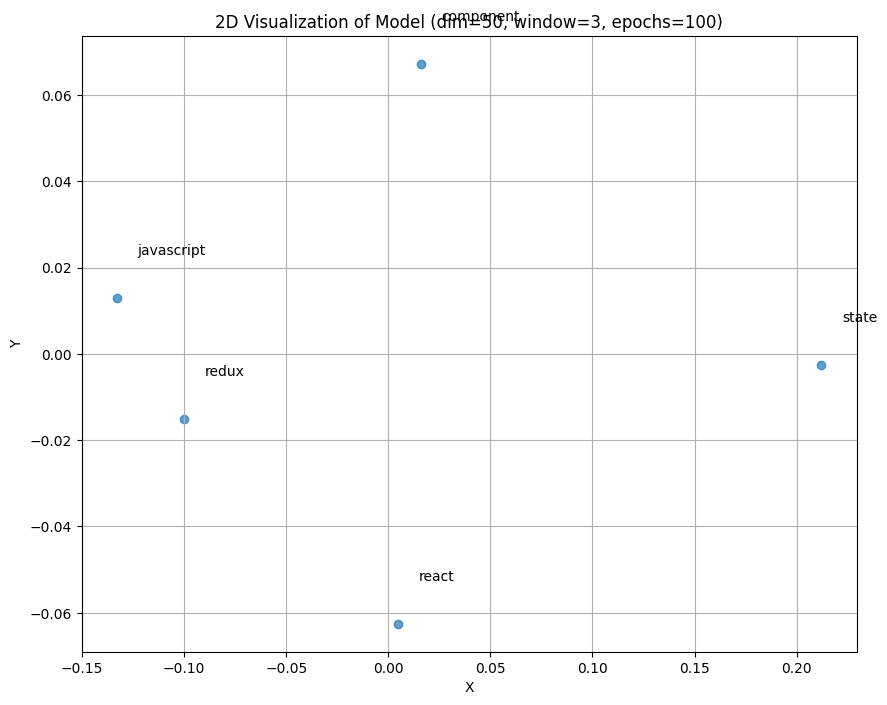


Loading model: /content/word2vec_models1/word2vec_model_dim50_window5_epochs1.model
Similarity between 'react' and 'component': -0.2235
Similarity between 'redux' and 'state': 0.0805
"Key 'framework' not present"
Word: react
Vector: [-0.01427939  0.00247252 -0.01435321 -0.00449214  0.0074359   0.01166421
  0.00239088  0.00420819 -0.00822263  0.01445647 -0.01261437  0.00928595
 -0.01642978  0.00408022 -0.00994681 -0.00849927 -0.00621478  0.01131231
  0.01159258 -0.00995598  0.00155209 -0.01698544  0.01563421  0.01851053
 -0.00547763  0.00160239  0.0014837   0.01095369 -0.01720896  0.00116007
  0.01373207  0.00445462  0.00224494 -0.01864851  0.01695914 -0.0125298
 -0.00598586  0.00697675 -0.00154238  0.0028416   0.00354789 -0.01365232
 -0.01944831  0.0180826   0.01240852 -0.01382056  0.00680642  0.00042612
  0.0095046  -0.01424043]

Word: component
Vector: [ 1.53932925e-02  1.82412844e-02  2.27100379e-03 -1.66501589e-02
  1.68500319e-02 -7.39246141e-03  1.14843464e-02  8.78315885e-03
  

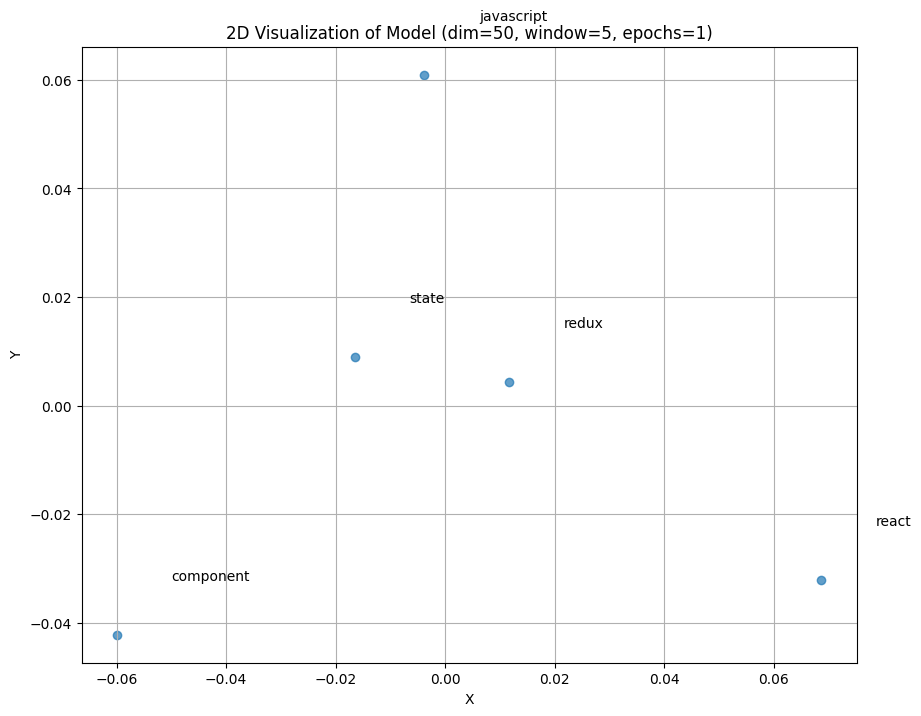


Loading model: /content/word2vec_models1/word2vec_model_dim50_window5_epochs10.model
Similarity between 'react' and 'component': -0.2177
Similarity between 'redux' and 'state': 0.0879
"Key 'framework' not present"
Word: react
Vector: [-0.01428228  0.00238972 -0.01419819 -0.00467602  0.00772592  0.01132102
  0.00270153  0.0047701  -0.00868485  0.01451653 -0.01266034  0.00900798
 -0.01602847  0.00409553 -0.0097641  -0.00847646 -0.00604125  0.01152765
  0.01101873 -0.0103233   0.00166752 -0.01659633  0.01614715  0.01850947
 -0.00536714  0.00147535  0.0010139   0.01113218 -0.01755899  0.00097683
  0.01373944  0.0043143   0.00179786 -0.01879414  0.01684153 -0.01236523
 -0.00557822  0.00695152 -0.00127812  0.00261205  0.00393966 -0.01364834
 -0.0195473   0.01830046  0.01310416 -0.01381061  0.00641598  0.00016691
  0.00971785 -0.01422332]

Word: component
Vector: [ 1.5446685e-02  1.8211739e-02  2.3391589e-03 -1.6777068e-02
  1.7016707e-02 -7.6915724e-03  1.1733425e-02  9.2335455e-03
  1.9059

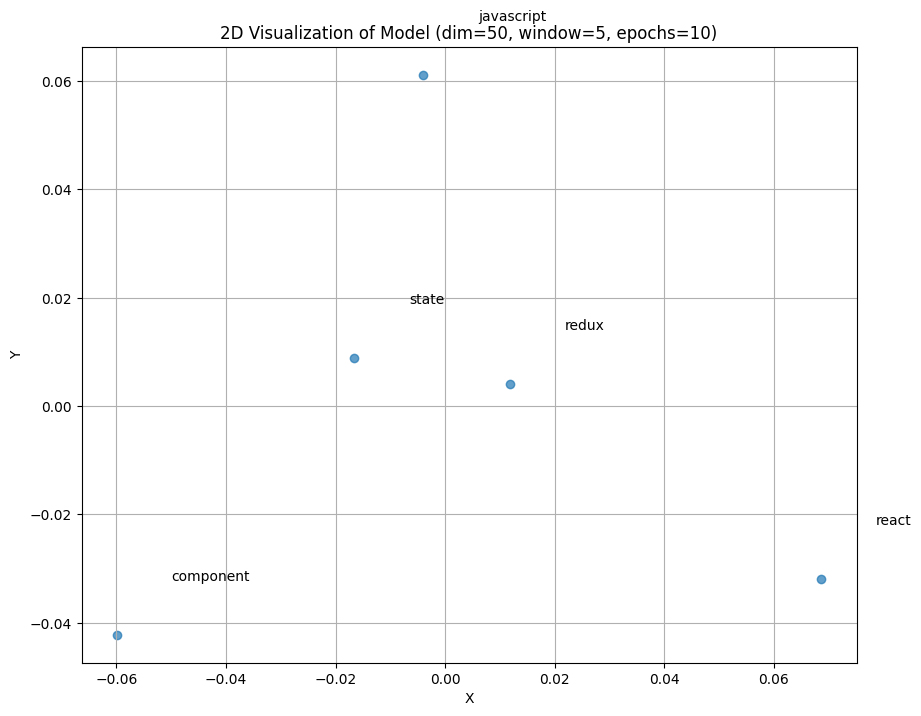


Loading model: /content/word2vec_models1/word2vec_model_dim50_window5_epochs100.model
Similarity between 'react' and 'component': 0.9882
Similarity between 'redux' and 'state': 0.9895
"Key 'framework' not present"
Word: react
Vector: [-0.02896484  0.01944852  0.03773069 -0.06035063  0.13779362 -0.16450904
  0.16509861  0.24125703 -0.14596048 -0.03638823 -0.01062968 -0.19154812
  0.10899028  0.07513674  0.04094917  0.08029696  0.03724989  0.11891808
 -0.23611814 -0.13998835  0.05958956  0.1290684   0.15996608 -0.02761087
  0.08230032 -0.03563419 -0.14649451  0.06272111 -0.15004699 -0.0756386
  0.02697201 -0.03021866 -0.1256994  -0.08099286 -0.06496987  0.0772168
  0.2276759   0.04955783  0.10976533 -0.09730377  0.20399944 -0.03443669
 -0.04076956  0.07428482  0.30611756  0.00082562 -0.13346587 -0.1378493
  0.14143941 -0.02806413]

Word: component
Vector: [ 0.00476657  0.03556219  0.05076109 -0.07240502  0.14574036 -0.18600817
  0.17068732  0.24276252 -0.11507237 -0.06889561  0.02155995

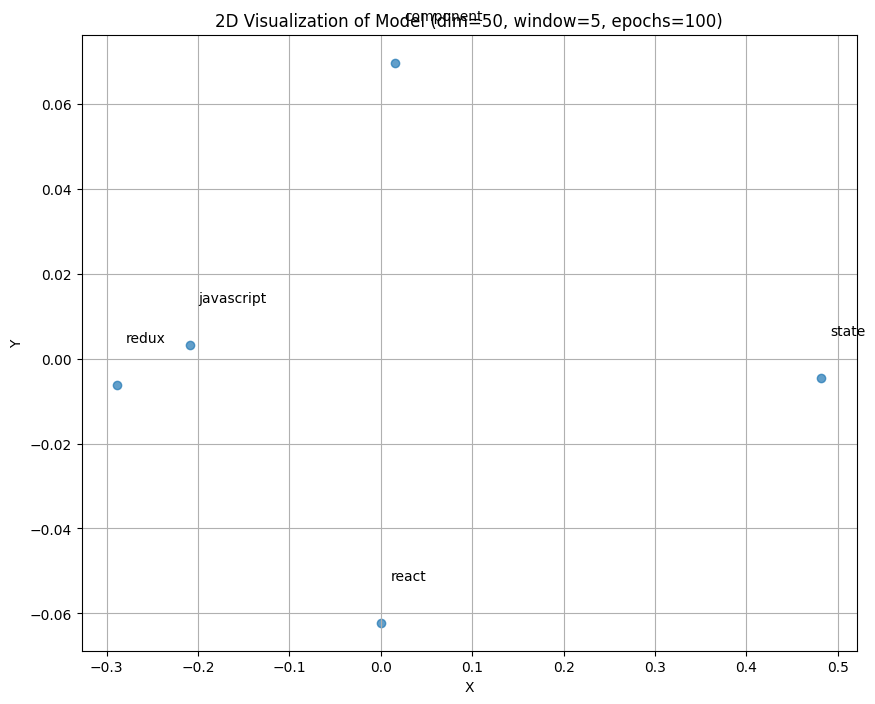


Loading model: /content/word2vec_models1/word2vec_model_dim50_window10_epochs1.model
Similarity between 'react' and 'component': -0.2235
Similarity between 'redux' and 'state': 0.0807
"Key 'framework' not present"
Word: react
Vector: [-0.01427221  0.00245954 -0.01434654 -0.00448546  0.00743363  0.01166293
  0.00238849  0.00420235 -0.00821864  0.01445341 -0.01260305  0.00927996
 -0.01643807  0.00409222 -0.00995025 -0.00849222 -0.00621392  0.01131096
  0.01158249 -0.00994645  0.0015516  -0.01698324  0.0156401   0.01850191
 -0.00547406  0.00160132  0.00147619  0.01094978 -0.01721083  0.00116493
  0.0137332   0.00446749  0.00225662 -0.01866498  0.01695595 -0.01252483
 -0.00597899  0.00698385 -0.0015573   0.00283088  0.00355339 -0.01366114
 -0.01944552  0.01808234  0.01241587 -0.01382658  0.00679145  0.00042545
  0.0095133  -0.01423091]

Word: component
Vector: [ 1.53932925e-02  1.82412844e-02  2.27100379e-03 -1.66501589e-02
  1.68500319e-02 -7.39246141e-03  1.14843464e-02  8.78315885e-03


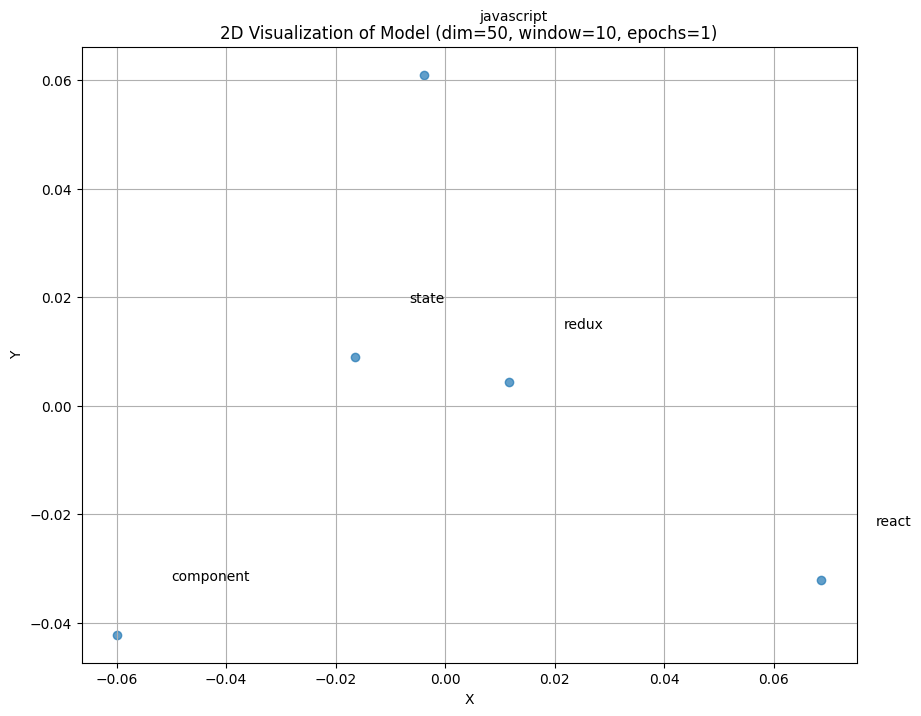


Loading model: /content/word2vec_models1/word2vec_model_dim50_window10_epochs10.model
Similarity between 'react' and 'component': -0.2171
Similarity between 'redux' and 'state': 0.1028
"Key 'framework' not present"
Word: react
Vector: [-1.43470485e-02  2.38736463e-03 -1.41731314e-02 -4.46157157e-03
  7.68555468e-03  1.12714125e-02  2.81690131e-03  4.44926834e-03
 -8.58904980e-03  1.42266667e-02 -1.25413071e-02  8.89480952e-03
 -1.63045041e-02  4.15101415e-03 -9.93596017e-03 -8.24566372e-03
 -6.03661779e-03  1.16046909e-02  1.10112512e-02 -1.00268321e-02
  1.58568588e-03 -1.67503934e-02  1.59864966e-02  1.84085704e-02
 -5.26960474e-03  1.59462413e-03  1.25805393e-03  1.09848743e-02
 -1.75012946e-02  1.03925448e-03  1.37944780e-02  4.37432574e-03
  2.06423318e-03 -1.88692249e-02  1.67422350e-02 -1.23682702e-02
 -5.67055261e-03  6.87564677e-03 -1.36661925e-03  2.53671897e-03
  4.08822205e-03 -1.37842130e-02 -1.95039157e-02  1.83086116e-02
  1.30263390e-02 -1.37296375e-02  6.38763374e-03 

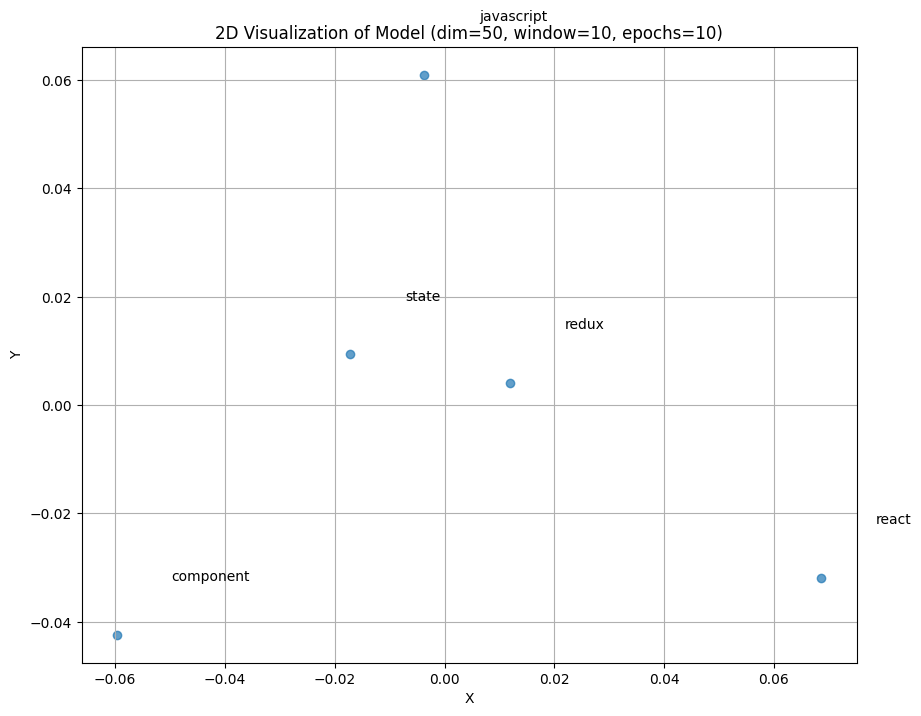


Loading model: /content/word2vec_models1/word2vec_model_dim50_window10_epochs100.model
Similarity between 'react' and 'component': 0.9969
Similarity between 'redux' and 'state': 0.9971
"Key 'framework' not present"
Word: react
Vector: [-0.03630393  0.02015769  0.06524405 -0.02078078  0.2875276  -0.5116927
  0.46707103  0.47996396 -0.3568717  -0.18766958  0.00528914 -0.4636456
  0.11289015  0.15707813  0.02982035  0.26606792  0.09588185  0.27755705
 -0.5705282  -0.18113719  0.12722704  0.33744785  0.4324633  -0.03509386
  0.28434226 -0.05273083 -0.229702    0.06179134 -0.3691269  -0.12389238
  0.04973503 -0.08664487 -0.17833297 -0.25354522 -0.18017459  0.2510466
  0.50150365 -0.02739553  0.26932427 -0.24676667  0.53981507 -0.09476174
 -0.05651622  0.1235408   0.6643394   0.07656202 -0.4231761  -0.2846311
  0.2576507   0.02972444]

Word: component
Vector: [ 4.5743943e-04  3.3150680e-02  5.8557723e-02 -3.0440915e-02
  2.1566062e-01 -3.8248938e-01  3.3759990e-01  3.4610218e-01
 -2.3053873

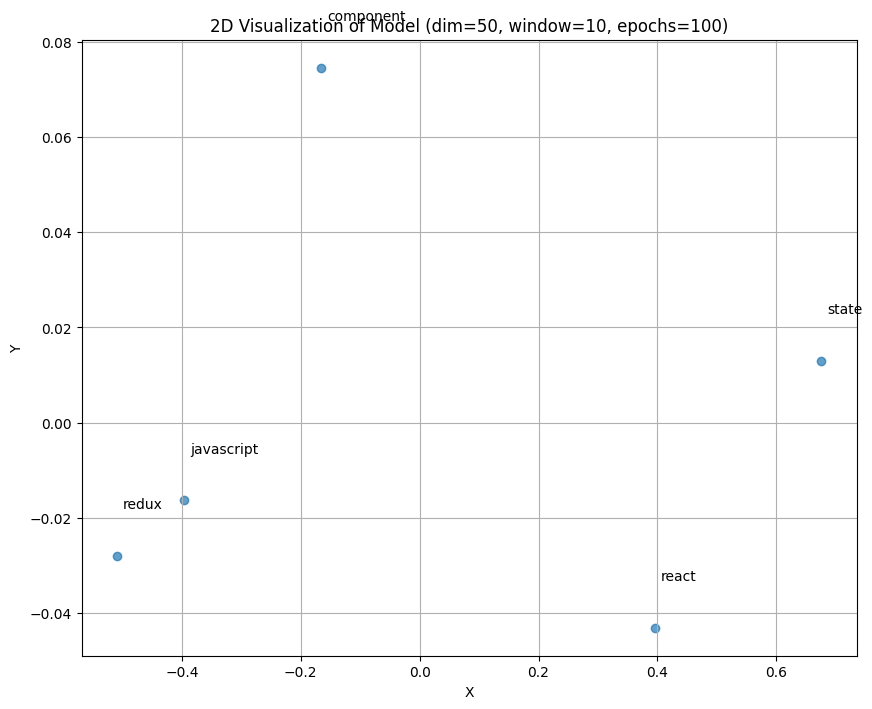


Loading model: /content/word2vec_models1/word2vec_model_dim100_window3_epochs1.model
Similarity between 'react' and 'component': -0.0848
Similarity between 'redux' and 'state': -0.0037
"Key 'framework' not present"
Word: react
Vector: [-9.5712086e-03  8.9480123e-03  4.1637691e-03  9.2353309e-03
  6.6442685e-03  2.9159395e-03  9.8050050e-03 -4.4165570e-03
 -6.8000210e-03  4.2228750e-03  3.7280316e-03 -5.6647914e-03
  9.7083775e-03 -3.5602115e-03  9.5532844e-03  8.3352829e-04
 -6.3427482e-03 -1.9799101e-03 -7.3765921e-03 -2.9788744e-03
  1.0412029e-03  9.4811134e-03  9.3566654e-03 -6.5999082e-03
  3.4733291e-03  2.2785272e-03 -2.4930076e-03 -9.2344787e-03
  1.0280127e-03 -8.1594922e-03  6.3150660e-03 -5.7952488e-03
  5.5397805e-03  9.8338434e-03 -1.6617135e-04  4.5264540e-03
 -1.8085096e-03  7.3597799e-03  3.9376542e-03 -9.0154810e-03
 -2.3942087e-03  3.6282563e-03 -9.5092750e-05 -1.2081267e-03
 -1.0500465e-03 -1.6736999e-03  6.0347817e-04  4.1587981e-03
 -4.2499513e-03 -3.8385990e-03 -

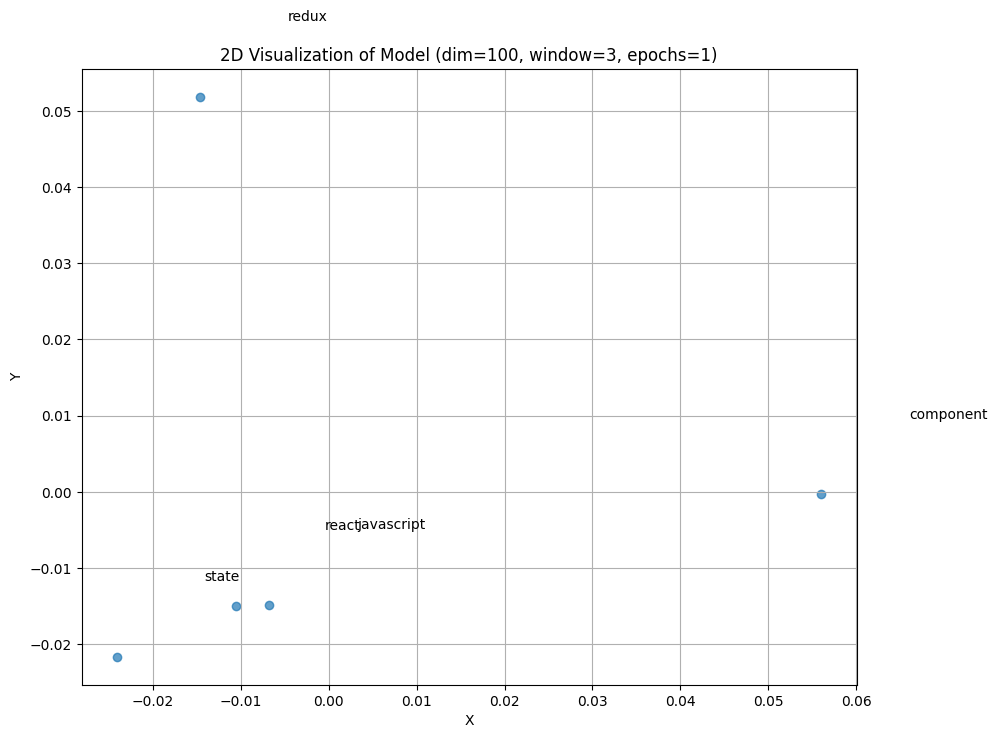


Loading model: /content/word2vec_models1/word2vec_model_dim100_window3_epochs10.model
Similarity between 'react' and 'component': -0.0836
Similarity between 'redux' and 'state': -0.0071
"Key 'framework' not present"
Word: react
Vector: [-9.5813731e-03  9.0032676e-03  4.1613169e-03  9.2098685e-03
  6.6493400e-03  2.8256974e-03  9.8280450e-03 -4.3136715e-03
 -6.8525374e-03  4.2353091e-03  3.7402906e-03 -5.7329517e-03
  9.7281253e-03 -3.5136067e-03  9.5491093e-03  8.1795128e-04
 -6.2969811e-03 -2.1041383e-03 -7.4188826e-03 -3.1034164e-03
  1.0432807e-03  9.4960332e-03  9.3502039e-03 -6.6875564e-03
  3.4352653e-03  2.2733146e-03 -2.5048049e-03 -9.3315858e-03
  1.0083448e-03 -8.1563601e-03  6.4024562e-03 -5.7573495e-03
  5.5427863e-03  9.7762924e-03 -1.8076351e-04  4.6404498e-03
 -1.7854309e-03  7.3274421e-03  3.9332863e-03 -9.1279028e-03
 -2.4173646e-03  3.5036437e-03 -1.2014745e-04 -1.2017412e-03
 -1.0361404e-03 -1.6741148e-03  5.5125210e-04  4.1336063e-03
 -4.2430749e-03 -3.8531495e-03 

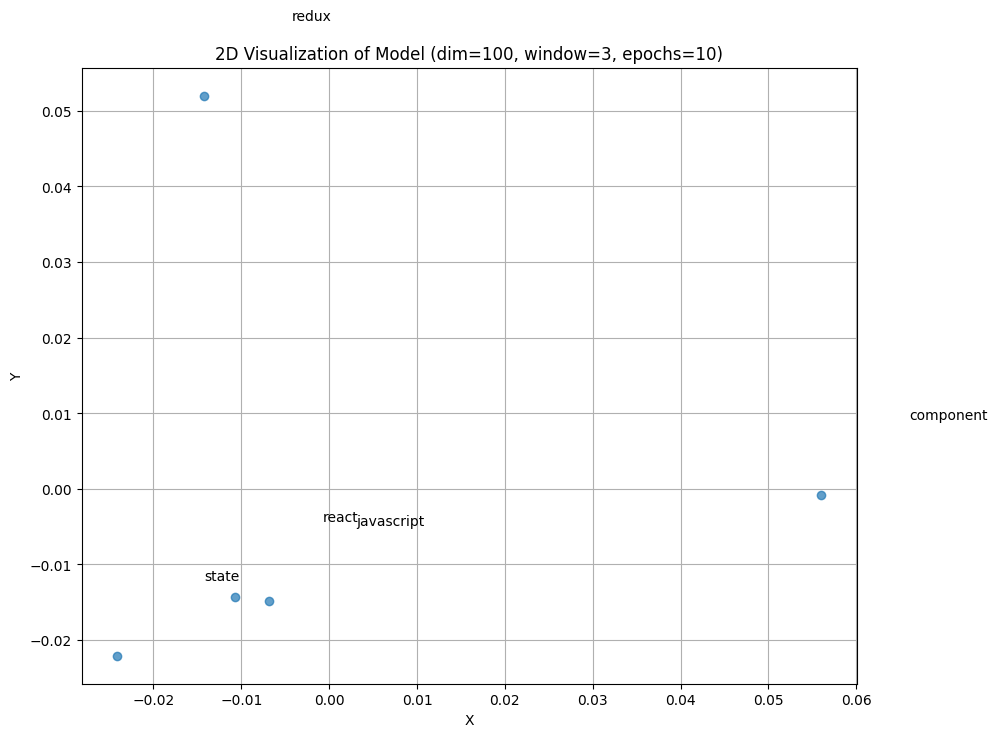


Loading model: /content/word2vec_models1/word2vec_model_dim100_window3_epochs100.model
Similarity between 'react' and 'component': 0.9412
Similarity between 'redux' and 'state': 0.9282
"Key 'framework' not present"
Word: react
Vector: [-0.02223385  0.03479368  0.00205451  0.00548987  0.00382727 -0.04670777
  0.02936494  0.05597119 -0.04307706  0.00378609  0.00776062 -0.04815405
  0.01117295  0.01418034  0.0197282   0.00042227  0.00292837 -0.06548579
 -0.03296505 -0.06632372  0.01511122  0.01824867  0.00104209 -0.03076821
 -0.01990771  0.00930723 -0.00098187 -0.04582171 -0.01152187 -0.00776577
  0.04731652  0.00335033  0.01283997 -0.01761949 -0.02067994  0.06102902
  0.01883673 -0.00559162 -0.00765324 -0.05508737 -0.00601951 -0.04645469
 -0.02132769  0.00510618  0.02181789 -0.00704545 -0.02043504 -0.00157541
  0.01764691  0.00245674  0.02565677 -0.02443139  0.02008486 -0.00228051
  0.00645994  0.01195301  0.01284668  0.01262521 -0.02494129  0.01984049
 -0.01201563  0.00278299  0.021227

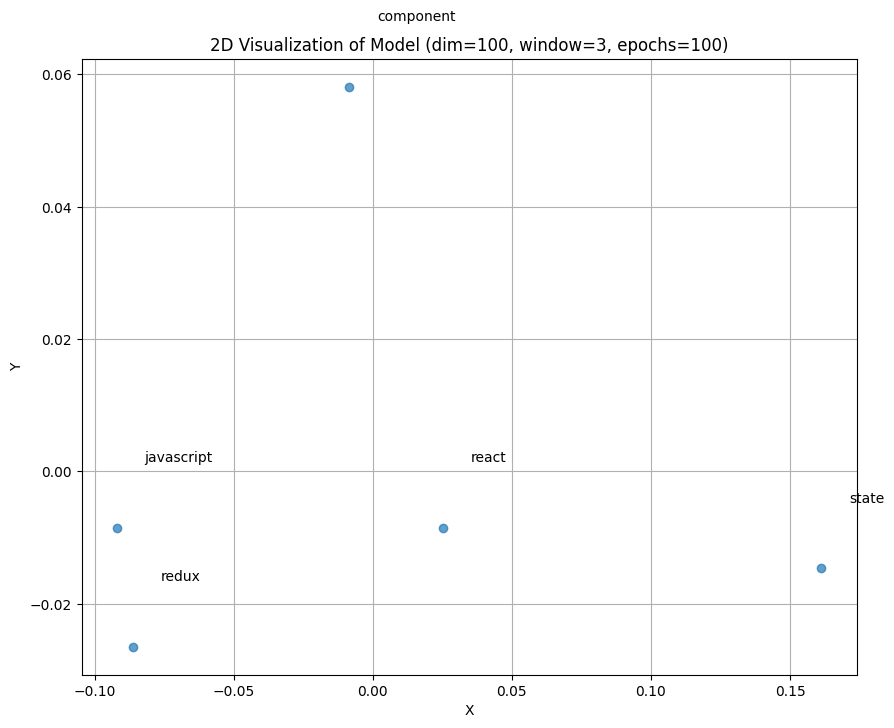


Loading model: /content/word2vec_models1/word2vec_model_dim100_window5_epochs1.model
Similarity between 'react' and 'component': -0.0848
Similarity between 'redux' and 'state': -0.0037
"Key 'framework' not present"
Word: react
Vector: [-9.5726736e-03  8.9456998e-03  4.1633947e-03  9.2386054e-03
  6.6445787e-03  2.9140157e-03  9.8062614e-03 -4.4195242e-03
 -6.8053450e-03  4.2232969e-03  3.7320824e-03 -5.6689023e-03
  9.7067291e-03 -3.5575968e-03  9.5525952e-03  8.3163934e-04
 -6.3410616e-03 -1.9798845e-03 -7.3774308e-03 -2.9829368e-03
  1.0396631e-03  9.4824294e-03  9.3574990e-03 -6.5988298e-03
  3.4724982e-03  2.2801091e-03 -2.4958961e-03 -9.2310617e-03
  1.0289242e-03 -8.1594335e-03  6.3168369e-03 -5.8002579e-03
  5.5417237e-03  9.8355636e-03 -1.6589492e-04  4.5329649e-03
 -1.8070989e-03  7.3563824e-03  3.9360835e-03 -9.0171620e-03
 -2.3957235e-03  3.6250916e-03 -9.7030934e-05 -1.1991499e-03
 -1.0513166e-03 -1.6671770e-03  5.9617386e-04  4.1604280e-03
 -4.2510661e-03 -3.8372306e-03 -

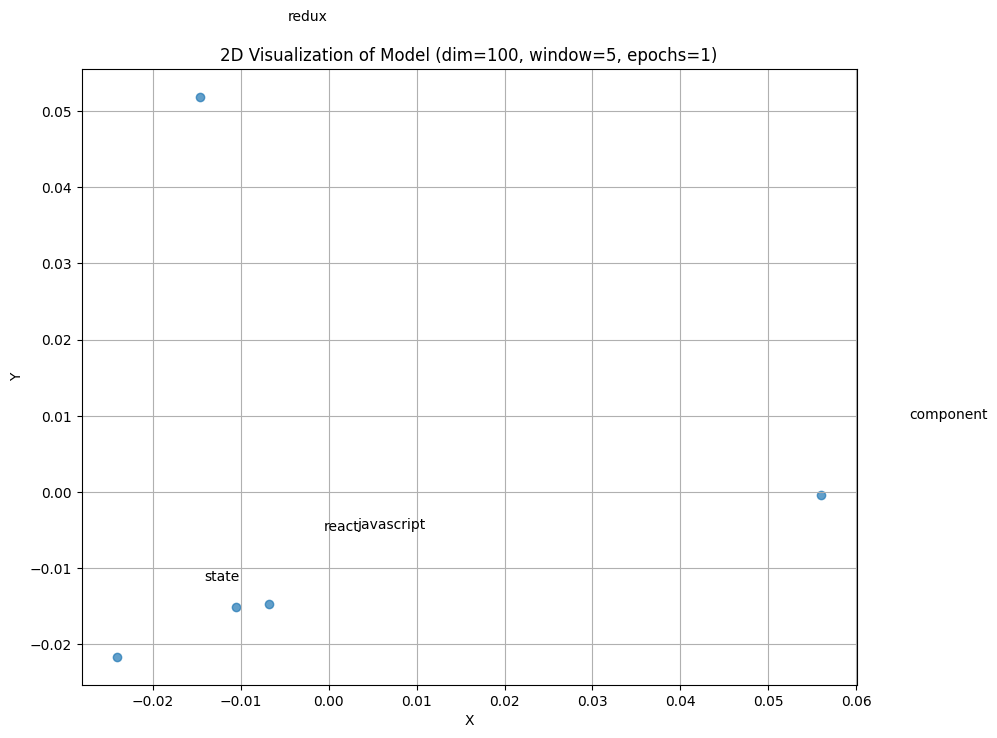


Loading model: /content/word2vec_models1/word2vec_model_dim100_window5_epochs10.model
Similarity between 'react' and 'component': -0.0800
Similarity between 'redux' and 'state': -0.0039
"Key 'framework' not present"
Word: react
Vector: [-9.6044950e-03  9.0100113e-03  4.2144754e-03  9.2545506e-03
  6.6368030e-03  2.5956249e-03  9.8705031e-03 -4.1134870e-03
 -7.0043346e-03  4.1999118e-03  3.7957367e-03 -5.9188846e-03
  9.8328451e-03 -3.4409359e-03  9.6562095e-03  8.3476253e-04
 -6.2959590e-03 -2.3103561e-03 -7.6168394e-03 -3.3628868e-03
  1.0419611e-03  9.6246302e-03  9.3574040e-03 -6.7795403e-03
  3.3175244e-03  2.4210929e-03 -2.5074340e-03 -9.4188359e-03
  9.8321075e-04 -8.1419135e-03  6.3912030e-03 -5.8713290e-03
  5.6485427e-03  9.6922331e-03 -3.3560360e-04  4.8667998e-03
 -1.7248986e-03  7.2647198e-03  3.8756540e-03 -9.3483478e-03
 -2.3547267e-03  3.3872796e-03 -1.9690454e-04 -1.1127077e-03
 -8.0912589e-04 -1.7300006e-03  3.9187589e-04  4.1192351e-03
 -4.1793771e-03 -3.7999460e-03 

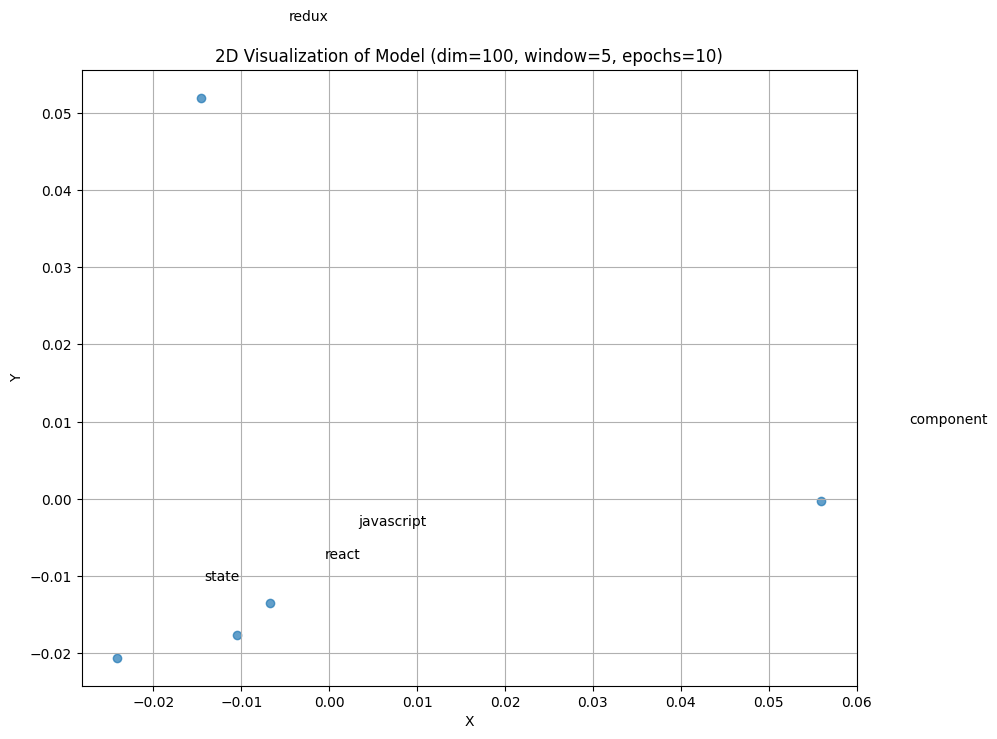


Loading model: /content/word2vec_models1/word2vec_model_dim100_window5_epochs100.model
Similarity between 'react' and 'component': 0.9919
Similarity between 'redux' and 'state': 0.9894
"Key 'framework' not present"
Word: react
Vector: [-0.03845055  0.06490839  0.00582369  0.0231411   0.01134196 -0.13646239
  0.05920523  0.15568084 -0.10999797  0.00249698  0.01572075 -0.13086182
  0.02876922  0.05347475  0.04430864  0.00366356  0.01613617 -0.14666094
 -0.07965434 -0.18473001  0.03392686  0.04524792 -0.00412773 -0.07130826
 -0.05042347  0.03607276 -0.01173366 -0.08218795 -0.02970122 -0.00810887
  0.07480448 -0.01461198  0.01945257 -0.05617268 -0.06519945  0.15464553
  0.0466307  -0.00973561 -0.03000378 -0.13505925  0.00577962 -0.11569657
 -0.06549404  0.02429616  0.09007169 -0.0040497  -0.07749596 -0.01220149
  0.05330868  0.03030588  0.02755919 -0.05479361  0.07200799 -0.01285349
  0.00316529  0.03979803  0.02346611  0.0415872  -0.0734029   0.08014572
 -0.01075594 -0.00710835  0.044197

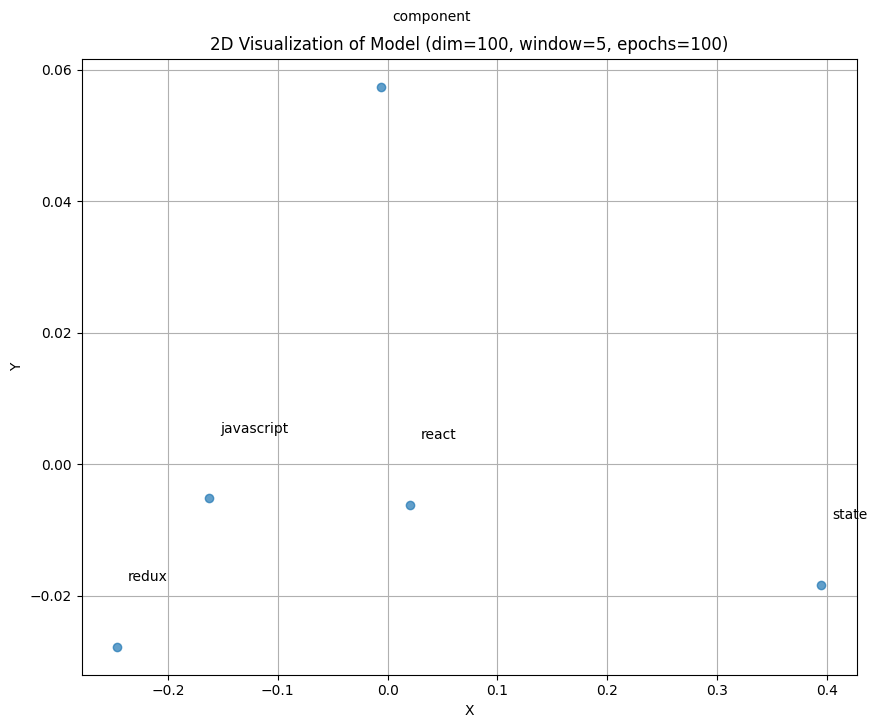


Loading model: /content/word2vec_models1/word2vec_model_dim100_window10_epochs1.model
Similarity between 'react' and 'component': -0.0848
Similarity between 'redux' and 'state': -0.0036
"Key 'framework' not present"
Word: react
Vector: [-9.5714703e-03  8.9422129e-03  4.1640294e-03  9.2322081e-03
  6.6462252e-03  2.9128084e-03  9.8015061e-03 -4.4107880e-03
 -6.7941737e-03  4.2219921e-03  3.7238919e-03 -5.6659160e-03
  9.7035700e-03 -3.5551272e-03  9.5459744e-03  8.3301228e-04
 -6.3430159e-03 -1.9837604e-03 -7.3743844e-03 -2.9850558e-03
  1.0427419e-03  9.4869230e-03  9.3569411e-03 -6.6007501e-03
  3.4741892e-03  2.2840325e-03 -2.4946455e-03 -9.2331944e-03
  1.0314856e-03 -8.1611359e-03  6.3160476e-03 -5.8004800e-03
  5.5447333e-03  9.8358989e-03 -1.6405166e-04  4.5290287e-03
 -1.8054290e-03  7.3588216e-03  3.9384719e-03 -9.0134377e-03
 -2.3951798e-03  3.6239303e-03 -9.8256074e-05 -1.2020589e-03
 -1.0485776e-03 -1.6702395e-03  6.0357805e-04  4.1604866e-03
 -4.2511774e-03 -3.8341195e-03 

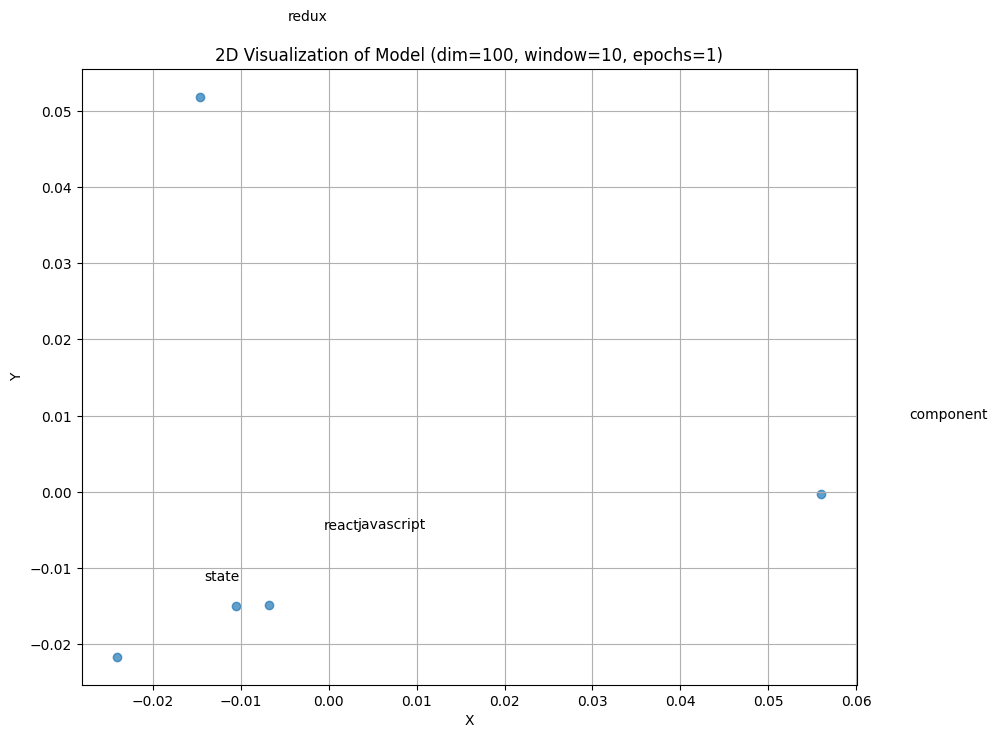


Loading model: /content/word2vec_models1/word2vec_model_dim100_window10_epochs10.model
Similarity between 'react' and 'component': -0.0834
Similarity between 'redux' and 'state': 0.0024
"Key 'framework' not present"
Word: react
Vector: [-9.7101890e-03  8.9735845e-03  4.1424604e-03  9.1646118e-03
  6.7266985e-03  2.6175685e-03  9.8326840e-03 -4.0320372e-03
 -6.9114417e-03  4.1620107e-03  3.7580407e-03 -5.8291806e-03
  9.6303755e-03 -3.4450514e-03  9.5485905e-03  9.3009655e-04
 -6.3204966e-03 -2.2774932e-03 -7.4991980e-03 -3.2528318e-03
  1.0784793e-03  9.5669376e-03  9.3702404e-03 -6.7362972e-03
  3.3652668e-03  2.3313854e-03 -2.4190582e-03 -9.3720462e-03
  9.3332247e-04 -8.1373993e-03  6.5432391e-03 -5.8014868e-03
  5.5463528e-03  9.7446702e-03 -2.5954406e-04  4.8446953e-03
 -1.6847044e-03  7.3237200e-03  3.8566373e-03 -9.1577787e-03
 -2.3825390e-03  3.3777410e-03 -1.7136024e-04 -1.2306024e-03
 -8.5806631e-04 -1.7433360e-03  5.5269594e-04  4.1437075e-03
 -4.2359736e-03 -3.8097692e-03 

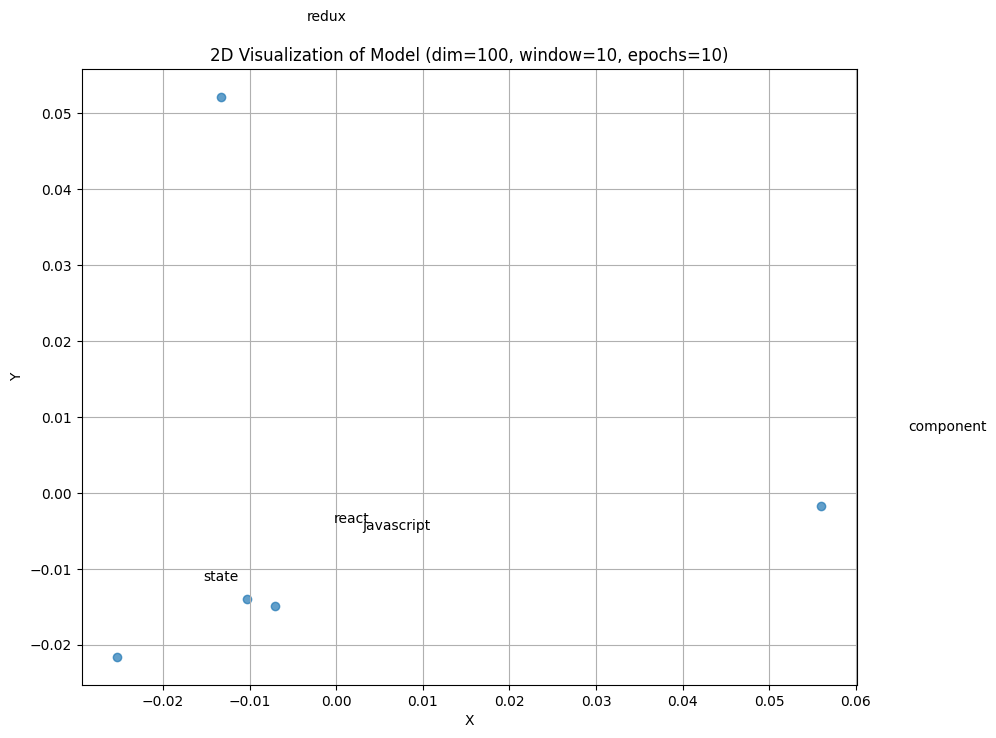


Loading model: /content/word2vec_models1/word2vec_model_dim100_window10_epochs100.model
Similarity between 'react' and 'component': 0.9981
Similarity between 'redux' and 'state': 0.9975
"Key 'framework' not present"
Word: react
Vector: [-0.12847874  0.10935401  0.00795862 -0.04132073  0.03452414 -0.3988148
  0.1309076   0.46010974 -0.21214794 -0.07408434  0.02951079 -0.28595528
  0.01220522  0.11073319  0.01769897  0.02894924  0.06793605 -0.38581774
 -0.19231649 -0.4543459   0.08286322  0.0746958  -0.03322639 -0.16532412
 -0.1328199   0.06796004  0.02418844 -0.1911163  -0.13723813 -0.00052276
  0.23723553  0.00610934  0.04019293 -0.1689131  -0.12485355  0.38347
  0.1466925  -0.05823711 -0.06920984 -0.2701747  -0.02173622 -0.30725574
 -0.16516723 -0.01614986  0.24679059 -0.0538811  -0.13561843 -0.02027654
  0.09645273  0.08423587  0.09045456 -0.14246754  0.11337093 -0.02775475
 -0.02012814  0.07940771  0.0788748   0.07026672 -0.16833587  0.22394365
 -0.02865285 -0.01168789  0.12670165 

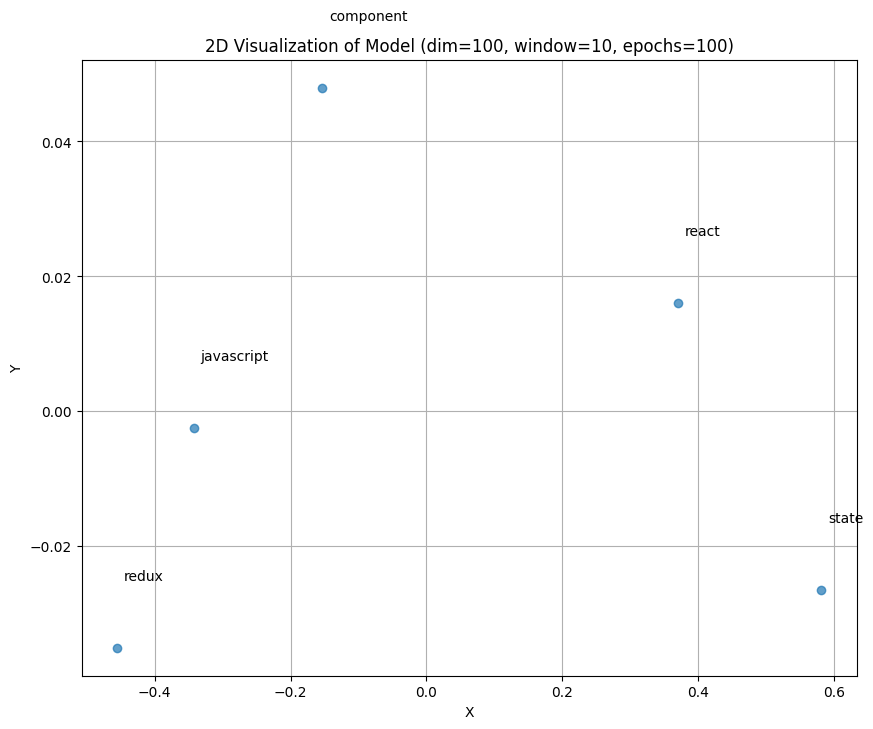

In [52]:
import os
from gensim.models import Word2Vec
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Directory where the models are saved
models_dir = '/content/word2vec_models1'

# Function to load a model and find word similarities
def find_word_similarity(model, word1, word2):
    try:
        similarity = model.wv.similarity(word1, word2)
        print(f"Similarity between '{word1}' and '{word2}': {similarity:.4f}")
    except KeyError as e:
        print(e)

# Function to print vectors for words
def print_word_vectors(model, words):
    for word in words:
        try:
            vector = model.wv[word]
            print(f"Word: {word}")
            print(f"Vector: {vector}\n")
        except KeyError:
            print(f"Word '{word}' not found in the vocabulary.")

# Function to plot word embeddings in 2D
def plot_model_embeddings_2d(model, words, method='pca', title='2D Model Embeddings'):
    # Extract specific word vectors
    word_vectors = np.array([model.wv[word] for word in words if word in model.wv])
    words_present = [word for word in words if word in model.wv]

    # Check if any vectors are available for plotting
    if len(word_vectors) == 0:
        print("No vectors to plot.")
        return

    # Choose dimensionality reduction method
    if method == 'pca':
        reducer = PCA(n_components=2)
    else:
        reducer = TSNE(n_components=2, random_state=42)

    # Reduce the word vectors to 2D
    embeddings_2d = reducer.fit_transform(word_vectors)

    plt.figure(figsize=(10, 8))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], marker='o', alpha=0.7)

    # Annotate words
    for i, word in enumerate(words_present):
        plt.text(embeddings_2d[i, 0] + 0.01, embeddings_2d[i, 1] + 0.01, word, fontsize=10)

    plt.title(title)
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

# Choose words to analyze
word_pairs = [
    ('react', 'component'),
    ('redux', 'state'),
    ('javascript', 'framework')
]

# Load and analyze each model
for dim in [10, 50, 100]:  # Vector dimensions
    for window in [3, 5, 10]:  # Context window sizes
        for epoch in [1, 10, 100]:  # Number of training epochs
            # Load the model
            model_filename = f"word2vec_model_dim{dim}_window{window}_epochs{epoch}.model"
            model_path = os.path.join(models_dir, model_filename)

            if os.path.exists(model_path):
                print(f"\nLoading model: {model_path}")
                model = Word2Vec.load(model_path)

                # Print word similarities and vectors
                for word1, word2 in word_pairs:
                    find_word_similarity(model, word1, word2)
                print_word_vectors(model, [word1 for pair in word_pairs for word1 in pair])

                # Plot 2D visualization of the word pairs
                plot_model_embeddings_2d(model, [word for pair in word_pairs for word in pair], method='pca', title=f'2D Visualization of Model (dim={dim}, window={window}, epochs={epoch})')
